In [1]:
import numpy as np
import time
import matplotlib.pyplot as plt
import numba as nb
from scipy.stats import median_abs_deviation
from scipy import linalg
import rfitools
import importlib
from scipy.ndimage import median_filter
import os
from datetime import datetime
from astropy.coordinates import EarthLocation, SkyCoord, AltAz
from astropy.time import Time
import matplotlib.colors as mcolors

In [2]:
importlib.reload(rfitools)

<module 'rfitools' from '/home/thomasb/albatros_analysis/scripts/mapmaking/rfitools.py'>

In [3]:
fname="/scratch/thomasb/mohan/visibilities_mars_20250722/vis_1753200150:1753286400_bit=1_ant=7_pol=2_cha=360:392_tim=160652_upx=64_acc=512_ipfb=0.2_complex64_regular_20251024T003558.npy"

In [4]:
start_specnum = 1273601

In [5]:
osamp=64
dt = 512 * 4096*osamp/250e6
df = 250e6/4096/osamp
nant=7
ntime = 86400*2
nblt = ntime*nant**2//2
nfreq = 2048
npol=2
triu_idx=np.triu_indices(nant,k=1)
nbl = len(triu_idx[0])
print("num ant", nant, "num baselines", nbl)
freqs = np.arange(360*osamp,392*osamp)/osamp
tstart=1753200150

num ant 7 num baselines 21


In [6]:
arr = rfitools.read_file(fname,3212,50,2048,7,512)

loading 84200.6528 seconds
read 0
read time 0.09231925010681152 fill time 981.1913542747498
read 10
read time 1.928802728652954 fill time 0.15871167182922363
read 20
read time 0.24931764602661133 fill time 0.041315317153930664
read 30
read time 0.206834077835083 fill time 0.038361310958862305
read 40
read time 0.19722318649291992 fill time 0.03804922103881836
read 50
read time 0.196913480758667 fill time 0.03785347938537598
read 60
read time 0.2068467140197754 fill time 0.037705183029174805
read 70
read time 0.43332839012145996 fill time 0.037523746490478516
read 80
read time 0.2285778522491455 fill time 0.042053937911987305
read 90
read time 0.2646956443786621 fill time 0.038791656494140625
read 100
read time 0.24137544631958008 fill time 0.04051661491394043
read 110
read time 0.24352359771728516 fill time 0.038819313049316406
read 120
read time 0.20652341842651367 fill time 0.039304256439208984
read 130
read time 0.20171546936035156 fill time 0.03856086730957031
read 140
read time 0.

In [7]:
arr.shape

(160600, 2048, 28)

In [8]:
UTC_per_spec = 1.638401491028474e-05
UTC_offset = 1753200128.4654782 #old

In [9]:
UTC_per_spec = 1.6384016564501453e-05
UTC_offset = 1753200128.4216924 #new

In [10]:
UTC_correction = start_specnum * UTC_per_spec + UTC_offset - tstart
UTC_correction

-0.7116076946258545

In [11]:
tstart = tstart + UTC_correction
tend = tstart + arr.shape[0]*dt + UTC_correction
print(tstart, tend)

1753200149.2883923 1753286370.0452518


In [12]:
# coords = {
#         0: [79.41717895, -90.76721818, 188.095], #MARS1
#         1: [79.41720143, -90.75876445, 182.9661], #MARS2
#         2: [79.38845797, -91.01936185, 19.777], #CSA
#         3: [79.4183154, -90.667425, 59.364], #Mars 5
#         4: [79.3979952, -90.799868, 42.692], #Mars 6
#         5: [79.41148497, -90.69528512, 32.593], #Mars 7
#         6: [79.44377162, -90.71824306, 416.829] #MARS8
#     }

coords = {
        0: [79.417161473, -90.767238685, 187.9577], #MARS1
        1: [79.417198047, -90.758739192, 183.0684], #MARS2
        2: [79.388456412, -91.019202963, 25.1938], #CSA
        3: [79.418302573, -90.667395452, 59.6242], #Mars 5
        4: [79.397984238, -90.799842408, 41.6994], #Mars 6
        5: [79.411474117, -90.695266129, 31.6314], #Mars 7
        6: [79.443757694, -90.718202634, 414.9131] #MARS8
    }
antmap = {0:"MARS1", 1:"MARS2",2:"MARS4",3:"MARS5",4:"MARS6",5:"MARS7",6:"MARS8"}
ant0=EarthLocation.from_geodetic(lat=coords[0][0], lon=coords[0][1], height=coords[0][2])


In [13]:
src_dt = 10 #s
npts = int((tend-tstart)//src_dt)
coarse_tarr = np.linspace(tstart,tend,npts)
# src3 = SkyCoord(ra='05h 34m 31.97s', dec="22° 00′ 52.1″", frame='icrs') # Tau A
t_utc_arr = Time(coarse_tarr, format='unix', scale='utc')
src1 = SkyCoord(ra='23h 23m 27.94s', dec="58° 48′ 42.4″", frame='icrs') #cas A
src2 = SkyCoord(ra='19h 59m 28.3566s', dec="40° 44′ 02.096″", frame='icrs') #Cyg A
altaz1=src1.transform_to(AltAz(location=ant0,obstime=t_utc_arr))
altaz2=src2.transform_to(AltAz(location=ant0,obstime=t_utc_arr))

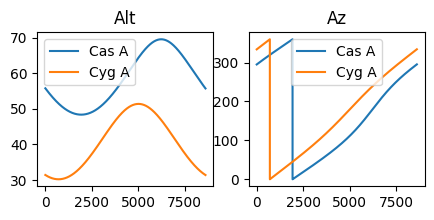

In [14]:
fig=plt.gcf()
fig.set_size_inches(5,2)
plt.subplot(121)
plt.title("Alt")
plt.plot(altaz1.alt,label='Cas A')
plt.plot(altaz2.alt,label='Cyg A')
plt.legend()
plt.subplot(122)
plt.title("Az")
plt.plot(altaz1.az,label='Cas A')
plt.plot(altaz2.az,label='Cyg A')
plt.legend()

In [19]:
bl_enus = rfitools.get_all_bls(coords,np.arange(len(coords)))
print(bl_enus.shape)
geo_delays_bl = np.zeros((len(bl_enus), arr.shape[0]),dtype='float64')
fine_tarr = np.linspace(tstart,tend,arr.shape[0])


gd1 = rfitools.geo_delay_from_enu(bl_enus,np.deg2rad(altaz1.az.value),np.deg2rad(altaz1.alt.value))
gd2 = rfitools.geo_delay_from_enu(bl_enus,np.deg2rad(altaz2.az.value),np.deg2rad(altaz2.alt.value))
print(gd2.shape)
for i in range(len(bl_enus)):
    geo_delays_bl[i] = np.interp(fine_tarr, coarse_tarr, gd2[i,:])

(21, 3)
(21, 3)
(21, 8622)


In [20]:
np.max(np.abs(geo_delays_bl))

np.float64(2.504286640721998e-05)

In [21]:
1/2.5e-05/6.28

6369.426751592357

Text(0, 0.5, 'geo delay ($\\mu$s)')

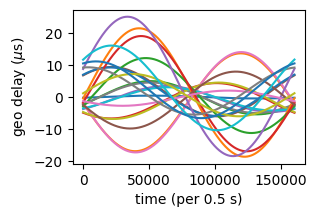

In [22]:
fig=plt.gcf()
fig.set_size_inches(3,2)
_=plt.plot(geo_delays_bl.T*1e6)
plt.xlabel("time (per 0.5 s)")
plt.ylabel("geo delay ($\mu$s)")

In [23]:
max1 = coarse_tarr[np.argmax(altaz1.alt.value)]
finetmax = int(np.argmin(np.abs(fine_tarr-max1)))
finetst = int(np.argmin(np.abs(fine_tarr-max1)) - 100/dt)
fineten = int(np.argmin(np.abs(fine_tarr-max1)) + 100/dt)
print(finetst,fineten)

116020 116393


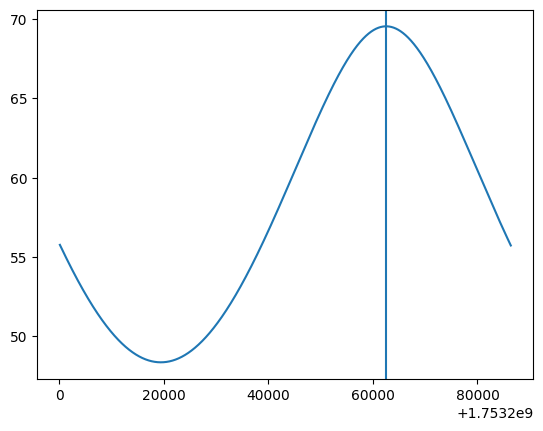

In [24]:
plt.plot(coarse_tarr,altaz1.alt.value)
plt.axvline(max1)

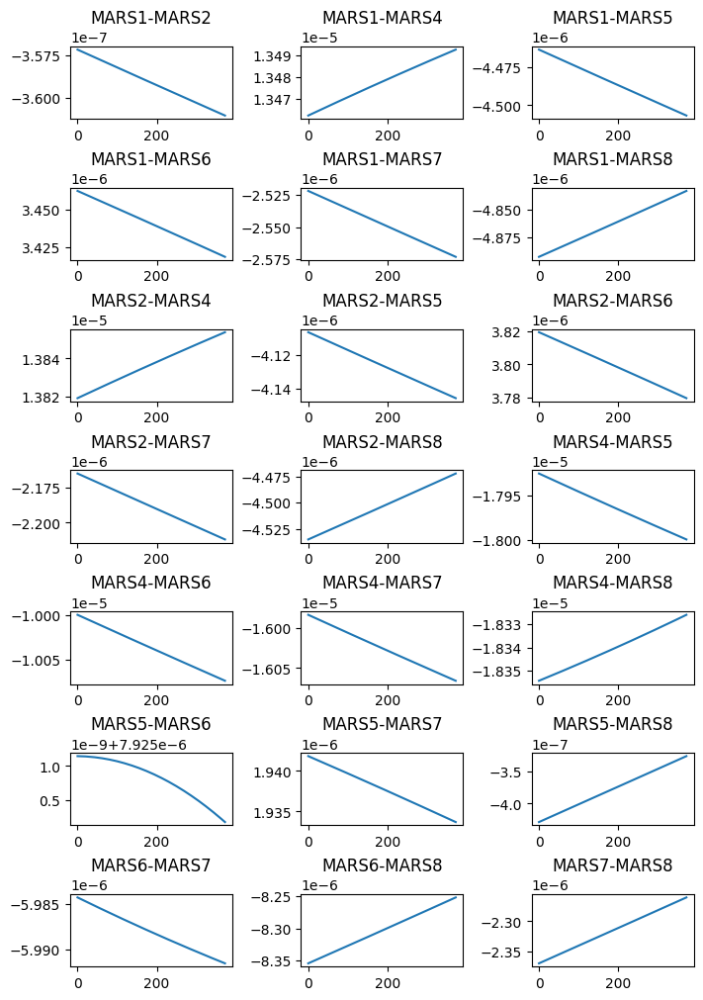

In [25]:
fig,ax = plt.subplots(7,3, layout='constrained')
fig.set_size_inches(7,10)
ax=np.ravel(ax)
pnum=0
for i in range(nbl):
    ai = triu_idx[0][i]
    aj = triu_idx[1][i]
    ax[i].set_title(f"{antmap[ai]}-{antmap[aj]}")
    # img=ax[pnum].plot(np.diff(geo_delays_bl[i][finetst:fineten]))
    img=ax[pnum].plot(geo_delays_bl[i][finetst:fineten])
    # img=ax[pnum].plot(geo_delays_bl[i])
    # ax[pnum].axvline(finetmax)
    pnum+=1

In [26]:
2* np.pi * 21e6 * 4.5e-10 * 1/dt # sec averaging

0.11059660679259727

In [27]:
1/6e-6 / (2*np.pi) # this much bw for 1 rad phase change across freq


26525.823848649223

In [28]:
2* np.pi * 10e3 * 6e-6

0.3769911184307752

In [29]:
1/2e-5/(2*np.pi) #MARSA4-MARS8, 1 rad in 8 kHz, MAX

7957.747154594766

In [30]:
#10 ns per 10 s (MAX)

In [31]:
1/21e6/(2*np.pi) #this is max channel width one can tolerate

7.578806813899778e-09

In [32]:
5e-9 * 21e6 * 2 * np.pi # max averaging time one can tolerate

0.6597344572538565

In [33]:
7.3e-5 * 1e4/(3e8/21e6) *np.cos(np.deg2rad(59)) * 5.3 * 6.28 # overestimate from fringe frequency, u ~ baseline length / lamda

np.float64(0.8759831442791488)

In [34]:
masks = []
kf=3
kt=3
kp=5
for i in range(nbl):
    ai = triu_idx[0][i]
    aj = triu_idx[1][i]
    # if ai==aj or ai==1 or aj==1: 
    #     continue #skip autos and MARS2
    vis = arr[:,:,i + ai + 1]
    vis_amp = np.abs(vis)
    med_spec = rfitools.fast_median(vis_amp,axis=0)
    # med_spec_test = np.median(vis_amp,axis=0)
    # assert np.array_equal(med_spec, med_spec_test)
    # print(med_spec.shape)
    folded_med_spec = med_spec.reshape(-1,64)
    folded_med_spec_med = np.median(folded_med_spec[:-2,:],axis=0)
    # plt.plot(folded_med_spec_med)
    vis_amp_flat = vis_amp/np.tile(folded_med_spec_med,folded_med_spec.shape[0])
    time_window = int(600/dt) # 10 minute window
    med_time = rfitools.fast_median(vis_amp_flat,axis=1)
    # med_time_test = np.median(vis_amp_flat,axis=1)
    # assert np.array_equal(med_time, med_time_test)
    
    tp = median_filter(med_time,time_window)
    vis_amp_double_flat = vis_amp_flat/tp[:, None]
    time_mask , time_score = rfitools.time_mask(vis_amp_double_flat, kt)
    freq_mask , freq_score = rfitools.freq_mask(vis_amp_double_flat, kf)
    time_flagged_fraction = np.sum(time_mask)/len(time_mask)
    freq_flagged_fraction = np.sum(freq_mask)/len(freq_mask)
    # plt.clf()
    # fig=plt.gcf()
    # fig.set_size_inches(10,4)
    # plt.suptitle(f"{antmap[ai]}-{antmap[aj]}")
    # plt.subplot(121)
    # plt.title(f"time flag {time_flagged_fraction*100:.1f}%")
    # ax=plt.gca()
    # ax2=ax.twinx()
    # ax.plot(time_score)
    # ax2.plot(time_mask, ls='dotted',c='green')
    # plt.subplot(122)
    # plt.title(f"freq flag {freq_flagged_fraction*100:.1f}%")
    # ax=plt.gca()
    # ax2=ax.twinx()
    # ax.plot(freq_score)
    # ax2.plot(freq_mask, ls='dotted',c='green')
    # plt.tight_layout()
    # plt.savefig(os.path.join(imgdir, f"{antmap[ai]}-{antmap[aj]}_time_flagging.png"),dpi=300)
    sign_geo = -1
    sign_clock = -1
    mask = time_mask[:,None] | freq_mask[None,:]
    masks.append(mask)
    print("processed", i, antmap[ai],antmap[aj], f"time {time_flagged_fraction*100:.1f}% freq {freq_flagged_fraction*100:.1f}%")

processed 0 MARS1 MARS2 time 2.1% freq 18.1%
processed 1 MARS1 MARS4 time 0.3% freq 9.4%
processed 2 MARS1 MARS5 time 0.6% freq 9.0%
processed 3 MARS1 MARS6 time 0.4% freq 6.8%
processed 4 MARS1 MARS7 time 0.7% freq 9.5%
processed 5 MARS1 MARS8 time 0.4% freq 10.7%
processed 6 MARS2 MARS4 time 0.3% freq 17.6%
processed 7 MARS2 MARS5 time 0.6% freq 17.3%
processed 8 MARS2 MARS6 time 0.5% freq 7.0%
processed 9 MARS2 MARS7 time 0.6% freq 16.8%
processed 10 MARS2 MARS8 time 0.4% freq 18.4%
processed 11 MARS4 MARS5 time 0.3% freq 8.1%
processed 12 MARS4 MARS6 time 0.4% freq 7.9%
processed 13 MARS4 MARS7 time 0.3% freq 9.6%
processed 14 MARS4 MARS8 time 0.3% freq 10.0%
processed 15 MARS5 MARS6 time 0.4% freq 7.1%
processed 16 MARS5 MARS7 time 1.0% freq 8.9%
processed 17 MARS5 MARS8 time 0.5% freq 9.9%
processed 18 MARS6 MARS7 time 0.4% freq 6.8%
processed 19 MARS6 MARS8 time 0.3% freq 7.4%
processed 20 MARS7 MARS8 time 0.4% freq 10.2%


In [35]:
arr.shape

(160600, 2048, 28)

In [177]:
npmasks = np.zeros((nbl, arr.shape[0], arr.shape[1]),dtype='bool',order='C')
for i in range(nbl):
    npmasks[i,:,:]=masks[i]

In [178]:
npmasks.shape

(21, 160600, 2048)

In [36]:
satpulse_ctime_utc_old = [1.75320469e9,1.75321070e9,1.75321587e9,1.75321670e9,1.75322203e9,1.75324661e9,1.75325269e9,1.75326483e9,1.75327074e9,1.75327699e9,1.75328368e9]
satpulse_ctime_utc = [1753204687, 1753210702, 1753215871, 1753216701, 1753222027, 1753246608, 1753252692, 1753264834, 1753270743, 1753276981, 1753283679]
satpulse_clock_offsets_old = {1: [-3061.43258452, -3043.76855715, -3011.91303561, -3037.42208136, -3006.09624012, -2983.42710897, -3065.46495835, -3016.90309033, -3037.03734265, -3068.41861811, -3032.98508345], 
                          2: [-21437.01046867, -21429.55164617, -21391.812358 , -21425.94700186, -21416.01953704, -21385.31088282, -21493.32050841, -21416.29140234, -21429.94676093, -21432.8766367 , -21533.32852978], 
                          3: [7765.1035011 , 7762.26539252, 7854.69376087, 7854.77277417, 7929.9753344 , 8112.87828043, 7982.05520223, 8116.87952358, 8193.57732658, 8214.8790532 , 8154.20227953],
                          4: [-3636.7671375 , -3624.21706571, -3624.58449886, -3621.82458686, -3597.9132698 , -3571.04640225, -3669.51923098, -3618.11367634, -3626.1205002 , -3623.6461455 , -3646.98285581], 
                          5: [-4095.583246 , -4119.10058827, -4101.34861048, -4105.35073278, -4105.63630621, -4107.39752412, -4157.7678568 , -4168.10657876, -4148.46872877, -4183.89933684, -4211.09494306],
                          6: [8418.65716072, 8389.04102617, 8407.05496453, 8395.27164217, 8438.17478417, 8385.21635034, 8332.69859802, 8370.29165842, 8351.87898724, 8335.2087461 , 8294.89258833]}

satpulse_clock_offsets = {1: [-3055.41058874, -3038.45549417, -3015.19664198, -3032.86076397, -3006.26641679, -2977.32071656, -3059.99981288, -3013.79261271, -3031.66644718, -3066.51992144, -3027.24267187], 
                          2: [-21415.41194636, -21410.93294711, -21390.47898095, -21406.53530291, -21415.50638689, -21355.29366393, -21475.28921541, -21398.62021694, -21411.95693825, -21431.03461739, -21520.56607438], 
                          3: [7769.17518971, 7766.62983059, 7853.0285673,7859.13317231, 7927.54855642, 8116.07357956, 7985.36771746, 8120.82947898, 8197.81139602, 8220.48351579,8158.15486639],
                          4: [-3635.0900596, -3622.20638168, -3627.76753542, -3619.67450262, -3599.22877196, -3570.83525086, -3667.57457937, -3619.40263906, -3624.56503691, -3625.28675372, -3645.44175114], 
                          5: [-4093.27468443, -4116.81453095, -4104.88902159, -4103.16119251, -4107.92531424, -4104.90460545, -4155.8631267, -4168.34570371, -4146.55093964, -4184.56869501, -4209.1006079],
                          6: [8420.77587908,8390.65131987, 8398.17205085, 8396.57896172, 8431.15274467, 8387.59916099, 8335.81496936, 8371.67106039, 8353.29912786, 8332.77273988, 8296.76815095]}
clock_delays = np.zeros((nant, arr.shape[0]),dtype='float64')

for i in range(1,nant):
    clock_delays[i,:] = np.interp(fine_tarr, satpulse_ctime_utc,satpulse_clock_offsets[i])

In [37]:
satpulse_clock_offsets_full = {1753204687: np.array([[ -3055.03228762,  -3055.06700888,  -3054.89444477,
         -3054.88480597,  -3055.00092101,  -3054.61907493,
         -3054.55261639,  -3054.79036457,  -3054.74248547,
         -3054.79820881,  -3054.81071456,  -3054.70264998,
         -3054.7119864 ,  -3054.96592388,  -3055.02119351,
         -3055.09430398,  -3055.27114021,  -3055.28996195,
         -3055.1131479 ,  -3055.29626415,  -3055.08772705,
         -3054.9171488 ,  -3055.07519555,  -3055.17393135,
         -3055.26863442,  -3055.18829796,  -3055.1716913 ,
         -3055.20094019,  -3055.28100315,  -3055.41491681,
         -3055.38258186,  -3055.33262271,  -3055.30707362,
         -3055.28261253,  -3055.51021712,  -3055.5027391 ,
         -3055.34442176,  -3055.2665184 ,  -3055.29223415,
         -3055.09992054,  -3055.12463388,  -3055.16395911,
         -3055.30861109,  -3055.22117299,  -3055.45701515,
         -3055.59571566,  -3055.74552484,  -3055.64738955,
         -3055.63698693,  -3055.45757   ,  -3055.44895138,
         -3055.55578563,  -3055.63201117,  -3055.54948659,
         -3055.60103539,  -3055.63848599,  -3055.70566718,
         -3055.6802035 ,  -3055.37485578,  -3055.38876936,
         -3055.48068775,  -3055.57354009,  -3055.74313631,
         -3055.65060221,  -3055.55367899,  -3055.59642666,
         -3055.57930891,  -3055.72427204,  -3055.71772729,
         -3055.73251182,  -3055.76451801,  -3055.96297371,
         -3056.15944039,  -3056.01404325,  -3055.89177288,
         -3055.87247376,  -3056.07516115,  -3055.94293316,
         -3055.85826694,  -3055.66444792,  -3055.63711261,
         -3055.7032739 ,  -3055.49484734,  -3055.32975482,
         -3055.27788685,  -3055.36219022,  -3055.32350677,
         -3055.24437973,  -3055.31170008,  -3055.44569519,
         -3055.43680754,  -3055.47704904,  -3055.56352289,
         -3055.53170447,  -3055.42507361,  -3055.46988978,
         -3055.63418759,  -3055.62300516,  -3055.37728656,
         -3055.43214274,  -3055.50074091,  -3055.5737909 ,
         -3055.53181838,  -3055.41734955,  -3055.29989724,
         -3055.56542985,  -3055.80029693,  -3055.39444236,
         -3055.55023325,  -3055.95165901,  -3055.66648048,
         -3055.78617816,  -3055.71642864,  -3055.72541847,
         -3055.65267965,  -3055.3718595 ,  -3055.49035914,
         -3055.29220528,  -3055.17808116,  -3055.45259526],
       [-21420.42310428, -21420.3950001 , -21419.34053327,
        -21419.70923167, -21417.75311832, -21419.44564031,
        -21419.58190294, -21420.35780808, -21419.9227256 ,
        -21418.66125898, -21419.330863  , -21419.53755073,
        -21419.42562076, -21418.55422626, -21418.6879364 ,
        -21418.80486835, -21419.86568614, -21418.00559772,
        -21419.57145983, -21418.79814431, -21417.86663268,
        -21418.89876785, -21419.32370206, -21419.84168147,
        -21419.17272246, -21419.33683245, -21420.14287377,
        -21420.59023093, -21420.05038969, -21419.58675211,
        -21420.27964847, -21420.32278944, -21420.30987267,
        -21420.27125011, -21420.65009296, -21420.26681134,
        -21420.8196997 , -21420.56339261, -21419.81667716,
        -21417.0695502 , -21414.47240974, -21414.6536002 ,
        -21414.13150927, -21415.49767012, -21414.83576723,
        -21413.99312932, -21413.8035502 , -21414.56996621,
        -21413.50341189, -21413.9948788 , -21414.66026225,
        -21413.70769456, -21413.58171216, -21413.78606462,
        -21413.89939503, -21414.50141519, -21413.45994491,
        -21413.84807885, -21413.67279646, -21413.02619535,
        -21412.41755966, -21413.09345922, -21413.06887476,
        -21413.60007625, -21412.87545523, -21412.68838028,
        -21413.63152643, -21413.22836081, -21414.6359635 ,
        -21414.45956466, -21412.43703774, -21412.34604277,
        -21413.21120017, -21414.26460843, -21413.60937609,
        -21413.07025404, -21412.87894123, -21413.49314243,
        -21413.71577183, -21411.80859154, -21413.30975523,
        -21413.42311673, -21413.32326293, -21412.98987108,
        -21413.0169202 , -21413.40123196, -21413.66768291,
        -21412.9688737 , -21412.46248604, -21413.42720004,
        -21413.44957408, -21413.20200348, -21413.66479769,
        -21413.83015618, -21413.09426308, -21411.54488886,
        -21412.47702024, -21412.19821308, -21412.49994227,
        -21413.06723633, -21412.36078136, -21412.37761089,
        -21412.34329157, -21412.45984904, -21412.97031924,
        -21412.52245632, -21412.19092864, -21413.33791922,
        -21413.74468356, -21413.06772012, -21413.4499406 ,
        -21413.15931355, -21412.43708929, -21413.04769443,
        -21412.81799481, -21412.82798398, -21413.27328251,
        -21414.03706389, -21414.03022071, -21414.47263729],
       [  7769.43197742,   7768.3890224 ,   7768.99244879,
          7768.62135802,   7767.23542396,   7769.09162792,
          7769.61130725,   7768.69810306,   7769.16927522,
          7767.89926666,   7769.13697663,   7768.63896942,
          7767.56282133,   7767.57153222,   7768.03424516,
          7767.74912677,   7767.83797905,   7768.30001929,
          7768.44905953,   7767.2806923 ,   7767.83701441,
          7768.43411077,   7768.175713  ,   7768.00465898,
          7768.80535783,   7768.66225738,   7769.98092225,
          7769.7222277 ,   7768.65514362,   7768.66128063,
          7769.36108339,   7768.99443749,   7769.05807315,
          7769.41836513,   7768.28257325,   7769.03324554,
          7769.08376192,   7768.26036771,   7768.91372315,
          7768.92108697,   7770.11969192,   7769.55128718,
          7770.37532014,   7770.69863196,   7769.30472283,
          7769.49474061,   7768.65234412,   7769.02640672,
          7769.50378252,   7770.06669505,   7770.5514944 ,
          7769.73244665,   7769.29802499,   7769.57669214,
          7769.4715308 ,   7770.07755311,   7769.18789188,
          7769.46277278,   7769.47402823,   7769.18554403,
          7768.87927037,   7769.293754  ,   7768.88536008,
          7769.71518745,   7768.71657051,   7769.12101543,
          7769.92836079,   7770.08756963,   7771.17184172,
          7769.08597659,   7768.43112439,   7769.1299074 ,
          7769.58340271,   7770.19904413,   7769.30581746,
          7769.01085332,   7768.73908885,   7769.94767654,
          7768.25087902,   7768.37211213,   7769.88959805,
          7769.58842572,   7769.44189952,   7769.32424112,
          7769.8511694 ,   7770.64119488,   7770.31171066,
          7769.26580753,   7769.63350492,   7769.88750411,
          7770.52432609,   7769.63639166,   7770.63081072,
          7770.33867985,   7769.45779505,   7768.75349545,
          7768.95499588,   7769.42878998,   7769.55019287,
          7769.70345358,   7768.78883751,   7769.55605707,
          7769.46125647,   7769.79401613,   7769.45209945,
          7768.45324623,   7768.48257438,   7770.17264016,
          7769.51601766,   7769.60119936,   7769.41933765,
          7768.38686948,   7767.94593728,   7768.58478425,
          7768.03498406,   7768.74202254,   7769.20653851,
          7770.38792715,   7769.75685794,   7769.83252356],
       [ -3634.07282597,  -3634.97022355,  -3634.61236512,
         -3634.71753486,  -3635.91948365,  -3634.68378281,
         -3634.12629813,  -3634.71790173,  -3634.58884129,
         -3635.31783909,  -3634.35052681,  -3634.61002243,
         -3635.13716745,  -3635.16983459,  -3635.09667895,
         -3635.17174139,  -3635.33676616,  -3635.2917944 ,
         -3634.77581917,  -3635.78036699,  -3635.44862911,
         -3634.95913672,  -3635.4061184 ,  -3635.66745826,
         -3635.4116354 ,  -3635.55704902,  -3634.79649161,
         -3634.80549567,  -3635.62482404,  -3635.58072907,
         -3635.16638838,  -3635.35904431,  -3635.30940487,
         -3635.04177458,  -3635.74417021,  -3635.5194315 ,
         -3635.24608517,  -3635.76384133,  -3635.46045392,
         -3635.37943913,  -3634.56892136,  -3634.96346236,
         -3634.47578566,  -3634.19190604,  -3635.21638378,
         -3635.12623174,  -3635.84313418,  -3635.7578794 ,
         -3635.60071743,  -3635.04239749,  -3634.6116793 ,
         -3635.08062566,  -3635.38149178,  -3635.19871624,
         -3635.28851619,  -3635.00909139,  -3635.55796262,
         -3635.54090517,  -3635.25526991,  -3635.32681249,
         -3635.84655531,  -3635.34289444,  -3635.48618832,
         -3635.03692414,  -3635.74561486,  -3635.40565474,
         -3634.87821676,  -3634.69377144,  -3633.66710281,
         -3635.32959042,  -3635.97015165,  -3635.45514984,
         -3634.78881949,  -3634.00041537,  -3634.73890442,
         -3635.1274521 ,  -3635.37983657,  -3634.40466995,
         -3635.88096547,  -3636.00657627,  -3634.74622136,
         -3634.894447  ,  -3635.11938422,  -3635.3706634 ,
         -3634.95386556,  -3634.31466279,  -3634.44747404,
         -3635.26623882,  -3634.92781533,  -3634.66303671,
         -3634.13131893,  -3634.76555493,  -3633.94024141,
         -3633.87757594,  -3634.90667881,  -3635.25875267,
         -3635.16608695,  -3634.63974663,  -3634.53424281,
         -3634.51753839,  -3635.85569737,  -3635.18441077,
         -3635.35537705,  -3634.58089679,  -3634.50211556,
         -3635.48842411,  -3636.03356053,  -3634.46028217,
         -3635.0663449 ,  -3634.73091948,  -3634.98483642,
         -3635.92201685,  -3636.36160709,  -3635.62179478,
         -3636.23416927,  -3635.5484239 ,  -3635.05385633,
         -3633.88780671,  -3634.81621417,  -3634.75809154],
       [ -4092.54513743,  -4093.68059401,  -4093.1999349 ,
         -4093.89493928,  -4095.0304722 ,  -4093.09615053,
         -4092.60443037,  -4093.36452347,  -4092.77117183,
         -4094.22241737,  -4092.68901211,  -4093.16133023,
         -4094.28288005,  -4094.05559604,  -4093.74963968,
         -4094.11463653,  -4094.13146315,  -4093.67971217,
         -4093.63847049,  -4094.67240789,  -4094.19843299,
         -4093.67040868,  -4093.70617296,  -4094.15496423,
         -4093.44783832,  -4093.4195071 ,  -4092.22181148,
         -4092.63950612,  -4093.69489443,  -4093.77777503,
         -4093.06426791,  -4093.43445658,  -4093.37282341,
         -4092.90791339,  -4094.16904062,  -4093.34197087,
         -4093.10288989,  -4093.86554324,  -4093.13311652,
         -4093.14245333,  -4092.00667202,  -4092.40792049,
         -4091.66049069,  -4091.44152324,  -4092.92473808,
         -4092.642887  ,  -4093.66505904,  -4093.47069398,
         -4093.10703811,  -4092.45827346,  -4091.96349244,
         -4092.8477891 ,  -4093.34311072,  -4092.85488197,
         -4093.02818296,  -4092.49175482,  -4093.61690285,
         -4093.30554601,  -4093.26061312,  -4093.53320924,
         -4093.80760409,  -4093.37480392,  -4093.61407785,
         -4092.8794188 ,  -4093.93921096,  -4093.40000291,
         -4092.7257092 ,  -4092.4825003 ,  -4091.31004433,
         -4093.56904711,  -4094.1131189 ,  -4093.48381443,
         -4092.73997856,  -4092.03619602,  -4093.08445997,
         -4093.35797065,  -4093.61272332,  -4092.30313803,
         -4094.32589554,  -4094.03493661,  -4092.49068684,
         -4092.74946176,  -4093.02476195,  -4093.1990504 ,
         -4092.74886971,  -4092.22259576,  -4092.81710453,
         -4093.7441123 ,  -4093.16250197,  -4092.98560904,
         -4092.29193583,  -4093.32148285,  -4092.2040693 ,
         -4092.32750445,  -4093.67211421,  -4093.97360773,
         -4093.86002343,  -4093.38384927,  -4093.14278622,
         -4093.22814249,  -4094.42761276,  -4093.62846249,
         -4093.87023819,  -4093.2776883 ,  -4093.67061772,
         -4094.50366124,  -4094.64759379,  -4092.70595557,
         -4093.40319116,  -4092.99632297,  -4093.39423984,
         -4094.38415009,  -4094.64409484,  -4093.85796779,
         -4094.44491013,  -4093.57488449,  -4093.07182354,
         -4091.61519239,  -4092.5937321 ,  -4092.42338426],
       [  8420.68641633,   8421.03773475,   8421.21978574,
          8421.263876  ,   8422.99506266,   8421.4334498 ,
          8420.66561129,   8420.5258659 ,   8420.79338435,
          8421.89065273,   8421.18048041,   8420.78178246,
          8421.15645448,   8421.5938178 ,   8421.57513321,
          8421.97524718,   8421.14310772,   8422.26478959,
          8421.20639899,   8421.98368146,   8422.31827321,
          8421.62813782,   8421.33570718,   8421.57556696,
          8421.8231289 ,   8421.44872325,   8421.41129362,
          8420.57709017,   8421.08874076,   8421.51989427,
          8421.2558938 ,   8420.93221601,   8421.21544632,
          8421.11715195,   8420.94052189,   8421.4446113 ,
          8420.90292714,   8421.12534125,   8421.99717066,
          8420.93262045,   8420.43817319,   8419.98124093,
          8420.21390529,   8418.94380795,   8419.25489441,
          8420.54784632,   8420.81989144,   8420.30360807,
          8421.142674  ,   8420.7141523 ,   8419.61663747,
          8420.46477953,   8420.54817368,   8420.346852  ,
          8420.34576175,   8420.03815004,   8420.96642686,
          8420.64384476,   8420.64362705,   8421.02106003,
          8421.44219133,   8421.06859738,   8420.89076293,
          8420.56005456,   8421.36616641,   8421.33656456,
          8420.16285656,   8420.29587373,   8418.81442601,
          8418.97654065,   8420.86048767,   8420.83096399,
          8420.02534614,   8418.72635063,   8419.0659911 ,
          8419.71334058,   8420.14175479,   8419.88704576,
          8419.57202114,   8421.86901524,   8420.33339608,
          8419.91243133,   8420.14517981,   8420.61182375,
          8421.0305579 ,   8420.34790687,   8419.76897524,
          8420.37970592,   8421.24731703,   8420.11659547,
          8419.94374249,   8420.00345261,   8419.59116946,
          8418.91366251,   8419.13464753,   8421.48913974,
          8420.75696866,   8421.33781012,   8420.80280745,
          8420.26406515,   8420.9211625 ,   8421.18193501,
          8421.67263632,   8421.15689415,   8420.57367122,
          8420.44789387,   8422.22799662,   8420.25786099,
          8419.45521584,   8421.11662505,   8420.10321564,
          8420.43290243,   8423.00669611,   8422.2443831 ,
          8421.84977925,   8422.20951914,   8421.38722928,
          8420.25809185,   8419.53897977,   8420.36639827]]), 
1753210702: np.array([[ -3038.43646043,  -3038.34978643,  -3038.12279799,
         -3037.9038197 ,  -3037.86004243,  -3038.03924357,
         -3038.15291012,  -3038.140498  ,  -3038.07740524,
         -3038.09462183,  -3038.222522  ,  -3038.30213416,
         -3038.41893381,  -3038.41855097,  -3038.57736755,
         -3038.76763324,  -3038.76950775,  -3038.64816964,
         -3038.57056565,  -3038.7075595 ,  -3038.82768883,
         -3038.70309793,  -3038.63262279,  -3038.49304616,
         -3038.47310861,  -3038.44796203,  -3038.36860608,
         -3038.39269056,  -3038.35300555,  -3038.17244717,
         -3038.05679226,  -3038.01432737,  -3037.95809322,
         -3037.8483497 ,  -3037.88560275,  -3037.92839183,
         -3037.89532156,  -3037.92860469,  -3037.93078513,
         -3037.74231157,  -3037.52914765,  -3037.68723952,
         -3037.8149571 ,  -3037.68262572,  -3037.82036627,
         -3037.87816623,  -3037.73913492,  -3037.76521876,
         -3037.93352601,  -3037.78060435,  -3037.71363154,
         -3037.79946943,  -3037.7287276 ,  -3037.89274039,
         -3037.755242  ,  -3037.51764447,  -3037.72589108,
         -3037.9028042 ,  -3037.79946179,  -3037.64321094,
         -3037.69544126,  -3038.16464979,  -3038.20348899,
         -3037.98936178,  -3038.0256852 ,  -3038.12198099,
         -3038.34852607,  -3038.30451381,  -3038.25019408,
         -3038.4931757 ,  -3038.44170258,  -3038.30085587,
         -3038.25977975,  -3038.49803071,  -3038.49348989,
         -3038.36511875,  -3038.43456126,  -3038.58702152,
         -3038.45665183,  -3038.48287585,  -3038.70291549,
         -3038.96280315,  -3038.95740448,  -3039.23164095,
         -3039.39515365,  -3039.30164944,  -3039.26243774,
         -3039.35014603,  -3039.23656388,  -3039.0520779 ,
         -3039.19307314,  -3039.09818249,  -3039.08664947,
         -3039.14631615,  -3039.02562764,  -3038.89573288,
         -3039.00499081,  -3038.95042018,  -3038.97286607,
         -3039.00229734,  -3038.90362726,  -3038.99837856,
         -3038.99690636,  -3038.97367648,  -3039.12503578,
         -3039.13197149,  -3039.15951791,  -3039.16272496,
         -3039.21953202,  -3039.0495769 ,  -3039.07066335,
         -3038.91242144,  -3039.09958307,  -3039.11886619,
         -3039.04060208,  -3039.04617809,  -3038.9547837 ,
         -3039.13705347,  -3038.99042715,  -3039.07852417],
       [-21412.13196527, -21411.79911281, -21411.81414543,
        -21411.58583935, -21411.38316081, -21411.68891264,
        -21411.7292953 , -21411.7358006 , -21411.72456605,
        -21411.75128213, -21411.81305448, -21412.0889917 ,
        -21411.71284751, -21411.63412722, -21411.38806936,
        -21411.70946855, -21411.54807971, -21411.29460497,
        -21411.2214364 , -21411.02246804, -21411.3956688 ,
        -21411.02899506, -21411.58741953, -21411.93494586,
        -21412.14775998, -21411.60546321, -21411.45064055,
        -21411.57562303, -21411.53691698, -21411.62511806,
        -21411.81255305, -21411.9867549 , -21412.09226718,
        -21412.08177964, -21411.62421311, -21411.51377077,
        -21411.40045176, -21411.59844923, -21411.34291721,
        -21411.42203548, -21411.27257518, -21411.67120207,
        -21411.32737611, -21411.03403843, -21410.89590243,
        -21410.82643958, -21410.97071192, -21411.14425366,
        -21411.28693573, -21411.15729726, -21411.1063621 ,
        -21410.99120581, -21410.91292898, -21411.1867902 ,
        -21411.29863766, -21410.84032187, -21411.00801328,
        -21410.64098408, -21410.66090434, -21410.90321526,
        -21410.63310328, -21410.89925589, -21411.26214684,
        -21411.11565804, -21411.4565124 , -21411.57397258,
        -21411.61545646, -21411.48372505, -21411.18754036,
        -21411.07127358, -21410.9388623 , -21411.14229684,
        -21411.18584062, -21411.28511792, -21411.19180639,
        -21410.98259103, -21410.6332717 , -21410.72029836,
        -21411.02447438, -21411.05567292, -21411.11731556,
        -21410.87335653, -21410.54885911, -21410.31491741,
        -21410.20063032, -21410.52660653, -21410.73035834,
        -21410.52421979, -21410.45818496, -21410.40449698,
        -21410.45418766, -21410.27286011, -21410.78266843,
        -21411.04152733, -21411.1535438 , -21411.00181341,
        -21410.50800658, -21410.29666829, -21410.09133402,
        -21410.11327573, -21409.83231354, -21409.90325892,
        -21409.82594941, -21409.88674351, -21409.37565295,
        -21409.46242688, -21409.33021648, -21409.38962201,
        -21409.77551092, -21409.99697758, -21409.84222693,
        -21409.60555017, -21409.27208656, -21409.15904143,
        -21409.30317458, -21409.25899193, -21409.65421685,
        -21409.9741069 , -21409.40489601, -21409.14991438],
       [  7766.7942749 ,   7766.5114695 ,   7767.00722886,
          7767.16509409,   7767.07338175,   7767.4291427 ,
          7767.91479236,   7767.82252354,   7767.86094502,
          7767.66263743,   7767.20236834,   7767.50731813,
          7767.76917263,   7767.96714385,   7767.65343637,
          7767.42345913,   7767.1343503 ,   7766.98832869,
          7766.72796486,   7766.70357605,   7766.27202835,
          7766.28530439,   7766.86225967,   7766.79124678,
          7766.69336606,   7766.34083733,   7766.3167687 ,
          7766.54404527,   7766.53560187,   7766.99963627,
          7767.27050186,   7767.4739417 ,   7767.55835345,
          7767.51869761,   7767.35911481,   7767.58559066,
          7767.90129139,   7767.70998423,   7767.78151204,
          7768.21088197,   7768.16428466,   7767.8097099 ,
          7767.62278795,   7767.53100129,   7767.27819967,
          7766.97112267,   7767.28063305,   7767.20223191,
          7767.16111314,   7767.41031751,   7767.05744598,
          7766.75617925,   7767.20295373,   7767.41917847,
          7767.37956785,   7767.27188376,   7767.22377231,
          7767.46190204,   7767.55661053,   7767.66951917,
          7767.44025954,   7767.15198403,   7766.95670253,
          7767.10942078,   7767.34475312,   7767.28692485,
          7766.86222448,   7766.24838488,   7766.27098024,
          7766.49096839,   7766.70261292,   7766.87931666,
          7766.96783129,   7766.76508164,   7766.61113457,
          7766.71515098,   7766.83362388,   7766.6885453 ,
          7766.70667516,   7766.85565682,   7766.5928497 ,
          7766.037396  ,   7765.59238205,   7765.51826892,
          7765.58436709,   7765.20830356,   7765.14935185,
          7765.47178226,   7765.19653789,   7765.21793281,
          7765.55917236,   7766.09302473,   7766.30469111,
          7766.35754496,   7766.33378107,   7766.32346783,
          7766.05709255,   7765.94422615,   7765.56396931,
          7765.50308702,   7765.4809519 ,   7765.70033127,
          7765.70548488,   7765.83345174,   7765.53798383,
          7765.08237071,   7765.04825268,   7765.27317083,
          7765.37606391,   7765.27145291,   7765.14937693,
          7764.83002256,   7764.57148765,   7765.19246865,
          7765.71909742,   7765.98577651,   7765.61392916,
          7765.02071788,   7765.42521136,   7765.50461916],
       [ -3622.21601272,  -3622.51134426,  -3622.40983609,
         -3622.37845284,  -3622.17902939,  -3621.88143642,
         -3621.78197552,  -3621.58517691,  -3621.62083135,
         -3622.02167001,  -3622.24810661,  -3621.93798643,
         -3621.57687991,  -3621.45314563,  -3621.70169503,
         -3621.95750057,  -3622.2362549 ,  -3622.40019739,
         -3622.41143082,  -3622.56056394,  -3623.03707347,
         -3622.84086426,  -3622.34985567,  -3622.19553056,
         -3622.51217598,  -3622.957683  ,  -3622.99362207,
         -3622.72482369,  -3622.71246473,  -3622.32196863,
         -3621.88458558,  -3621.70797118,  -3621.74104306,
         -3621.82492442,  -3621.94671126,  -3621.96667796,
         -3621.91765412,  -3621.78260805,  -3621.64915375,
         -3621.19305307,  -3621.08634113,  -3621.53583508,
         -3621.82721572,  -3621.75455553,  -3621.92557031,
         -3622.05437109,  -3621.92826795,  -3621.88525636,
         -3622.04409788,  -3621.96907196,  -3622.06259574,
         -3622.26162125,  -3621.81908787,  -3621.61445548,
         -3621.67961076,  -3621.61166732,  -3621.77475063,
         -3621.25710383,  -3621.04877459,  -3621.14222583,
         -3621.49610172,  -3621.85140325,  -3621.99295683,
         -3621.98136959,  -3621.93698256,  -3622.01493091,
         -3622.58707995,  -3622.84863736,  -3622.94330764,
         -3622.76356344,  -3622.3335742 ,  -3621.99018242,
         -3621.73197874,  -3622.054734  ,  -3622.00664175,
         -3622.05904002,  -3621.87806023,  -3621.85746128,
         -3621.62882218,  -3621.55387773,  -3621.82900708,
         -3622.59544715,  -3622.81282522,  -3622.83550634,
         -3622.9638328 ,  -3622.98991896,  -3622.9787012 ,
         -3623.02034654,  -3623.35602177,  -3623.2367325 ,
         -3623.15441666,  -3622.65966019,  -3622.30898608,
         -3622.24228463,  -3622.47472799,  -3622.6589334 ,
         -3622.81536152,  -3622.77226402,  -3622.80106361,
         -3622.75206894,  -3622.6546817 ,  -3622.25208632,
         -3622.23809978,  -3622.21549976,  -3622.34584205,
         -3622.53413938,  -3622.43065221,  -3622.37328086,
         -3622.42487054,  -3622.57775774,  -3622.85586649,
         -3623.38302669,  -3623.27155838,  -3622.36796087,
         -3621.88838266,  -3621.72928298,  -3621.90344931,
         -3622.35937058,  -3622.40328245,  -3622.17545046],
       [ -4116.22914771,  -4116.55018365,  -4116.50560725,
         -4116.46232808,  -4116.25747715,  -4116.07884122,
         -4115.61102771,  -4115.51520771,  -4115.75994766,
         -4116.37813044,  -4116.5218233 ,  -4116.16078063,
         -4115.86882146,  -4115.62521571,  -4115.92836353,
         -4116.25325137,  -4116.59486212,  -4116.71460431,
         -4116.95675927,  -4117.08821636,  -4117.37830767,
         -4117.04574558,  -4116.52730264,  -4116.37301697,
         -4116.68863037,  -4116.99434057,  -4116.9398445 ,
         -4116.70273401,  -4116.69078763,  -4116.28080909,
         -4115.95657847,  -4115.80478445,  -4115.85620136,
         -4116.04784337,  -4115.9875381 ,  -4115.75489647,
         -4115.64653004,  -4115.78348746,  -4115.58172744,
         -4115.3294054 ,  -4115.38665473,  -4115.76785405,
         -4115.87614067,  -4115.85852272,  -4116.186422  ,
         -4116.36859755,  -4116.25829758,  -4116.3007829 ,
         -4116.48730734,  -4116.31771323,  -4116.63768308,
         -4116.71481921,  -4116.3056214 ,  -4115.94326872,
         -4115.98474346,  -4115.98698909,  -4116.11730487,
         -4115.77178881,  -4115.50501949,  -4115.63831092,
         -4115.99839145,  -4116.50169614,  -4116.67890899,
         -4116.42616481,  -4116.45212937,  -4116.39489568,
         -4117.15013721,  -4117.62329933,  -4117.44700611,
         -4117.18495429,  -4116.74751634,  -4116.50612305,
         -4116.41600673,  -4116.59607555,  -4116.68555354,
         -4116.55974096,  -4116.40927593,  -4116.4795013 ,
         -4116.42112806,  -4116.22029324,  -4116.58793516,
         -4117.278784  ,  -4117.48269988,  -4117.4673835 ,
         -4117.61411104,  -4117.93481418,  -4118.12156876,
         -4118.07010727,  -4118.491963  ,  -4118.44591434,
         -4118.19244732,  -4117.5638091 ,  -4117.34987448,
         -4117.23892089,  -4117.33988007,  -4117.39332971,
         -4117.53923691,  -4117.72782074,  -4117.93960203,
         -4117.96122614,  -4117.94820087,  -4117.63408475,
         -4117.56964263,  -4117.47114705,  -4117.74401477,
         -4118.18201733,  -4118.19243439,  -4118.02783352,
         -4118.02559615,  -4118.16848925,  -4118.37479037,
         -4118.72476201,  -4118.83957991,  -4118.00194816,
         -4117.43473208,  -4117.34227218,  -4117.68706092,
         -4118.15340143,  -4117.91392   ,  -4117.82260946],
       [  8390.0801283 ,   8390.30813305,   8390.9632718 ,
          8391.38029076,   8391.37839051,   8391.09795059,
          8390.83483693,   8390.4393909 ,   8390.23909251,
          8389.97781584,   8390.30693414,   8391.08616003,
          8390.95673434,   8390.63973886,   8390.49431801,
          8390.3776186 ,   8390.03986787,   8390.11996806,
          8390.7190606 ,   8391.29732638,   8391.59622097,
          8391.71939631,   8391.57903669,   8391.24873586,
          8390.92500181,   8390.64747275,   8391.08256451,
          8391.32964081,   8391.38320007,   8391.41515595,
          8390.99053532,   8390.36760153,   8389.99969984,
          8389.85488195,   8390.13121829,   8390.81212667,
          8391.12885635,   8390.96004747,   8390.96360733,
          8391.43497561,   8391.03583341,   8390.56881186,
          8390.75292248,   8391.30877896,   8391.22247063,
          8391.16947637,   8391.25851049,   8391.2127171 ,
          8391.14530578,   8391.47213879,   8391.28750495,
          8391.21026916,   8391.6558789 ,   8391.80686357,
          8391.31597112,   8391.33899359,   8391.29665214,
          8391.31299654,   8390.85314819,   8390.49369559,
          8390.39273502,   8390.42943287,   8390.72289752,
          8391.34558159,   8391.75304101,   8391.70756433,
          8391.21181403,   8391.06154846,   8391.68222931,
          8392.21141625,   8392.21483547,   8391.68220317,
          8391.2060525 ,   8390.86423283,   8390.76211754,
          8390.74890053,   8390.538085  ,   8390.27287499,
          8390.09241754,   8390.00411082,   8389.7979103 ,
          8389.77521963,   8389.95663845,   8390.4822532 ,
          8390.62583152,   8390.18774252,   8389.98375188,
          8390.16622517,   8390.36233937,   8390.69279669,
          8390.79615364,   8390.98989094,   8390.32469118,
          8389.51943868,   8389.10136673,   8389.31967321,
          8389.48290973,   8390.05762298,   8390.23386938,
          8390.40509824,   8390.6019414 ,   8390.59114093,
          8390.47662474,   8390.44327467,   8390.0156247 ,
          8389.83014385,   8389.97788022,   8390.18610478,
          8390.34364984,   8390.36925335,   8390.41255506,
          8390.20399614,   8389.80025074,   8389.83500485,
          8389.88224232,   8389.98073467,   8389.3912751 ,
          8388.6814362 ,   8388.98784448,   8388.95594879]]), 
1753215871: np.array([[ -3015.65932872,  -3015.62514616,  -3015.62865283,
         -3015.61961046,  -3015.48728696,  -3015.41505554,
         -3015.38799558,  -3015.35834801,  -3015.3684396 ,
         -3015.39131613,  -3015.41429665,  -3015.40777074,
         -3015.46471937,  -3015.47838662,  -3015.39793499,
         -3015.38550604,  -3015.3679317 ,  -3015.22412581,
         -3015.22915948,  -3015.33992993,  -3015.4558298 ,
         -3015.4100503 ,  -3015.36329977,  -3015.46170282,
         -3015.42948829,  -3015.39572585,  -3015.36476693,
         -3015.38944263,  -3015.4380389 ,  -3015.32305245,
         -3015.3251506 ,  -3015.30495862,  -3015.33661503,
         -3015.2882317 ,  -3015.20561958,  -3015.22683433,
         -3015.05441803,  -3014.99071704,  -3014.9440079 ,
         -3014.92379554,  -3014.94150727,  -3014.8772755 ,
         -3014.90646607,  -3014.94269638,  -3014.84345291,
         -3014.82277503,  -3014.74284134,  -3014.62626009,
         -3014.73831204,  -3014.73606074,  -3014.79412562,
         -3014.8344996 ,  -3014.8189427 ,  -3014.80840197,
         -3014.91386254,  -3014.99428271,  -3014.97301014,
         -3014.94921737,  -3014.92080708,  -3015.0414585 ,
         -3014.96155482,  -3015.11613936,  -3015.16019507,
         -3015.13072901,  -3015.17862602,  -3015.02056381,
         -3015.15762572,  -3015.2472264 ,  -3015.41618743,
         -3015.46253372,  -3015.5332165 ,  -3015.51722932,
         -3015.465456  ,  -3015.39846515,  -3015.29499071,
         -3015.25596279,  -3015.20304319,  -3015.02848765,
         -3014.95999637,  -3014.84738298,  -3014.86403464,
         -3014.98461554,  -3015.04872049,  -3015.04152122,
         -3015.14939781,  -3015.16961174,  -3015.15451192,
         -3015.16976795,  -3015.22010246,  -3015.36181327,
         -3015.40373931,  -3015.40723132,  -3015.40326163,
         -3015.3901211 ,  -3015.38199051,  -3015.34630005,
         -3015.2536113 ,  -3015.16686036,  -3015.18352939,
         -3015.20760809,  -3015.25740237,  -3015.3010809 ,
         -3015.29255724,  -3015.31489276,  -3015.40314897,
         -3015.3401694 ,  -3015.17921237,  -3015.12946394,
         -3015.02461364,  -3015.02378392,  -3015.05710266,
         -3015.09842528,  -3015.13854489,  -3015.12959064,
         -3015.05696471,  -3015.10106815,  -3015.11755663,
         -3015.044525  ,  -3015.12800276,  -3015.28602629],
       [-21389.68793623, -21390.50758717, -21390.88695224,
        -21390.19961336, -21390.86740845, -21390.05716737,
        -21389.96841573, -21388.83697133, -21388.79102321,
        -21390.8738174 , -21390.21504513, -21389.01425142,
        -21388.22427041, -21388.45048687, -21388.36214631,
        -21388.57705263, -21388.30720534, -21389.14595996,
        -21390.0082228 , -21388.8099734 , -21388.37814262,
        -21388.37222273, -21389.35156479, -21390.38425745,
        -21390.480323  , -21389.86828952, -21389.18223932,
        -21389.02523618, -21388.62141918, -21388.70316077,
        -21388.50834997, -21387.83597817, -21387.94340077,
        -21388.30218465, -21388.38029833, -21387.67449416,
        -21390.34282389, -21390.7387743 , -21394.03594798,
        -21393.00650992, -21392.71512821, -21394.07002228,
        -21392.60197951, -21393.86901466, -21392.3857307 ,
        -21393.84068563, -21394.11292644, -21393.68520506,
        -21392.35506195, -21391.66993677, -21392.57926275,
        -21392.24171858, -21392.56925713, -21393.10658644,
        -21393.17964729, -21393.87970665, -21394.50153555,
        -21393.74261671, -21393.35361406, -21393.51316511,
        -21392.06442207, -21392.38961288, -21393.41972908,
        -21395.20725691, -21394.4810235 , -21392.93248241,
        -21391.56235039, -21392.02432093, -21392.53998738,
        -21394.10314637, -21394.70522176, -21393.91193824,
        -21394.04916923, -21392.90614802, -21391.16792323,
        -21392.20840133, -21392.50837628, -21392.04292384,
        -21389.98246729, -21390.16622054, -21391.22005386,
        -21391.58989564, -21391.20156482, -21388.68575491,
        -21391.67122299, -21390.84785416, -21389.1181512 ,
        -21386.99805749, -21390.29925163, -21389.71401489,
        -21389.91178283, -21391.22459822, -21389.86641458,
        -21389.76898192, -21388.62863525, -21388.75807825,
        -21389.40815354, -21390.16310968, -21389.61547996,
        -21389.23887503, -21388.52470593, -21389.68311856,
        -21388.32759484, -21387.3028819 , -21387.33382556,
        -21388.24388191, -21387.55551528, -21388.14293304,
        -21387.0584167 , -21389.60233743, -21389.89932904,
        -21389.23610626, -21388.15980503, -21387.52045059,
        -21388.19612319, -21389.39489662, -21389.07570702,
        -21387.13773809, -21385.92013741, -21385.95923065],
       [  7853.20565165,   7853.50183253,   7853.16140807,
          7853.00039074,   7854.14457137,   7853.88346919,
          7853.67841192,   7852.86510003,   7853.47236019,
          7853.52982949,   7853.58093118,   7852.80727424,
          7852.28282328,   7852.28555683,   7853.05219526,
          7853.23976446,   7853.32666165,   7854.17404631,
          7854.56479668,   7852.65305513,   7851.92695085,
          7852.72196229,   7853.80835083,   7853.24984223,
          7853.2621762 ,   7852.7901423 ,   7853.1856536 ,
          7853.50265544,   7852.76922458,   7854.11306271,
          7853.84479047,   7853.19305279,   7853.17092294,
          7853.05430508,   7853.46904855,   7851.94863339,
          7853.21714951,   7853.35051367,   7853.01514963,
          7852.43385403,   7852.48090341,   7853.27101085,
          7853.12969232,   7852.37349029,   7853.57062364,
          7853.26910511,   7853.62139841,   7853.73800175,
          7853.1987135 ,   7853.84302724,   7853.68895721,
          7853.70327984,   7853.47416027,   7854.14522345,
          7853.69472118,   7853.44661656,   7853.73981564,
          7853.51221847,   7853.30198452,   7853.16824052,
          7853.79814666,   7853.65363062,   7853.67775487,
          7853.08430508,   7852.93145677,   7853.82659282,
          7853.93227881,   7853.76649204,   7853.3681541 ,
          7853.04989047,   7852.69662617,   7852.52904616,
          7852.49434101,   7852.84778751,   7853.11889727,
          7852.82724771,   7852.75620049,   7853.08637251,
          7853.1846099 ,   7853.12965445,   7853.36710196,
          7852.95037336,   7852.95676958,   7853.26459419,
          7852.67591137,   7852.42653054,   7852.90414932,
          7853.1529317 ,   7853.23865945,   7852.65915866,
          7853.12875092,   7853.08830614,   7852.81501767,
          7852.65822812,   7852.57108617,   7852.83446158,
          7852.75695852,   7852.86578161,   7852.52821188,
          7852.59203096,   7852.47970072,   7852.54819634,
          7852.43164471,   7852.33876776,   7852.19522858,
          7852.1968194 ,   7852.17857192,   7852.28334266,
          7852.33467414,   7852.28181055,   7852.59928447,
          7852.1995054 ,   7852.2909288 ,   7852.17277669,
          7852.3675158 ,   7852.45690853,   7852.01559246,
          7852.06545869,   7852.27933712,   7851.708757  ],
       [ -3624.89394836,  -3625.33444279,  -3625.38940374,
         -3625.01209229,  -3623.66746654,  -3624.02485539,
         -3624.49745988,  -3625.17236932,  -3624.70883478,
         -3624.94728791,  -3623.95108695,  -3624.37205922,
         -3624.37700408,  -3624.04151493,  -3623.52443856,
         -3624.09215669,  -3623.6198448 ,  -3622.81717024,
         -3623.16966547,  -3624.20119972,  -3624.53483455,
         -3623.44633644,  -3623.9362496 ,  -3624.95954769,
         -3624.70118636,  -3624.28655053,  -3623.58263704,
         -3623.45631303,  -3623.97199062,  -3622.35943757,
         -3622.61844964,  -3623.43212512,  -3623.55036621,
         -3624.04119884,  -3623.46846431,  -3624.27823634,
         -3627.1805817 ,  -3628.09396559,  -3630.28286317,
         -3629.89617696,  -3630.56148407,  -3630.29997474,
         -3630.0091931 ,  -3631.11256446,  -3629.8303491 ,
         -3630.48197441,  -3629.8256101 ,  -3630.12107385,
         -3629.22122978,  -3628.29628391,  -3630.02803846,
         -3628.50666416,  -3629.41878879,  -3629.03123121,
         -3629.73986322,  -3630.63254779,  -3630.34325918,
         -3629.4968417 ,  -3630.0333343 ,  -3630.25142753,
         -3629.42836789,  -3629.94398373,  -3630.33840347,
         -3630.99170198,  -3631.4553248 ,  -3628.82421767,
         -3628.15628079,  -3628.69378387,  -3629.17476843,
         -3630.93673864,  -3631.5697366 ,  -3631.00149014,
         -3630.79834062,  -3630.5659232 ,  -3629.07961516,
         -3629.9248805 ,  -3630.20620698,  -3630.14839384,
         -3628.16537808,  -3628.91343103,  -3629.39702091,
         -3630.2164902 ,  -3629.41672074,  -3628.23843821,
         -3630.32242708,  -3629.47053505,  -3628.73551232,
         -3627.26265248,  -3629.82909543,  -3628.73568348,
         -3628.81743363,  -3630.05356617,  -3629.68991131,
         -3629.52805997,  -3628.2231591 ,  -3629.1728143 ,
         -3629.20816214,  -3629.33883632,  -3629.13633869,
         -3628.78061183,  -3628.98739861,  -3630.03385665,
         -3628.70619588,  -3628.35337497,  -3627.63909564,
         -3628.19301139,  -3628.39013249,  -3628.12445161,
         -3627.65139443,  -3629.3317467 ,  -3629.33348245,
         -3628.89429785,  -3628.91337581,  -3627.80739882,
         -3629.02522576,  -3629.29443025,  -3628.97197582,
         -3628.36845126,  -3627.18069392,  -3627.88027619],
       [ -4105.00366566,  -4105.12676951,  -4104.95389259,
         -4105.04411636,  -4103.52968222,  -4103.85398867,
         -4104.40764754,  -4105.40471622,  -4104.78479735,
         -4104.63111876,  -4103.96952502,  -4104.99315564,
         -4104.90942872,  -4104.97634667,  -4104.91210773,
         -4104.21362824,  -4104.08138501,  -4103.44200822,
         -4103.02699166,  -4104.50794209,  -4105.13453776,
         -4104.60035118,  -4103.89120268,  -4104.61127782,
         -4104.087946  ,  -4104.24313765,  -4104.22261319,
         -4104.12787509,  -4104.89781434,  -4103.54939835,
         -4103.55479479,  -4104.4360405 ,  -4104.54735099,
         -4104.80164363,  -4104.4483658 ,  -4105.63339235,
         -4103.7179392 ,  -4104.23100411,  -4104.73285808,
         -4104.80849895,  -4105.66284553,  -4104.66954138,
         -4105.50128708,  -4105.55087448,  -4104.63340371,
         -4104.73851129,  -4104.3866501 ,  -4104.6856011 ,
         -4104.10706605,  -4103.73957195,  -4104.21878681,
         -4103.31937691,  -4104.24155331,  -4103.52573636,
         -4103.96436698,  -4104.59449393,  -4104.28833697,
         -4104.03806987,  -4104.20530278,  -4104.88219624,
         -4104.47577165,  -4104.56571822,  -4104.65237758,
         -4105.4100173 ,  -4105.3811437 ,  -4104.30189954,
         -4103.95456567,  -4104.08709192,  -4104.61789652,
         -4105.36815005,  -4105.80679153,  -4105.82074823,
         -4106.05472893,  -4105.64649414,  -4104.71094936,
         -4105.20712771,  -4105.481847  ,  -4105.52951647,
         -4104.33367386,  -4105.15605658,  -4105.14432255,
         -4105.33771819,  -4105.36160221,  -4104.95963176,
         -4105.60013292,  -4105.81994027,  -4105.27117305,
         -4104.95224317,  -4105.50014725,  -4104.93226767,
         -4105.43819528,  -4105.76635113,  -4105.44253835,
         -4105.45633267,  -4105.21872219,  -4105.79182634,
         -4105.31197712,  -4105.51796147,  -4105.55060072,
         -4105.44079261,  -4105.72980175,  -4106.11320826,
         -4105.19095035,  -4105.41088015,  -4105.14350446,
         -4105.53260873,  -4105.51579136,  -4105.42485258,
         -4105.29239786,  -4105.7312251 ,  -4105.81384493,
         -4105.67069969,  -4105.69507764,  -4105.50480799,
         -4105.64287886,  -4105.93666744,  -4105.66392989,
         -4105.6594693 ,  -4105.41548327,  -4105.21293916],
       [  8398.87741752,   8398.52001253,   8397.82565284,
          8397.64041757,   8396.67837558,   8397.28981107,
          8397.49207809,   8397.15067796,   8397.37897959,
          8395.03067554,   8395.43160542,   8395.09186357,
          8395.94846206,   8396.15836971,   8396.1372529 ,
          8395.46952024,   8395.15762518,   8395.54668074,
          8394.22804691,   8395.86469418,   8396.40064147,
          8397.44250609,   8396.86569753,   8396.27570252,
          8394.80220145,   8395.65628249,   8395.53013396,
          8394.87824978,   8396.33145859,   8393.69678995,
          8394.8165557 ,   8395.79045485,   8396.49579961,
          8395.94993078,   8394.07314961,   8393.19071136,
          8393.07066151,   8394.20267078,   8393.83138   ,
          8396.18337204,   8396.48408004,   8395.33584765,
          8395.97490606,   8396.07520185,   8394.60599389,
          8395.04884767,   8395.46976921,   8392.83965947,
          8394.6359967 ,   8394.16871762,   8392.51752555,
          8393.78783846,   8394.10514099,   8394.13453066,
          8395.31486704,   8395.9495853 ,   8394.11045273,
          8393.81052399,   8393.86196803,   8396.59385192,
          8394.97110474,   8395.04439389,   8394.39589458,
          8395.32098668,   8395.65598301,   8398.94238936,
          8400.43436943,   8399.77222761,   8402.68402036,
          8402.38891388,   8404.27406821,   8402.69743977,
          8403.14488385,   8401.41228337,   8401.86475946,
          8402.88508677,   8403.08628507,   8402.75296662,
          8401.18679105,   8402.06080751,   8401.88290121,
          8402.17097612,   8401.19649556,   8401.14510758,
          8401.63571084,   8403.0449508 ,   8400.24254473,
          8401.33860526,   8400.64563906,   8400.98725639,
          8403.0566788 ,   8403.12745254,   8401.31060547,
          8400.69220922,   8401.54751225,   8401.12394561,
          8400.83628418,   8401.34696367,   8402.09884288,
          8400.20941169,   8402.88476284,   8401.81780602,
          8399.94920971,   8399.76124271,   8399.34745733,
          8400.30425472,   8400.08343771,   8400.93140061,
          8400.28959562,   8401.88308754,   8401.41996552,
          8401.06032726,   8401.63735969,   8400.97146039,
          8402.65200221,   8401.72408325,   8400.91360466,
          8400.14019218,   8398.92650135,   8400.10472776]]), 
1753216701: np.array([[ -3033.88758551,  -3033.76765194,  -3033.68704535,
         -3033.59567045,  -3033.42713657,  -3033.30356863,
         -3033.22722828,  -3033.11921468,  -3032.88007202,
         -3032.68815588,  -3032.70103655,  -3032.73973098,
         -3032.7584437 ,  -3032.82247736,  -3032.91027471,
         -3032.89104062,  -3032.97147822,  -3032.8252397 ,
         -3032.78320523,  -3032.77386222,  -3032.81607214,
         -3032.86354649,  -3032.89550281,  -3032.96313597,
         -3032.99387973,  -3032.89491669,  -3032.77302475,
         -3032.61210889,  -3032.60087677,  -3032.60996166,
         -3032.63875258,  -3032.69121765,  -3032.7924467 ,
         -3032.8068927 ,  -3032.7128938 ,  -3032.63676464,
         -3032.61311831,  -3032.67911442,  -3032.79965628,
         -3032.73279757,  -3032.67321742,  -3032.63929722,
         -3032.71755432,  -3032.77053732,  -3032.86011957,
         -3033.03721   ,  -3033.0953089 ,  -3033.0295587 ,
         -3032.96102163,  -3032.74895275,  -3032.67748064,
         -3032.59924701,  -3032.48666387,  -3032.45841019,
         -3032.34790367,  -3032.22563781,  -3032.37041282,
         -3032.44561441,  -3032.53057293,  -3032.46250041,
         -3032.48213984,  -3032.53536388,  -3032.49323025,
         -3032.61705101,  -3032.54552851,  -3032.54473928,
         -3032.67253438,  -3032.69306469,  -3032.66110563,
         -3032.60275494,  -3032.456059  ,  -3032.54052115,
         -3032.67127397,  -3032.59502682,  -3032.66879859,
         -3032.77099047,  -3032.87057394,  -3032.95585812,
         -3032.76704406,  -3032.82999433,  -3032.98285762,
         -3033.11901879,  -3033.11720597,  -3033.09740382,
         -3033.31578787,  -3033.22370669,  -3033.41353235,
         -3033.27214025,  -3033.32786088,  -3033.23190741,
         -3033.14278055,  -3033.20492577,  -3033.15521843,
         -3033.11011193,  -3033.20770038,  -3033.11629259,
         -3032.90910039,  -3032.98138496,  -3033.10317432,
         -3032.9560106 ,  -3032.86661752,  -3032.84330988,
         -3032.73683902,  -3032.78311986,  -3032.6944999 ,
         -3032.53341824,  -3032.61346996,  -3032.71539618,
         -3032.88189779,  -3033.01892895,  -3033.03997595,
         -3033.06371808,  -3033.17729321,  -3033.03393455,
         -3032.97051143,  -3032.98977856,  -3032.81088835,
         -3032.85835149,  -3032.889626  ,  -3032.78430642],
       [-21407.41225787, -21406.96803917, -21406.69964194,
        -21406.45775584, -21406.89721858, -21407.32435889,
        -21407.36640501, -21406.65568939, -21406.8373669 ,
        -21406.79134696, -21406.7997178 , -21406.72334774,
        -21407.48795473, -21407.14543626, -21407.28823725,
        -21407.24620189, -21407.25337648, -21406.88436256,
        -21406.54082368, -21406.5407719 , -21406.60705167,
        -21406.97386951, -21406.64631046, -21406.73050651,
        -21407.07771008, -21407.49702055, -21407.36935792,
        -21407.29072078, -21407.2589846 , -21407.26190978,
        -21408.18440321, -21407.82627482, -21407.88043768,
        -21408.25322088, -21408.21351073, -21408.12741264,
        -21408.01557296, -21408.06535927, -21408.79177668,
        -21408.77873117, -21408.224639  , -21407.06364447,
        -21407.04330625, -21407.27854384, -21406.80453257,
        -21406.49533557, -21406.95828831, -21407.26519192,
        -21407.55101536, -21407.51126805, -21406.69774077,
        -21406.2982769 , -21406.71570533, -21407.01154685,
        -21406.67697256, -21405.92946502, -21405.77814067,
        -21405.49131271, -21405.81639313, -21406.3179853 ,
        -21407.01672791, -21407.16819935, -21406.55085194,
        -21406.72860007, -21407.19146949, -21407.26491994,
        -21407.10087996, -21406.5821885 , -21406.43905445,
        -21407.03172304, -21406.76602256, -21406.33640359,
        -21406.98184456, -21406.66876524, -21406.82410857,
        -21408.43597046, -21408.29238221, -21408.09042069,
        -21407.73037013, -21406.50009579, -21406.049627  ,
        -21406.07419766, -21406.2923641 , -21406.29711501,
        -21406.49976615, -21405.51519059, -21406.78954219,
        -21406.92702987, -21405.69898238, -21406.56374185,
        -21405.82182928, -21405.56191256, -21405.68289609,
        -21405.52914951, -21404.5598113 , -21405.25054968,
        -21404.70162748, -21404.95637782, -21406.23679441,
        -21406.93405529, -21405.7976491 , -21405.26653179,
        -21405.07102327, -21404.70947935, -21404.80670481,
        -21405.13998645, -21405.03792294, -21404.41358427,
        -21404.77610854, -21404.83796718, -21404.41183122,
        -21405.10172685, -21405.00496018, -21404.56088607,
        -21404.56332556, -21405.20853147, -21405.14893746,
        -21404.19648701, -21404.67662563, -21404.76276452],
       [  7858.88106487,   7859.00574065,   7858.99380444,
          7859.42061215,   7859.47610623,   7859.50392492,
          7859.70207432,   7859.87830271,   7859.95982754,
          7860.27244841,   7860.10727648,   7859.86872293,
          7859.76653204,   7860.02074184,   7859.56824929,
          7859.60577855,   7859.66548939,   7859.90543447,
          7860.09684469,   7859.7925336 ,   7860.19650378,
          7860.14452602,   7860.27642904,   7860.28331646,
          7860.19243818,   7859.90014267,   7860.02937398,
          7860.23853614,   7860.17084824,   7859.84409392,
          7860.11291525,   7860.18746425,   7859.913784  ,
          7859.53275069,   7859.86150923,   7859.78224842,
          7860.04192611,   7859.62523342,   7858.95768889,
          7859.18880393,   7859.80072879,   7859.96977271,
          7859.99631578,   7859.82610739,   7859.98949472,
          7859.67166968,   7859.7476239 ,   7859.83098495,
          7859.5289733 ,   7859.75995972,   7860.13362541,
          7860.08090882,   7859.88509793,   7859.77668907,
          7859.78471066,   7859.97039045,   7860.24657011,
          7860.62607075,   7860.21101077,   7859.91425425,
          7859.82146851,   7859.53278264,   7860.42349909,
          7860.00332964,   7859.87958587,   7859.23361703,
          7859.19343428,   7859.60033436,   7859.66929936,
          7859.36649412,   7859.69441592,   7859.74449343,
          7859.35626956,   7860.07234705,   7859.48929931,
          7858.49764043,   7858.66965846,   7858.54821063,
          7859.32673238,   7859.6585279 ,   7859.35813134,
          7859.27774674,   7858.9375539 ,   7858.91567127,
          7858.46626811,   7859.0702989 ,   7858.09686121,
          7858.05359014,   7858.35287091,   7857.72634749,
          7857.95706625,   7857.83561015,   7858.1450437 ,
          7858.05632995,   7858.41764287,   7857.76755164,
          7858.51438782,   7858.15776409,   7857.4242708 ,
          7856.54651811,   7857.33935648,   7857.45666935,
          7857.84579082,   7857.43313232,   7857.10817312,
          7857.59008762,   7857.66430395,   7857.89102155,
          7857.12699903,   7856.69108693,   7857.34583282,
          7857.53098665,   7857.74214594,   7857.88278899,
          7857.64115056,   7857.36468479,   7857.68579188,
          7857.94943821,   7857.57247718,   7857.53679207],
       [ -3619.95710343,  -3619.72915361,  -3619.11116928,
         -3618.63813151,  -3618.55297555,  -3619.09132482,
         -3619.48707737,  -3619.21950304,  -3618.88271639,
         -3618.76137562,  -3619.03640204,  -3619.27010102,
         -3619.53410498,  -3619.55565546,  -3619.83922058,
         -3619.80801779,  -3619.6015357 ,  -3619.46154561,
         -3618.82385944,  -3618.97719183,  -3618.49749569,
         -3618.64013999,  -3618.73926963,  -3618.68218857,
         -3618.9503972 ,  -3619.33076183,  -3619.64714272,
         -3619.44364352,  -3619.45209997,  -3619.6969488 ,
         -3619.92315517,  -3619.66242127,  -3619.67906798,
         -3620.5109927 ,  -3620.26287583,  -3619.85359386,
         -3619.68528795,  -3619.96710657,  -3621.27577182,
         -3621.43390503,  -3620.89710693,  -3619.93789101,
         -3619.36702875,  -3619.33380534,  -3619.25861455,
         -3619.16390375,  -3618.97575502,  -3619.29835457,
         -3620.01339798,  -3620.04031447,  -3618.94021546,
         -3618.52030283,  -3618.57167113,  -3619.27901672,
         -3619.30316232,  -3618.72126178,  -3617.91431121,
         -3617.28786877,  -3617.10920406,  -3617.6724627 ,
         -3618.27863551,  -3619.046042  ,  -3618.20390857,
         -3617.85320431,  -3618.49615573,  -3619.59125358,
         -3619.79653528,  -3619.07190006,  -3618.50187832,
         -3618.99553552,  -3619.47955568,  -3619.12347765,
         -3619.38197784,  -3619.06273309,  -3619.38827454,
         -3621.32936502,  -3622.02194478,  -3621.94280797,
         -3621.33980498,  -3619.63739087,  -3619.84195638,
         -3619.58001566,  -3619.72198299,  -3620.13474966,
         -3620.47537775,  -3619.43503537,  -3620.24779529,
         -3622.05302298,  -3620.30748082,  -3621.2022863 ,
         -3621.38454482,  -3620.5519557 ,  -3620.70862698,
         -3620.46129796,  -3619.18783715,  -3619.84805498,
         -3619.0539751 ,  -3618.90221382,  -3620.75372206,
         -3622.36139147,  -3621.57041265,  -3620.04477993,
         -3620.12836398,  -3620.24589238,  -3621.02689804,
         -3620.45881008,  -3620.25859215,  -3619.48211375,
         -3620.47438852,  -3621.25559811,  -3619.9427239 ,
         -3620.23355716,  -3620.18272663,  -3620.12495013,
         -3619.79443946,  -3620.6689483 ,  -3620.67144037,
         -3619.75242348,  -3619.53137826,  -3620.0580918 ],
       [ -4102.74139437,  -4102.56537126,  -4102.43838379,
         -4101.76892508,  -4101.88817447,  -4102.11432485,
         -4102.07284198,  -4101.78106754,  -4101.53638986,
         -4101.34559492,  -4101.71875333,  -4102.34252565,
         -4102.46275361,  -4102.2771501 ,  -4102.68357687,
         -4102.61999122,  -4102.67744778,  -4102.47035082,
         -4101.99501443,  -4102.18884804,  -4101.92243002,
         -4101.96117001,  -4102.061599  ,  -4101.89366879,
         -4102.17020489,  -4102.37693839,  -4102.47215986,
         -4102.12067985,  -4102.25249878,  -4102.54156996,
         -4102.56341424,  -4102.30668522,  -4102.4115342 ,
         -4103.09291013,  -4102.73227381,  -4102.62591135,
         -4102.32726585,  -4102.91722271,  -4103.89140467,
         -4103.74211479,  -4103.23313463,  -4102.39917588,
         -4102.5587311 ,  -4102.55559772,  -4102.46389881,
         -4102.52303869,  -4102.62335149,  -4102.6784122 ,
         -4103.09899621,  -4102.96604081,  -4102.1327573 ,
         -4102.23722014,  -4102.4253126 ,  -4102.89859449,
         -4102.98641194,  -4102.56655944,  -4102.14915408,
         -4101.61647322,  -4101.68299137,  -4102.50490328,
         -4102.48601838,  -4102.98039369,  -4102.07226584,
         -4102.03589959,  -4102.70375609,  -4103.29670531,
         -4103.43833387,  -4102.98359836,  -4102.7359274 ,
         -4103.35321436,  -4103.16886165,  -4102.94693761,
         -4103.29623892,  -4102.76134688,  -4103.14622196,
         -4104.74862056,  -4104.77938461,  -4104.78849517,
         -4104.05102799,  -4103.00881927,  -4103.49975547,
         -4103.48652238,  -4103.68728995,  -4103.78195581,
         -4104.05644444,  -4103.21955826,  -4104.18315099,
         -4104.97942275,  -4103.92558545,  -4104.89269019,
         -4104.58560202,  -4104.41396875,  -4104.27100391,
         -4104.24360949,  -4103.26223035,  -4104.16474212,
         -4103.2165343 ,  -4103.48754514,  -4104.83774927,
         -4105.8762379 ,  -4104.88097012,  -4104.18251451,
         -4103.97248408,  -4104.40759056,  -4105.09334299,
         -4104.68111828,  -4104.49631357,  -4103.87542177,
         -4104.7732967 ,  -4105.31664355,  -4104.26047831,
         -4104.36295188,  -4104.22593277,  -4103.98090444,
         -4104.06351173,  -4104.76612729,  -4104.54045828,
         -4103.94147758,  -4104.01146612,  -4104.28313842],
       [  8395.10624573,   8395.07050846,   8394.78681793,
          8395.39530531,   8395.61984921,   8396.07546606,
          8396.21590852,   8396.06141382,   8396.24307118,
          8396.08819205,   8396.93440669,   8397.37863617,
          8397.58933234,   8397.31426556,   8396.24923466,
          8395.61048254,   8395.73975544,   8395.3044053 ,
          8395.33929798,   8395.32550087,   8395.62345844,
          8396.15958959,   8396.13229767,   8396.16286214,
          8396.65638054,   8396.57736701,   8396.45512101,
          8396.27117044,   8396.55948689,   8396.84076775,
          8397.82669535,   8397.96226908,   8397.81606544,
          8397.80911272,   8397.74677353,   8397.73438937,
          8398.81169127,   8399.11935232,   8397.65361759,
          8397.14924957,   8397.03941205,   8397.27533345,
          8396.86862018,   8396.5663626 ,   8396.87762193,
          8396.73525824,   8396.78957835,   8396.55811576,
          8395.98278503,   8396.00473961,   8396.15642203,
          8396.36806033,   8395.97518869,   8395.56570161,
          8394.83324109,   8394.57243483,   8394.45229974,
          8394.88867377,   8395.8048414 ,   8396.1189812 ,
          8395.73622115,   8395.31811989,   8395.78977894,
          8395.88625218,   8396.89388399,   8396.99922742,
          8396.19574192,   8396.60696582,   8396.46402671,
          8395.91404065,   8396.71646341,   8396.83107424,
          8396.3070112 ,   8397.56035535,   8399.8460064 ,
          8399.52220004,   8398.2666433 ,   8397.12221042,
          8395.34105012,   8395.56931233,   8396.21982461,
          8396.48024105,   8397.39283858,   8397.24943555,
          8395.88929187,   8396.81206775,   8397.49821741,
          8396.82290393,   8397.84825809,   8397.2406543 ,
          8396.34927966,   8395.82034422,   8395.96409974,
          8395.20175103,   8395.60105794,   8394.94227836,
          8395.57797824,   8398.06778754,   8399.34482134,
          8397.65462982,   8396.20819534,   8396.0116759 ,
          8396.58014465,   8397.52656265,   8396.91852456,
          8396.76260744,   8396.41074552,   8397.42550866,
          8397.90628037,   8396.23602737,   8396.42448484,
          8396.48348716,   8396.95288196,   8396.66970166,
          8397.5502327 ,   8396.8591496 ,   8396.35874885,
          8396.29684811,   8397.27348983,   8397.80627775]]), 
1753222027: np.array([[ -3006.36177808,  -3006.30840643,  -3006.04072061,
         -3005.89280246,  -3005.96492475,  -3006.1216022 ,
         -3006.06886505,  -3006.16747364,  -3006.20320912,
         -3006.20363758,  -3006.13673115,  -3006.09001413,
         -3006.09753707,  -3006.17485987,  -3006.22624475,
         -3006.4410541 ,  -3006.39556512,  -3006.34562355,
         -3006.34118628,  -3006.22746322,  -3006.18200825,
         -3006.15878257,  -3006.25896656,  -3006.29325727,
         -3006.22954976,  -3006.12540283,  -3006.00297243,
         -3006.2466471 ,  -3006.149745  ,  -3006.07565065,
         -3006.25490898,  -3006.2154135 ,  -3006.12478213,
         -3006.14816626,  -3006.20997693,  -3006.57193689,
         -3006.48551461,  -3006.44997445,  -3006.42754509,
         -3006.38367432,  -3006.30323167,  -3006.18604037,
         -3006.23794456,  -3006.34919746,  -3006.37467768,
         -3006.3250291 ,  -3006.27605564,  -3006.36875305,
         -3006.35368011,  -3006.39849316,  -3006.3805712 ,
         -3006.55704404,  -3006.51932383,  -3006.38656456,
         -3006.31181858,  -3006.31139167,  -3006.29302492,
         -3006.27971382,  -3006.30491383,  -3006.34186041,
         -3006.33382536,  -3006.22139384,  -3006.41218249,
         -3006.44573216,  -3006.3314525 ,  -3006.33101222,
         -3006.44681321,  -3006.53730225,  -3006.39216382,
         -3006.31256716,  -3006.39554761,  -3006.40746749,
         -3006.34759579,  -3006.29966483,  -3006.32296294,
         -3006.4591864 ,  -3006.50606122,  -3006.34368856,
         -3006.31878281,  -3006.33293088,  -3006.32474048,
         -3006.23652062,  -3006.34560359,  -3006.32653984,
         -3006.39037667,  -3006.60803106,  -3006.55988915,
         -3006.45297809,  -3006.38896763,  -3006.34728608,
         -3006.34117448,  -3006.28598022,  -3006.28446106,
         -3006.16049875,  -3005.9849012 ,  -3005.93589791,
         -3005.98867446,  -3005.94701796,  -3005.82544456,
         -3005.78456521,  -3005.85897011,  -3005.7287503 ,
         -3005.76146013,  -3005.82243977,  -3005.99234196,
         -3006.10739515,  -3006.28213501,  -3006.35157314,
         -3006.48980205,  -3006.3330982 ,  -3006.34100507,
         -3006.29620258,  -3006.27860118,  -3006.43580219,
         -3006.46270107,  -3006.52345918,  -3006.46048277,
         -3006.3471902 ,  -3006.23811545,  -3006.1767023 ],
       [-21416.81569324, -21415.34417528, -21414.71108546,
        -21411.13159541, -21408.91812424, -21410.30896352,
        -21412.48140396, -21409.30809334, -21409.44197097,
        -21406.98017414, -21406.59199664, -21410.0220486 ,
        -21412.32497345, -21410.48022819, -21411.42038274,
        -21411.43398882, -21410.43811823, -21412.69315616,
        -21413.82435396, -21414.76116746, -21416.14773115,
        -21414.12917923, -21411.26557737, -21413.26162796,
        -21414.56261461, -21411.61965112, -21411.65447215,
        -21412.48963573, -21410.96365648, -21408.10355644,
        -21411.20247633, -21411.9918086 , -21411.30301599,
        -21411.95059443, -21412.14235467, -21411.07507575,
        -21410.56695898, -21409.96494245, -21411.59712136,
        -21410.84787074, -21412.14351592, -21411.673167  ,
        -21410.47853058, -21411.08497558, -21412.22148976,
        -21413.29613136, -21414.14135012, -21415.27645107,
        -21418.26715889, -21420.92220344, -21420.61394792,
        -21418.84601945, -21418.76646853, -21418.54127017,
        -21419.23130457, -21418.72028109, -21418.60370348,
        -21419.5743344 , -21419.42369644, -21418.98831854,
        -21419.32059048, -21418.85744522, -21418.01857708,
        -21418.065928  , -21417.91352053, -21418.8331608 ,
        -21419.85719099, -21418.23727419, -21419.51045171,
        -21419.82534237, -21421.24323435, -21418.45194237,
        -21419.21953837, -21418.86268539, -21420.0784581 ,
        -21420.49144642, -21418.50985589, -21416.73123933,
        -21418.39353461, -21420.20141044, -21420.39289001,
        -21419.50602393, -21420.77794302, -21418.7848863 ,
        -21418.1719328 , -21416.61190197, -21417.79160661,
        -21419.09458194, -21417.74928624, -21419.1919157 ,
        -21417.34202913, -21417.98439235, -21419.58296061,
        -21419.583706  , -21418.90069569, -21419.53886893,
        -21419.803299  , -21419.03092812, -21418.58272755,
        -21419.41097328, -21418.15028776, -21417.59699131,
        -21418.48843877, -21420.12410758, -21419.74597476,
        -21420.25656879, -21420.54928588, -21419.37943389,
        -21417.40418075, -21416.98246496, -21414.06712586,
        -21413.70406949, -21412.62990114, -21412.05476769,
        -21410.36554201, -21409.26282059, -21410.44436827,
        -21410.12662354, -21411.98067198, -21411.91049286],
       [  7926.6166314 ,   7926.59932831,   7927.50132957,
          7927.32663483,   7927.40394909,   7927.4302041 ,
          7927.6296953 ,   7927.08153465,   7927.2453861 ,
          7927.79868894,   7928.19324895,   7927.67999555,
          7927.8879733 ,   7927.3773931 ,   7927.3482297 ,
          7926.22434408,   7926.69724048,   7926.93078235,
          7926.62831729,   7927.05867565,   7927.52122706,
          7927.60123143,   7926.95851728,   7927.29113372,
          7927.21712174,   7926.89830284,   7927.34481584,
          7927.25324343,   7927.37967851,   7927.51246363,
          7926.76634013,   7926.81094849,   7927.26245977,
          7926.95825483,   7926.55192288,   7926.19577926,
          7926.33080586,   7926.73142965,   7927.05573975,
          7926.63644145,   7926.99189166,   7926.46318571,
          7926.33843825,   7926.4245083 ,   7926.81840835,
          7927.0796509 ,   7927.27570301,   7926.73419918,
          7927.20059521,   7927.68540252,   7927.45292222,
          7927.13236081,   7927.26571507,   7927.1688782 ,
          7927.38786081,   7927.00419557,   7927.5544876 ,
          7927.75126228,   7927.76493829,   7927.91241932,
          7927.71814963,   7927.81752566,   7927.35082788,
          7927.40083827,   7927.41221787,   7927.50433837,
          7927.31167101,   7927.06722641,   7927.79502127,
          7927.72617743,   7927.64538183,   7927.79750749,
          7928.08622803,   7928.30856343,   7928.31956348,
          7927.77419337,   7927.26261665,   7927.19969716,
          7927.67365989,   7928.34758886,   7927.52786965,
          7928.22907809,   7927.50890014,   7927.27502008,
          7927.32988515,   7926.6708326 ,   7927.55142787,
          7927.70957691,   7927.63000778,   7927.27654009,
          7927.60869726,   7927.8643156 ,   7928.28114773,
          7928.14338983,   7928.52544041,   7928.83779165,
          7928.64181423,   7928.42109446,   7928.92596353,
          7928.76801509,   7928.23846667,   7928.37998765,
          7928.81955453,   7928.4348219 ,   7928.41697147,
          7928.51952808,   7928.19457893,   7927.85854619,
          7927.4427482 ,   7928.55318614,   7928.74468603,
          7928.67789934,   7928.57822185,   7928.51387117,
          7927.39272385,   7927.27695089,   7927.79410032,
          7928.25740077,   7928.64164905,   7928.5006112 ],
       [ -3602.84917082,  -3601.93243322,  -3605.17804387,
         -3603.14651899,  -3602.74373219,  -3603.63269031,
         -3605.01238276,  -3602.87165176,  -3602.93317295,
         -3605.41062958,  -3606.14480458,  -3606.69492631,
         -3604.73244268,  -3603.985384  ,  -3604.54013562,
         -3602.08460689,  -3604.3482149 ,  -3605.45696477,
         -3603.3561858 ,  -3603.60385589,  -3600.23082668,
         -3599.29881642,  -3597.69482402,  -3599.21658796,
         -3599.3753644 ,  -3597.25582864,  -3598.19893121,
         -3598.06526658,  -3597.9862587 ,  -3600.25248825,
         -3597.70716068,  -3597.88285179,  -3597.84951925,
         -3598.7598454 ,  -3598.49517864,  -3597.39947905,
         -3597.43446341,  -3597.48915326,  -3598.41918677,
         -3597.75891701,  -3598.96117139,  -3597.99109612,
         -3597.60007493,  -3598.27961626,  -3598.33898781,
         -3598.65365702,  -3599.73222689,  -3596.89769205,
         -3598.01169884,  -3599.46732993,  -3598.79065883,
         -3597.69853712,  -3598.04741989,  -3597.7929009 ,
         -3598.41071775,  -3597.5183858 ,  -3597.85718416,
         -3598.06384005,  -3598.40922737,  -3597.93856137,
         -3597.95762706,  -3598.00057696,  -3597.45564563,
         -3597.74525993,  -3597.69601563,  -3597.9087623 ,
         -3597.95894588,  -3597.15274073,  -3598.16667018,
         -3598.32597574,  -3599.03964624,  -3597.5847704 ,
         -3597.85143757,  -3598.23055424,  -3598.62429948,
         -3598.7293356 ,  -3597.57098156,  -3596.91894426,
         -3597.92686237,  -3599.10920306,  -3598.29087782,
         -3598.68744692,  -3598.72130255,  -3598.0639629 ,
         -3598.07341909,  -3597.48382542,  -3598.38389107,
         -3598.72267729,  -3597.93372915,  -3598.49003238,
         -3597.95726437,  -3598.43245066,  -3598.83778773,
         -3598.57611203,  -3598.19170489,  -3599.00539521,
         -3598.18981335,  -3597.99229114,  -3598.4337863 ,
         -3598.57442507,  -3597.99258143,  -3598.15373354,
         -3598.56842636,  -3598.89707146,  -3599.05007371,
         -3598.98574081,  -3598.97869409,  -3598.37260384,
         -3597.57323575,  -3598.31234934,  -3599.57967847,
         -3598.94748902,  -3598.58299264,  -3598.34828513,
         -3597.15533943,  -3597.98075864,  -3598.18655502,
         -3597.97354655,  -3598.64714633,  -3598.28000346],
       [ -4106.82406041,  -4106.64558109,  -4106.90450815,
         -4106.41457406,  -4106.45866323,  -4106.66304069,
         -4106.76959111,  -4106.64681318,  -4106.76675697,
         -4107.05821142,  -4107.22770821,  -4107.02100881,
         -4107.08034077,  -4107.05508058,  -4107.4469521 ,
         -4107.52373085,  -4107.76363333,  -4107.88717088,
         -4107.69878933,  -4107.50930727,  -4107.74055632,
         -4107.61390301,  -4107.41493739,  -4107.90595389,
         -4107.81136605,  -4107.61763503,  -4107.66187257,
         -4107.68173122,  -4107.72702498,  -4107.86210292,
         -4107.64506109,  -4107.79567779,  -4107.83641403,
         -4108.0333193 ,  -4108.13304558,  -4108.48592667,
         -4108.39248549,  -4108.35317681,  -4108.28869427,
         -4108.35224977,  -4108.18448366,  -4108.20131636,
         -4108.46781856,  -4108.58063469,  -4108.61007219,
         -4108.498717  ,  -4108.37660146,  -4108.46349732,
         -4108.40331831,  -4108.35514319,  -4108.33635232,
         -4108.27966601,  -4108.11656663,  -4108.14596545,
         -4108.13399088,  -4108.22503362,  -4108.1426866 ,
         -4108.08189749,  -4108.06233664,  -4108.06055626,
         -4108.1085535 ,  -4108.04505526,  -4108.10502039,
         -4108.17280799,  -4107.95148555,  -4107.99816686,
         -4108.1166151 ,  -4108.29558383,  -4108.15757859,
         -4108.00725579,  -4107.91036302,  -4107.69976948,
         -4107.61567913,  -4107.59113583,  -4107.56562265,
         -4107.73457143,  -4107.85807242,  -4108.02061655,
         -4108.05838465,  -4107.8870419 ,  -4108.08502663,
         -4108.05842666,  -4108.23036963,  -4108.34087481,
         -4108.32857474,  -4108.65274403,  -4108.51787242,
         -4108.52999754,  -4108.5627974 ,  -4108.56506775,
         -4108.41848017,  -4108.28065756,  -4108.08393276,
         -4107.98874926,  -4107.80222626,  -4107.57740995,
         -4107.55166848,  -4107.68405693,  -4107.46442186,
         -4107.51263129,  -4107.68709099,  -4107.57167546,
         -4107.47354632,  -4107.64147673,  -4107.75621289,
         -4107.86252258,  -4108.09842093,  -4108.25989371,
         -4108.43413142,  -4108.06806646,  -4108.03072211,
         -4108.26598019,  -4108.33655395,  -4108.49801377,
         -4108.86696073,  -4108.93196564,  -4108.85111785,
         -4108.64145719,  -4108.5670463 ,  -4108.61417663],
       [  8434.71883411,   8433.25958739,   8430.83663451,
          8428.91107953,   8429.28495861,   8429.48703709,
          8430.44983852,   8429.17228794,   8429.41862302,
          8431.84246257,   8433.36391348,   8430.19358162,
          8431.23657481,   8429.88298559,   8431.32337963,
          8433.66343124,   8430.1465841 ,   8430.76105118,
          8428.76167226,   8430.60923644,   8432.26489106,
          8432.73649628,   8430.43347613,   8433.1060495 ,
          8430.9139679 ,   8430.74759175,   8432.96322931,
          8431.98133019,   8432.84936233,   8432.20974289,
          8431.01458877,   8431.7253583 ,   8431.58716152,
          8431.5834871 ,   8430.40420422,   8430.50402696,
          8431.14803348,   8431.45187764,   8432.10460079,
          8430.88662104,   8431.51107221,   8430.2725794 ,
          8430.3333439 ,   8430.72845371,   8431.62084596,
          8431.54714951,   8432.47419534,   8430.52641526,
          8431.36679737,   8432.40557256,   8431.07384714,
          8430.36290184,   8430.58441874,   8430.73977021,
          8430.88863639,   8430.76657977,   8431.32748767,
          8431.63897977,   8430.85969264,   8431.97619853,
          8431.36630619,   8430.91303879,   8430.36109877,
          8429.84447625,   8429.77061548,   8430.66235491,
          8429.65388958,   8429.89290273,   8431.30208874,
          8431.60229367,   8430.4600199 ,   8430.97048586,
          8431.37174527,   8432.20685112,   8432.38141838,
          8431.27840282,   8430.86284011,   8431.11630091,
          8432.04066488,   8432.65427168,   8431.21910912,
          8432.46050159,   8431.03783949,   8430.80307276,
          8430.54974958,   8429.92504255,   8431.61081446,
          8431.0228692 ,   8430.77435079,   8429.95463799,
          8430.58007795,   8431.30420541,   8431.4494485 ,
          8431.35357997,   8431.64261233,   8432.16644815,
          8431.95720717,   8431.78106902,   8431.98012533,
          8431.6819549 ,   8431.01483244,   8431.45328106,
          8432.17644171,   8431.61135924,   8431.55158512,
          8431.80325967,   8431.25960244,   8430.54663806,
          8430.06622437,   8431.64092572,   8431.67213786,
          8431.50005349,   8430.89517446,   8430.58064173,
          8429.29887763,   8429.19823474,   8429.99389277,
          8430.86907316,   8431.29020891,   8430.99534501]]), 
1753246608: np.array([[ -2977.63583634,  -2977.63308239,  -2977.61112675,
         -2977.55800178,  -2977.47739604,  -2977.4651969 ,
         -2977.29488004,  -2977.28750984,  -2977.32949426,
         -2977.36121928,  -2977.16808696,  -2977.22616853,
         -2977.1283848 ,  -2977.14056038,  -2977.11725375,
         -2977.19045239,  -2977.28074407,  -2977.39364215,
         -2977.46903053,  -2977.57146478,  -2977.45046599,
         -2977.18360196,  -2977.10326713,  -2977.25299914,
         -2977.34096976,  -2977.36625019,  -2977.61025625,
         -2977.81006671,  -2977.74116756,  -2977.79063993,
         -2977.7170009 ,  -2977.59479506,  -2977.74463454,
         -2977.700852  ,  -2977.68247979,  -2977.79781122,
         -2977.90512106,  -2977.96975348,  -2978.00911468,
         -2977.94885023,  -2977.80331417,  -2977.51191621,
         -2977.48801303,  -2977.49982803,  -2977.4645868 ,
         -2977.48884422,  -2977.69039753,  -2977.74350623,
         -2977.47343423,  -2977.58989108,  -2977.39848594,
         -2977.29981459,  -2977.41654346,  -2977.44884675,
         -2977.69324503,  -2977.28128448,  -2977.27644329,
         -2977.25694325,  -2977.14490355,  -2977.11437851,
         -2977.06998743,  -2977.27888916,  -2977.34102295,
         -2977.44356742,  -2977.49673193,  -2977.50334136,
         -2977.41071696,  -2977.39019136,  -2977.46066613,
         -2977.3207338 ,  -2977.16556018,  -2977.02425198,
         -2977.13367544,  -2977.12976612,  -2977.11959641,
         -2977.04110571,  -2977.01892961,  -2976.8855547 ,
         -2976.94694488,  -2976.93824616,  -2977.16970429,
         -2977.17931498,  -2977.11737394,  -2977.21244028,
         -2976.95986584,  -2977.04481134,  -2976.96392166,
         -2976.94382911,  -2976.87385472,  -2976.99633708,
         -2977.01023774,  -2977.24645559,  -2977.29295806,
         -2977.15700759,  -2977.23728049,  -2977.27555999,
         -2977.12074556,  -2977.33085323,  -2977.2059109 ,
         -2977.29025275,  -2977.24254047,  -2977.11704529,
         -2977.12812525,  -2977.02666351,  -2977.03229266,
         -2977.00822297,  -2977.04549707,  -2977.05808975,
         -2976.98545895,  -2976.95699369,  -2977.16227028,
         -2977.04853983,  -2977.16639425,  -2976.98442521,
         -2977.11345386,  -2977.14415653,  -2977.17885363,
         -2977.3113284 ,  -2977.37854088,  -2977.50465024],
       [-21355.92468133, -21356.01047516, -21353.83267886,
        -21353.60711029, -21356.38566954, -21355.68896305,
        -21354.28456054, -21355.99345978, -21357.49657456,
        -21355.70329588, -21355.15447826, -21354.00064435,
        -21354.26509212, -21354.6514552 , -21354.32056153,
        -21353.93739611, -21354.44626213, -21353.73622663,
        -21353.27742993, -21352.44712793, -21350.50577418,
        -21353.33876298, -21350.72930513, -21350.80032057,
        -21348.62705936, -21350.26658561, -21347.03920015,
        -21348.66167216, -21345.62436738, -21347.2539725 ,
        -21347.36247789, -21348.95564715, -21349.42209491,
        -21352.97033148, -21353.99682479, -21354.50043785,
        -21356.0866286 , -21356.46704604, -21355.17558259,
        -21353.77018236, -21355.61523352, -21356.60663604,
        -21357.63306576, -21357.93397688, -21359.81129209,
        -21357.84053098, -21357.15672283, -21354.29078272,
        -21355.86043981, -21356.34808611, -21355.52611106,
        -21357.33626094, -21356.36798153, -21357.62182882,
        -21354.99170278, -21356.36046634, -21357.62143829,
        -21355.88022465, -21355.62093731, -21354.65957593,
        -21355.42225879, -21357.15610067, -21356.38427791,
        -21356.23794934, -21356.72343856, -21356.07939423,
        -21357.53478549, -21356.76085407, -21356.93493434,
        -21355.69740327, -21354.95254289, -21356.24375194,
        -21356.16052116, -21357.15720181, -21356.81017339,
        -21355.9335268 , -21355.78701546, -21356.08937985,
        -21355.95182154, -21356.49298341, -21356.02916842,
        -21359.06727794, -21356.88084559, -21355.30400209,
        -21358.7020336 , -21357.3148558 , -21356.65516295,
        -21354.89759378, -21356.32633295, -21355.82265859,
        -21355.81586177, -21356.64366635, -21356.19904258,
        -21357.25390357, -21356.28466195, -21357.13088456,
        -21355.8006234 , -21356.14815637, -21356.44676326,
        -21356.59017606, -21356.23649304, -21356.47165087,
        -21356.70628881, -21356.6417771 , -21357.61556733,
        -21356.63200739, -21357.47677837, -21355.37037918,
        -21357.15739241, -21357.25942414, -21356.23682716,
        -21355.89539289, -21354.31396882, -21355.72950864,
        -21356.27419995, -21356.91733602, -21355.6883828 ,
        -21356.89779905, -21356.67259658, -21357.42020355],
       [  8114.88434753,   8115.74088454,   8114.64403259,
          8115.15332121,   8115.89320681,   8116.06216385,
          8116.11447536,   8116.10612881,   8114.70609696,
          8114.07599156,   8115.4087537 ,   8115.10031797,
          8115.285601  ,   8114.32118548,   8114.88593454,
          8114.76380281,   8115.04901592,   8115.21109633,
          8114.21623555,   8114.70288231,   8115.61869975,
          8115.89558283,   8115.98384915,   8115.75677149,
          8115.96409666,   8116.32267093,   8115.66025222,
          8115.2359212 ,   8115.74375519,   8115.5573137 ,
          8115.90784334,   8116.4331497 ,   8115.6866555 ,
          8115.27416083,   8114.46245831,   8114.95541742,
          8115.49373743,   8116.03300459,   8115.14876581,
          8114.25602146,   8115.31443672,   8116.39345973,
          8116.54143276,   8116.22440831,   8115.39703989,
          8115.66780584,   8114.76394542,   8115.23755252,
          8116.53300731,   8115.10957602,   8116.63685242,
          8116.41029971,   8116.69969703,   8116.05490172,
          8115.53635853,   8116.89559966,   8116.25379869,
          8115.98761275,   8115.64506258,   8116.15934265,
          8116.40989242,   8116.09985334,   8116.31088006,
          8116.28763098,   8116.13766736,   8116.72953636,
          8117.13471306,   8116.24780637,   8116.33403054,
          8116.44394509,   8116.70056526,   8116.67685132,
          8116.93656381,   8116.71504019,   8116.4203206 ,
          8116.58340585,   8116.42374402,   8116.92586388,
          8116.48464172,   8117.13227308,   8115.89308439,
          8116.18595845,   8116.5261842 ,   8116.07346851,
          8117.81705488,   8117.06022089,   8117.15585407,
          8116.1857706 ,   8116.97210908,   8116.65397915,
          8116.60386167,   8116.34181886,   8116.6065208 ,
          8116.84140504,   8116.25482263,   8116.31684834,
          8117.06218503,   8116.24655787,   8117.47832519,
          8116.50522856,   8116.02116482,   8116.57143717,
          8116.45451908,   8115.98218271,   8115.91207415,
          8116.49074068,   8116.67356675,   8116.49357637,
          8117.24594405,   8116.86096801,   8116.12899931,
          8116.29647714,   8116.24734445,   8116.39726961,
          8116.47291254,   8116.81693285,   8116.84472503,
          8117.27197078,   8117.42694635,   8117.12551914],
       [ -3570.81793258,  -3570.775291  ,  -3570.94218007,
         -3570.71921626,  -3570.59484469,  -3570.47056893,
         -3570.63400013,  -3570.81359737,  -3570.98624636,
         -3571.27222325,  -3570.63745325,  -3570.73821233,
         -3570.44928051,  -3570.88625085,  -3570.86299238,
         -3570.90305315,  -3570.86225128,  -3570.64605187,
         -3570.89606201,  -3570.93272918,  -3570.81531533,
         -3570.62537988,  -3570.60387649,  -3570.615717  ,
         -3570.72479785,  -3570.53415962,  -3570.87875081,
         -3571.25235844,  -3571.03545472,  -3571.53958128,
         -3571.3371575 ,  -3570.94889309,  -3571.29098158,
         -3571.42822049,  -3571.68875908,  -3571.53353989,
         -3571.48831693,  -3571.1287958 ,  -3571.57617381,
         -3571.84112116,  -3571.67981203,  -3571.2153314 ,
         -3571.09875827,  -3571.12005816,  -3571.19587137,
         -3571.16799011,  -3571.93159891,  -3571.55451567,
         -3570.77549312,  -3571.39685879,  -3570.41493038,
         -3570.68184775,  -3570.62545806,  -3570.63986894,
         -3571.31830575,  -3570.2791497 ,  -3570.67883099,
         -3570.64997922,  -3571.00131124,  -3570.68392245,
         -3570.39553279,  -3570.65708103,  -3570.79572777,
         -3570.94278643,  -3571.01285513,  -3571.01015359,
         -3570.5613325 ,  -3571.11300959,  -3571.08100135,
         -3571.04084963,  -3570.7710633 ,  -3570.85640365,
         -3570.86560317,  -3570.79307859,  -3571.24140954,
         -3571.29135719,  -3571.29155022,  -3570.86045034,
         -3571.13835408,  -3570.6337258 ,  -3571.58359164,
         -3571.47534534,  -3571.05657618,  -3571.51052849,
         -3570.13956482,  -3570.60210177,  -3570.46060381,
         -3570.89775204,  -3570.41695895,  -3570.60662937,
         -3570.50471316,  -3570.60629688,  -3570.45620311,
         -3570.21357582,  -3570.73553458,  -3570.78836276,
         -3569.95465428,  -3570.73465215,  -3569.62560704,
         -3570.60787709,  -3571.15881346,  -3570.45085622,
         -3570.76660673,  -3570.82938021,  -3571.26151934,
         -3570.6032171 ,  -3570.49788888,  -3570.23619516,
         -3569.63648965,  -3569.93592703,  -3570.91606731,
         -3570.43130294,  -3570.72810615,  -3570.6451168 ,
         -3570.6140914 ,  -3570.147615  ,  -3570.53199863,
         -3570.16676008,  -3570.13652817,  -3570.36748705],
       [ -4105.72052997,  -4105.10390053,  -4105.79033358,
         -4105.39356343,  -4104.83656512,  -4104.84695951,
         -4104.64373288,  -4104.85121298,  -4105.97834773,
         -4106.51806966,  -4105.2036719 ,  -4105.68008197,
         -4105.18138345,  -4106.09195627,  -4105.7158913 ,
         -4105.85216655,  -4105.71204961,  -4105.38450167,
         -4106.2833673 ,  -4105.95873895,  -4105.14192668,
         -4104.85522109,  -4104.86223588,  -4105.09791831,
         -4105.18800216,  -4104.89341426,  -4105.5983104 ,
         -4106.20868188,  -4105.4801918 ,  -4105.90932878,
         -4105.30443457,  -4104.77050392,  -4105.60772315,
         -4105.91809033,  -4106.75820317,  -4106.40320951,
         -4106.0427668 ,  -4105.4824018 ,  -4106.19301999,
         -4107.01350063,  -4106.13252457,  -4105.01364698,
         -4104.61912971,  -4104.86662694,  -4105.27493544,
         -4105.67696532,  -4106.5814359 ,  -4106.28548452,
         -4104.79342673,  -4106.149553  ,  -4104.37609178,
         -4104.92977202,  -4104.7049615 ,  -4105.37766203,
         -4105.9746637 ,  -4104.41749225,  -4104.92506201,
         -4105.06327034,  -4105.46139819,  -4104.81565967,
         -4104.48926162,  -4104.90279997,  -4104.73046942,
         -4104.82462511,  -4105.00495692,  -4104.38286051,
         -4104.07479184,  -4105.00497924,  -4104.95570235,
         -4104.67342625,  -4104.40639702,  -4104.4698525 ,
         -4104.14399582,  -4104.39370828,  -4104.80537214,
         -4104.62270056,  -4104.73781077,  -4104.33634943,
         -4104.7152708 ,  -4104.16243722,  -4105.58811569,
         -4105.32116949,  -4104.84661319,  -4105.38405544,
         -4103.29530965,  -4104.23167422,  -4103.96972768,
         -4104.55186989,  -4103.90766263,  -4104.14153387,
         -4104.04537652,  -4104.66126994,  -4104.12551732,
         -4104.15980316,  -4104.66537235,  -4104.51273342,
         -4103.49515834,  -4104.23931207,  -4102.82026532,
         -4104.00233791,  -4104.62571643,  -4104.03374477,
         -4104.27078789,  -4104.76803851,  -4105.00577753,
         -4104.09168999,  -4104.16946286,  -4103.94588674,
         -4103.22918987,  -4103.8115509 ,  -4104.60196519,
         -4104.28197076,  -4104.52406791,  -4104.12471311,
         -4104.24235599,  -4103.71167479,  -4103.79816251,
         -4103.53218225,  -4103.31229829,  -4103.75289965],
       [  8386.12482922,   8386.25400909,   8386.28778116,
          8386.30971809,   8386.2218375 ,   8386.43603362,
          8386.2184061 ,   8386.33845273,   8386.62955458,
          8386.96456483,   8386.47866659,   8386.74705444,
          8386.58229052,   8387.01779223,   8386.83384962,
          8387.20928729,   8386.9228    ,   8387.04040091,
          8387.27104577,   8387.42849514,   8387.24774217,
          8387.38331194,   8387.28090768,   8387.3898659 ,
          8387.48002462,   8387.03562316,   8387.34893139,
          8387.81337311,   8387.420559  ,   8387.54738123,
          8387.09772795,   8386.7979876 ,   8386.95855196,
          8387.36199154,   8387.80562874,   8387.71976398,
          8387.5698421 ,   8386.79353539,   8387.34328188,
          8387.55502148,   8387.57635604,   8386.94487545,
          8386.87186852,   8386.81116857,   8386.91448859,
          8386.8595755 ,   8387.25398535,   8387.88545437,
          8386.88710749,   8387.24417865,   8387.34890355,
          8386.8364019 ,   8386.95699625,   8386.25904136,
          8387.97417044,   8386.57750833,   8386.81399798,
          8387.39557328,   8387.69943895,   8387.75094084,
          8387.30924698,   8387.42070993,   8387.53052285,
          8387.49723598,   8387.31039599,   8387.74642302,
          8386.63280577,   8387.09529359,   8387.10409627,
          8387.5098498 ,   8387.40173955,   8387.3530227 ,
          8387.43644038,   8387.40954782,   8387.77902245,
          8388.18712296,   8388.21374823,   8388.13760484,
          8388.28420939,   8387.99986746,   8388.83195369,
          8389.03495756,   8388.77404216,   8389.58275519,
          8388.16825187,   8388.25031302,   8388.50468276,
          8388.64652116,   8388.1911955 ,   8388.28195224,
          8388.50638633,   8388.57694399,   8388.59214623,
          8388.12188958,   8389.00971573,   8388.87007981,
          8388.02885555,   8388.14817461,   8387.69977635,
          8387.30499376,   8388.43747608,   8387.95814075,
          8388.1701343 ,   8388.46069388,   8389.18151009,
          8388.59948235,   8388.55689406,   8387.97634157,
          8387.30892525,   8387.8045829 ,   8388.6372759 ,
          8388.89328944,   8388.45444907,   8388.99016498,
          8388.59999811,   8388.9051435 ,   8388.6219594 ,
          8388.53830233,   8388.31103838,   8387.87906993]]), 
1753252692: np.array([[ -3059.92606945,  -3059.88147619,  -3059.70719163,
         -3059.80393462,  -3059.6815555 ,  -3059.58046961,
         -3059.65749466,  -3059.57769393,  -3059.69088357,
         -3059.742436  ,  -3059.52342268,  -3059.56814817,
         -3059.64009382,  -3059.53544718,  -3059.53890802,
         -3059.57875551,  -3059.49079395,  -3059.65989187,
         -3059.67339301,  -3059.8682194 ,  -3059.72736906,
         -3059.70619825,  -3059.65904398,  -3059.84518771,
         -3059.73070825,  -3059.57132081,  -3059.74303934,
         -3059.8794957 ,  -3059.72333673,  -3059.7380196 ,
         -3059.82733219,  -3059.81362819,  -3059.86187457,
         -3060.08117137,  -3060.0923596 ,  -3060.12916634,
         -3060.16582357,  -3060.26180505,  -3060.30656095,
         -3060.23183863,  -3060.082521  ,  -3059.98718949,
         -3059.84708894,  -3059.9890092 ,  -3060.06112945,
         -3060.28058557,  -3060.37802846,  -3060.31840224,
         -3060.41545551,  -3060.17939776,  -3059.97300696,
         -3060.11644789,  -3060.13160099,  -3060.29875887,
         -3060.33821674,  -3060.41493246,  -3060.33117609,
         -3060.22532769,  -3060.32353114,  -3060.3171536 ,
         -3060.35371358,  -3060.45306464,  -3060.55568127,
         -3060.65931727,  -3060.34029349,  -3060.13788134,
         -3060.02369613,  -3060.03896477,  -3060.02348318,
         -3059.86295588,  -3059.91747378,  -3059.82569203,
         -3060.00856758,  -3060.04174191,  -3060.17227869,
         -3060.03145617,  -3059.96994297,  -3059.96649099,
         -3059.86048132,  -3060.02798058,  -3059.77264717,
         -3059.83098862,  -3059.86353128,  -3059.99458138,
         -3060.07500336,  -3059.84620089,  -3059.83786239,
         -3060.06727869,  -3060.10972501,  -3059.90551015,
         -3059.96373513,  -3059.93796761,  -3059.98118543,
         -3059.92827598,  -3059.97935939,  -3060.11443114,
         -3059.95420602,  -3060.32287497,  -3060.46771369,
         -3060.5554384 ,  -3060.52392313,  -3060.42279232,
         -3060.5876849 ,  -3060.57809089,  -3060.39126927,
         -3060.18551683,  -3060.01285808,  -3059.94864518,
         -3060.00646641,  -3059.94730723,  -3059.88735326,
         -3059.95360474,  -3059.91064659,  -3059.96399562,
         -3059.95423942,  -3059.85822538,  -3059.89290225,
         -3059.90387703,  -3059.84579111,  -3059.99216299],
       [-21473.31554977, -21471.10207572, -21472.51891066,
        -21473.92414423, -21473.06720271, -21473.36157046,
        -21472.79512208, -21474.38405264, -21474.78361163,
        -21475.52406824, -21474.67425429, -21474.31318735,
        -21474.27468218, -21474.06933556, -21475.286846  ,
        -21473.99394085, -21474.26678022, -21474.26759715,
        -21475.49705247, -21474.51382975, -21473.94817212,
        -21474.37901154, -21474.31768394, -21473.68766041,
        -21473.88903328, -21473.95084214, -21474.18764866,
        -21474.73122223, -21474.313708  , -21473.92856289,
        -21473.48592693, -21473.57573074, -21474.73122159,
        -21474.17429844, -21473.86050485, -21473.31470861,
        -21473.58893013, -21474.23031566, -21474.69951153,
        -21474.89720257, -21475.30988432, -21475.59145617,
        -21474.40228746, -21474.42364649, -21475.20496753,
        -21475.38396343, -21475.73074984, -21475.78662306,
        -21474.32217177, -21474.28956211, -21475.48087795,
        -21476.35936571, -21475.98194764, -21476.02115963,
        -21476.64435145, -21476.97077354, -21476.4190555 ,
        -21476.43317937, -21475.82706381, -21476.06468575,
        -21475.46837804, -21475.95369224, -21476.29349895,
        -21475.5317758 , -21475.89471014, -21476.04467868,
        -21475.73546093, -21475.71172084, -21475.30216275,
        -21475.35904415, -21475.57016465, -21475.37237744,
        -21475.47958249, -21475.37434319, -21474.98135432,
        -21475.30026404, -21475.43908252, -21475.32672409,
        -21475.82373007, -21476.05989172, -21476.48957435,
        -21475.85515801, -21475.01373591, -21475.00173556,
        -21475.53612248, -21475.44576548, -21477.32181602,
        -21479.21084923, -21479.23418719, -21477.30010937,
        -21476.43496414, -21476.05060684, -21475.77745902,
        -21475.51126366, -21475.88293775, -21476.47378212,
        -21475.99438884, -21475.90856916, -21475.78558875,
        -21475.08008666, -21474.83444719, -21475.47990248,
        -21474.93888913, -21475.34136127, -21475.2846327 ,
        -21474.72426776, -21475.33417958, -21476.50053573,
        -21476.65837545, -21475.45319287, -21476.54046395,
        -21477.26585147, -21476.93246701, -21478.4390692 ,
        -21475.81423562, -21475.68950801, -21476.64482108,
        -21476.1198895 , -21476.66561313, -21478.23932573],
       [  7982.47074675,   7982.34722205,   7983.30473821,
          7984.38980214,   7984.54469664,   7984.85973545,
          7984.97604489,   7985.15793723,   7983.2351287 ,
          7984.64607362,   7984.18488552,   7983.18292864,
          7983.51656379,   7985.06284379,   7983.59290763,
          7983.88295064,   7983.87937008,   7984.22451775,
          7983.91543285,   7983.57460751,   7983.84016352,
          7984.39282626,   7984.43291135,   7984.28669282,
          7984.44496569,   7984.33846402,   7983.51077222,
          7983.97318555,   7983.75167449,   7982.94613917,
          7983.84451164,   7983.99209035,   7983.81231518,
          7982.80326741,   7982.78304432,   7982.67047359,
          7983.26710718,   7983.25803599,   7983.83568075,
          7983.86888865,   7984.00265375,   7983.20681947,
          7982.48607653,   7982.62848046,   7983.28569595,
          7983.51813511,   7983.58929419,   7982.31349476,
          7981.16711986,   7984.13380157,   7983.95587019,
          7983.15077748,   7983.72111985,   7983.90813716,
          7985.07408214,   7983.94547731,   7984.41769254,
          7983.85286536,   7982.34001193,   7982.9481298 ,
          7983.20213594,   7984.19415151,   7984.34659728,
          7983.18552731,   7985.8308073 ,   7984.46285387,
          7984.20945826,   7983.37884776,   7983.50098673,
          7983.83598234,   7983.42712431,   7983.48422618,
          7983.15285229,   7982.49037787,   7983.29001509,
          7983.76119936,   7983.74558289,   7983.84864327,
          7982.98452222,   7983.23731368,   7983.39239064,
          7982.57447738,   7982.85959307,   7982.55263568,
          7983.79171198,   7985.96421882,   7985.22257894,
          7987.89550918,   7989.16824345,   7990.3584567 ,
          7990.24609722,   7990.76689455,   7990.77876057,
          7989.64354633,   7989.80236455,   7989.38372045,
          7990.21798859,   7988.61403856,   7988.23919029,
          7987.1635995 ,   7988.9178183 ,   7988.47846218,
          7988.78914681,   7989.58786991,   7989.84834341,
          7990.37244907,   7990.38778723,   7989.87010188,
          7989.07482808,   7990.14567878,   7990.46118942,
          7989.77930419,   7990.99290737,   7989.78996793,
          7990.87062728,   7991.55076462,   7990.36361632,
          7990.62351672,   7991.22100415,   7990.14741036],
       [ -3667.27326845,  -3667.14358585,  -3666.33610451,
         -3666.06397074,  -3666.07517298,  -3665.82741472,
         -3666.28818343,  -3665.80895297,  -3666.92495464,
         -3666.38273325,  -3666.35308911,  -3666.97777593,
         -3666.91119036,  -3665.6409305 ,  -3666.40374445,
         -3666.32191248,  -3666.23405942,  -3665.95971872,
         -3666.13649771,  -3666.84006788,  -3666.46523194,
         -3666.1897917 ,  -3666.10329725,  -3666.64623208,
         -3666.60214158,  -3666.44687613,  -3666.97636835,
         -3666.87106389,  -3666.78269147,  -3667.34833714,
         -3666.87027042,  -3666.72666843,  -3666.67139816,
         -3667.45363894,  -3667.79782187,  -3668.01607925,
         -3667.42345294,  -3667.56069747,  -3667.03707056,
         -3666.91277278,  -3666.83795069,  -3667.83130671,
         -3668.53212742,  -3668.49796499,  -3667.80710769,
         -3667.55257683,  -3667.43848698,  -3668.61865824,
         -3670.24241687,  -3667.52125674,  -3667.28240607,
         -3668.21710316,  -3667.6718392 ,  -3667.42742891,
         -3666.02709815,  -3667.43805693,  -3666.72912604,
         -3667.55831125,  -3669.19934394,  -3668.50040409,
         -3668.07962217,  -3666.8586136 ,  -3667.13232327,
         -3668.43823878,  -3665.63098785,  -3667.20878059,
         -3667.48210372,  -3668.40751099,  -3668.42433062,
         -3667.80169999,  -3668.26202674,  -3668.27625043,
         -3668.28559964,  -3669.21728303,  -3668.33366367,
         -3667.5881155 ,  -3667.7402296 ,  -3667.16027124,
         -3669.36057619,  -3668.41782993,  -3667.6084033 ,
         -3667.47012203,  -3667.68279047,  -3668.68296463,
         -3667.10236733,  -3665.52252925,  -3668.02571872,
         -3671.04158858,  -3668.53179583,  -3667.63952492,
         -3667.33510815,  -3666.92832439,  -3666.42123384,
         -3668.66260124,  -3668.77172892,  -3667.91229595,
         -3668.1412696 ,  -3669.19807783,  -3670.01322926,
         -3671.01281081,  -3668.74994313,  -3668.58926253,
         -3668.51305661,  -3668.06197336,  -3668.12288011,
         -3667.29474342,  -3666.75024965,  -3669.3411339 ,
         -3669.16215686,  -3667.5359269 ,  -3668.57714344,
         -3668.90408063,  -3668.17136508,  -3669.58352682,
         -3666.52377311,  -3666.45037389,  -3668.55396156,
         -3666.70768515,  -3667.35823946,  -3670.4513047 ],
       [ -4158.93361453,  -4158.96866737,  -4157.99131304,
         -4157.02063568,  -4156.97958176,  -4156.6257932 ,
         -4156.58065736,  -4156.33516168,  -4158.22272079,
         -4156.83169135,  -4157.25187492,  -4158.17598698,
         -4157.66530233,  -4155.95357578,  -4157.44271056,
         -4157.11731273,  -4157.07054703,  -4156.68263635,
         -4157.18120731,  -4157.4094072 ,  -4157.13324985,
         -4156.41083262,  -4156.5540441 ,  -4156.93564729,
         -4156.87030907,  -4156.99732216,  -4157.73649604,
         -4157.31179645,  -4157.53634388,  -4158.40833236,
         -4157.41960554,  -4157.11650593,  -4157.39629784,
         -4158.52061523,  -4158.72705075,  -4158.79457202,
         -4158.09082022,  -4158.20580641,  -4157.42884744,
         -4157.4040179 ,  -4157.3292668 ,  -4158.37538001,
         -4159.00446848,  -4158.90445432,  -4158.08382964,
         -4157.86491193,  -4157.7606212 ,  -4159.468202  ,
         -4160.51679248,  -4157.20198628,  -4157.34222757,
         -4158.04714617,  -4157.54763336,  -4157.08999356,
         -4155.83031698,  -4157.22409141,  -4156.44629427,
         -4157.29910978,  -4159.14530775,  -4158.4994397 ,
         -4158.19003035,  -4157.02200538,  -4157.25641538,
         -4158.34954764,  -4155.35750631,  -4156.9544525 ,
         -4157.44512775,  -4158.34234438,  -4158.19598651,
         -4157.6449084 ,  -4157.93581582,  -4158.12482846,
         -4158.44051024,  -4159.41009987,  -4158.31528303,
         -4157.69266786,  -4157.72344102,  -4157.27737927,
         -4158.84415912,  -4158.14540553,  -4158.00837514,
         -4158.30753361,  -4158.06688946,  -4158.69839303,
         -4156.9142495 ,  -4154.77477603,  -4156.38828455,
         -4153.3975407 ,  -4151.75709344,  -4150.83710924,
         -4150.67825571,  -4150.31739732,  -4150.04958095,
         -4151.62550153,  -4151.51205782,  -4151.31492382,
         -4151.06545294,  -4152.679317  ,  -4153.35744152,
         -4154.25543842,  -4152.18142043,  -4152.59854251,
         -4152.04328108,  -4151.33114897,  -4151.05941958,
         -4150.39162284,  -4150.047231  ,  -4151.37917658,
         -4151.92917523,  -4150.16328313,  -4150.56860487,
         -4151.09912557,  -4149.77501539,  -4151.78234647,
         -4149.3688087 ,  -4148.96732323,  -4150.88455349,
         -4149.80620895,  -4149.47613712,  -4151.62886803],
       [  8335.71234265,   8337.08016616,   8335.15780948,
          8335.2316002 ,   8335.41916338,   8334.69747993,
          8335.32251759,   8334.90108075,   8334.63956582,
          8334.95844482,   8334.53809274,   8335.19249945,
          8335.56968218,   8335.03291581,   8334.00840896,
          8335.469948  ,   8335.33712823,   8335.01244345,
          8334.10521338,   8335.44927183,   8335.69214141,
          8334.67976289,   8334.62227645,   8335.32547439,
          8335.48976197,   8335.46428378,   8335.30183137,
          8335.23320327,   8335.44952125,   8335.64004293,
          8335.78512202,   8335.49308586,   8334.52375046,
          8335.55796405,   8336.18013558,   8336.89094274,
          8336.23908874,   8336.01224569,   8335.44840027,
          8335.46310705,   8334.91971146,   8335.24861265,
          8336.10694621,   8336.9699861 ,   8336.78678354,
          8335.94151871,   8335.57097716,   8334.89908162,
          8337.38112913,   8338.21113572,   8336.80187636,
          8336.2379924 ,   8336.81662724,   8335.79650617,
          8335.81848857,   8335.24424338,   8335.0220587 ,
          8333.94600617,   8336.39513377,   8336.50424353,
          8337.60320846,   8335.67090988,   8334.68520125,
          8335.33546378,   8335.74440022,   8333.45930739,
          8334.33185987,   8336.25269052,   8336.50701792,
          8336.08921048,   8336.33369926,   8336.6612942 ,
          8337.43882927,   8337.57376614,   8338.13325666,
          8336.7873729 ,   8334.72160999,   8335.65696205,
          8335.22204722,   8337.05003668,   8336.87501423,
          8335.26991249,   8335.84054375,   8335.71774437,
          8335.6227801 ,   8334.79510275,   8333.15088531,
          8335.66440006,   8338.04475303,   8337.14246227,
          8335.70144127,   8334.7268523 ,   8334.31046355,
          8334.12322719,   8336.00559138,   8337.02291781,
          8336.57827254,   8335.00347425,   8337.60651972,
          8337.38787999,   8338.68864454,   8338.06236566,
          8336.51723099,   8336.62213967,   8335.81489846,
          8335.96028052,   8334.71200683,   8335.37784474,
          8336.63802644,   8338.08672479,   8337.05031986,
          8335.41377308,   8337.34829183,   8336.70041429,
          8337.65692629,   8334.6108443 ,   8333.20173673,
          8335.10003974,   8336.2106264 ,   8336.22783022]]), 
1753264834: np.array([[ -3013.80349145,  -3013.80404379,  -3013.67592161,
         -3013.63274047,  -3013.64948715,  -3013.7573599 ,
         -3013.81711733,  -3013.75077742,  -3013.67675133,
         -3013.71586929,  -3013.74925507,  -3013.68442319,
         -3013.73843262,  -3013.76805241,  -3013.7729076 ,
         -3013.92583467,  -3013.93678197,  -3013.85028002,
         -3013.95608579,  -3014.0082276 ,  -3013.96530316,
         -3013.96373973,  -3013.92896782,  -3013.96623174,
         -3013.97367925,  -3013.92246828,  -3014.02228532,
         -3014.02224887,  -3013.94095966,  -3013.9252235 ,
         -3013.91049377,  -3013.87723924,  -3013.94242072,
         -3013.89211491,  -3013.85602523,  -3013.82632781,
         -3013.83371951,  -3013.87062781,  -3013.83560023,
         -3013.77185101,  -3013.71502862,  -3013.78072465,
         -3013.84457159,  -3013.87716131,  -3013.82072096,
         -3013.70879414,  -3013.60172293,  -3013.47934732,
         -3013.51018186,  -3013.54372474,  -3013.62419496,
         -3013.67052453,  -3013.71830177,  -3013.63472135,
         -3013.57309482,  -3013.60354193,  -3013.67195783,
         -3013.71263577,  -3013.7053774 ,  -3013.59473884,
         -3013.54243963,  -3013.53653878,  -3013.58565669,
         -3013.63986169,  -3013.65503474,  -3013.67111262,
         -3013.65764623,  -3013.65300788,  -3013.60061682,
         -3013.49749567,  -3013.43599556,  -3013.28891827,
         -3013.39980677,  -3013.53732969,  -3013.61565457,
         -3013.70282522,  -3013.82989934,  -3013.89394841,
         -3013.83227726,  -3013.8679124 ,  -3013.87491672,
         -3013.88551724,  -3013.8171236 ,  -3013.76445417,
         -3013.68807411,  -3013.73136083,  -3013.72314488,
         -3013.75944544,  -3013.88480227,  -3013.87681841,
         -3013.90143685,  -3013.923937  ,  -3013.89537628,
         -3013.91710133,  -3013.90559574,  -3013.8259191 ,
         -3013.78458655,  -3013.78451928,  -3013.8697469 ,
         -3013.92889098,  -3013.90305718,  -3013.84999309,
         -3013.84819531,  -3013.84818935,  -3013.87057865,
         -3013.86648759,  -3014.00275636,  -3013.99573947,
         -3014.17202187,  -3014.16939125,  -3014.20144216,
         -3014.19839072,  -3014.12647568,  -3013.99487897,
         -3014.02150819,  -3013.78887792,  -3013.78177119,
         -3013.84369974,  -3013.54613247,  -3013.58475671],
       [-21401.99912765, -21401.60390867, -21401.88005657,
        -21401.95942558, -21401.9975968 , -21401.99618374,
        -21401.98525036, -21401.85154713, -21401.69743341,
        -21401.60241904, -21401.87483554, -21401.82919725,
        -21401.75959498, -21402.40889149, -21402.03042204,
        -21402.33095592, -21402.0505539 , -21401.98490552,
        -21401.72777699, -21401.94656562, -21401.83351414,
        -21401.71290379, -21402.14808941, -21402.0095537 ,
        -21402.08938884, -21402.36218561, -21401.87675948,
        -21402.32018345, -21401.7567029 , -21401.72358115,
        -21401.69850284, -21401.33623604, -21401.53515728,
        -21401.30666725, -21401.4000438 , -21401.32295828,
        -21400.90884785, -21400.78446738, -21400.73833977,
        -21400.65073983, -21400.61941836, -21400.37451491,
        -21400.66242209, -21400.30018403, -21399.94315856,
        -21399.57292524, -21399.68745381, -21399.63239471,
        -21399.62736914, -21399.37282631, -21399.59918634,
        -21399.53245825, -21399.50187045, -21398.91203123,
        -21399.17167385, -21399.07745435, -21398.67166587,
        -21398.5992405 , -21398.79437279, -21398.611152  ,
        -21398.45374129, -21398.16580033, -21397.84260602,
        -21397.88756969, -21397.97031376, -21398.15772744,
        -21397.80968951, -21397.24164854, -21397.38950712,
        -21396.85432075, -21397.20639023, -21396.94712088,
        -21397.18515833, -21396.45792592, -21396.05109992,
        -21396.66249652, -21396.45706857, -21397.0688952 ,
        -21396.6480632 , -21396.94354875, -21396.72359949,
        -21396.14496416, -21396.49516836, -21396.445888  ,
        -21396.22063936, -21396.05126794, -21396.2506757 ,
        -21396.00643633, -21396.34169774, -21396.67164332,
        -21396.16603879, -21396.18929199, -21396.34721408,
        -21396.0967266 , -21395.91056994, -21396.49020607,
        -21396.36088214, -21396.69247775, -21396.18287576,
        -21396.29333858, -21395.34858217, -21395.64911065,
        -21395.44941975, -21395.56095815, -21394.6705042 ,
        -21395.38423612, -21395.70894899, -21395.4812241 ,
        -21395.27854622, -21394.1741216 , -21393.52559103,
        -21395.06509162, -21396.05215119, -21395.92843267,
        -21395.32908141, -21395.41706887, -21394.40505683,
        -21394.5149528 , -21394.72873029, -21394.976686  ],
       [  8119.05172788,   8119.38225383,   8119.3648152 ,
          8119.54117545,   8119.45421329,   8119.40937744,
          8119.38690503,   8119.47686014,   8119.50815795,
          8119.34139035,   8119.23484415,   8119.29358643,
          8119.07849415,   8119.0452922 ,   8119.02117094,
          8118.98889516,   8119.19572746,   8119.23235654,
          8119.06680305,   8119.065236  ,   8119.14829089,
          8119.06247981,   8119.10663285,   8119.3762503 ,
          8119.38677938,   8119.51755539,   8119.4302872 ,
          8119.43947146,   8119.49984289,   8119.87788001,
          8120.06806864,   8120.12682751,   8120.2330606 ,
          8120.31242503,   8120.32024153,   8120.31984237,
          8120.47950574,   8120.60446708,   8120.59100717,
          8120.37627006,   8120.41423094,   8120.68932423,
          8120.72108557,   8120.64752556,   8120.64982187,
          8120.81654123,   8120.8560809 ,   8120.89035274,
          8120.85247911,   8120.81826552,   8120.84520401,
          8120.87678405,   8120.77644755,   8121.03689377,
          8121.1252189 ,   8121.17376873,   8121.12429417,
          8121.18030085,   8121.18748827,   8121.14820338,
          8121.20944159,   8121.23799764,   8121.47471852,
          8121.50421952,   8121.35603548,   8121.2685208 ,
          8121.30041513,   8121.43177368,   8121.34248769,
          8121.35025482,   8121.47047123,   8121.58668975,
          8121.49225966,   8121.49394971,   8121.38316647,
          8121.33783524,   8121.30324431,   8121.3032858 ,
          8121.3325337 ,   8121.38035521,   8121.15970019,
          8121.20169234,   8121.33691897,   8121.39538567,
          8121.47609981,   8121.38857936,   8121.42986153,
          8121.47813251,   8121.50168771,   8121.59718924,
          8121.65876827,   8121.66230542,   8121.57333966,
          8121.60083387,   8121.54455923,   8121.7606434 ,
          8121.84976384,   8121.98350625,   8121.92954477,
          8121.91157984,   8121.86694705,   8121.95520058,
          8122.02011219,   8122.00263002,   8121.97122949,
          8121.91152697,   8121.81584583,   8121.89397604,
          8121.77940209,   8121.79066197,   8121.35276817,
          8121.41945788,   8121.77277749,   8121.94304562,
          8121.99298448,   8122.27531176,   8122.20497224,
          8122.53868547,   8122.86166482,   8122.92174956],
       [ -3621.06319099,  -3620.72682075,  -3620.7081697 ,
         -3620.82012994,  -3620.75125218,  -3620.89492947,
         -3620.93465672,  -3620.4672494 ,  -3620.55280295,
         -3620.7117402 ,  -3620.59648635,  -3620.52874817,
         -3620.95351882,  -3621.11443023,  -3621.12809199,
         -3621.32522887,  -3620.91763155,  -3620.9411804 ,
         -3621.07096956,  -3621.1143121 ,  -3620.92332108,
         -3621.03564733,  -3621.08954513,  -3620.75278389,
         -3620.77800343,  -3620.72715373,  -3620.64610889,
         -3620.59058957,  -3620.47035908,  -3620.15714737,
         -3620.19069133,  -3620.33567147,  -3620.40859967,
         -3620.62329241,  -3620.46773953,  -3620.26612349,
         -3619.95813742,  -3619.89182203,  -3619.98056769,
         -3620.32709851,  -3620.24881019,  -3619.76301738,
         -3619.83576776,  -3619.89366091,  -3619.64947665,
         -3619.4501046 ,  -3619.72333997,  -3619.79150845,
         -3619.72127481,  -3619.45005758,  -3619.75146375,
         -3619.93909823,  -3620.01123365,  -3619.50084946,
         -3619.7171605 ,  -3619.54173425,  -3619.32363256,
         -3619.22835775,  -3619.47375637,  -3619.30633108,
         -3619.14500501,  -3619.15304062,  -3618.89365153,
         -3618.95172956,  -3619.18256068,  -3619.32408357,
         -3619.00720261,  -3618.50919018,  -3618.94349475,
         -3618.60572141,  -3618.72262523,  -3618.47082931,
         -3618.72733286,  -3618.14305102,  -3617.82852739,
         -3618.56965438,  -3618.27365151,  -3618.73290436,
         -3618.50560329,  -3618.61845636,  -3618.67604471,
         -3618.34294378,  -3618.600368  ,  -3618.51574995,
         -3618.28597535,  -3618.15922727,  -3618.27976985,
         -3618.15525358,  -3618.45609381,  -3618.53018411,
         -3618.26532347,  -3618.40478991,  -3618.31554613,
         -3618.48421485,  -3618.34700758,  -3618.69957369,
         -3618.53045355,  -3618.98852644,  -3618.65809124,
         -3618.86173486,  -3618.33241625,  -3618.25402943,
         -3618.30780132,  -3618.21924547,  -3617.66977508,
         -3618.01714963,  -3618.14308327,  -3618.27120296,
         -3618.27668301,  -3618.02420796,  -3617.21234694,
         -3617.99061009,  -3618.63642503,  -3618.77856477,
         -3618.38937133,  -3618.60876756,  -3618.33929897,
         -3618.2219006 ,  -3618.26626302,  -3618.22977738],
       [ -4168.82350078,  -4168.57118986,  -4168.60871808,
         -4168.74549122,  -4168.73403206,  -4168.88787738,
         -4168.88726171,  -4168.47300442,  -4168.55193465,
         -4168.80958249,  -4168.82176011,  -4168.84864118,
         -4169.10836494,  -4169.13425907,  -4169.15903046,
         -4169.21103926,  -4168.80832083,  -4168.7514345 ,
         -4168.8518411 ,  -4168.96063418,  -4168.82449129,
         -4169.05090154,  -4169.02330943,  -4168.88723812,
         -4168.97332584,  -4169.01646338,  -4168.99735867,
         -4168.99689952,  -4169.03708584,  -4168.74249955,
         -4168.70571916,  -4168.78901686,  -4168.85361069,
         -4168.85191638,  -4168.87432549,  -4168.82847673,
         -4168.50673532,  -4168.40733397,  -4168.49413924,
         -4168.68786869,  -4168.68152443,  -4168.36831319,
         -4168.43691405,  -4168.51929643,  -4168.4049432 ,
         -4168.25666167,  -4168.19973035,  -4168.26914149,
         -4168.38181499,  -4168.3447535 ,  -4168.48045158,
         -4168.48330959,  -4168.52660459,  -4168.14662771,
         -4168.24285734,  -4168.36095307,  -4168.23032002,
         -4168.2087997 ,  -4168.23190306,  -4168.28432177,
         -4168.14320774,  -4168.14060221,  -4167.92014637,
         -4167.9616102 ,  -4168.13573585,  -4168.11829379,
         -4168.00136171,  -4167.68251739,  -4167.87525194,
         -4167.66035559,  -4167.7841698 ,  -4167.68842618,
         -4167.92203746,  -4167.68521253,  -4167.39680141,
         -4167.70088938,  -4167.82531688,  -4167.83727019,
         -4167.84160741,  -4167.89582334,  -4167.90584582,
         -4167.82825911,  -4167.84282022,  -4167.81571083,
         -4167.81758774,  -4167.75661287,  -4167.75684758,
         -4167.7423825 ,  -4167.8506206 ,  -4167.86076181,
         -4167.79477529,  -4167.97282193,  -4167.92423044,
         -4167.98990759,  -4167.82160219,  -4167.8825774 ,
         -4167.80994064,  -4168.01646106,  -4168.06113825,
         -4168.24560894,  -4168.16536301,  -4168.21394056,
         -4168.2393511 ,  -4168.18618883,  -4168.13464487,
         -4168.24710769,  -4168.28904323,  -4168.29167361,
         -4168.30709709,  -4168.33623658,  -4168.47045715,
         -4168.55012308,  -4168.65553995,  -4168.56408418,
         -4168.45032079,  -4168.37571244,  -4168.2433075 ,
         -4168.23216778,  -4168.16543806,  -4168.09762127],
       [  8374.28215137,   8374.09895659,   8373.5686494 ,
          8374.17166955,   8373.85574131,   8373.98203983,
          8373.48600286,   8372.91903296,   8373.17748757,
          8373.56504141,   8373.34455878,   8372.97585108,
          8373.60047863,   8373.49749543,   8373.39322818,
          8373.69553057,   8372.97096725,   8372.93709805,
          8372.95952143,   8373.10891847,   8373.23883323,
          8372.97921042,   8373.11682576,   8372.87932988,
          8372.82040783,   8372.88331346,   8372.60376108,
          8372.70621448,   8372.63890269,   8372.56651294,
          8372.27810128,   8372.41784591,   8372.36490673,
          8372.52257996,   8372.70403324,   8372.58309326,
          8372.66421165,   8372.23759473,   8372.33928565,
          8372.73674879,   8373.07344525,   8372.95886897,
          8372.7711864 ,   8372.88442832,   8372.26763357,
          8371.63321557,   8371.7445409 ,   8371.93518931,
          8371.27734772,   8370.95257512,   8371.42998227,
          8372.06283241,   8372.15562163,   8371.89435978,
          8372.20538774,   8372.17471031,   8371.73864313,
          8371.37117699,   8371.62984809,   8371.57131899,
          8371.41377065,   8371.66285675,   8371.40745921,
          8371.00376857,   8371.01099057,   8371.39537214,
          8371.65336388,   8370.7549557 ,   8371.58114062,
          8371.80820531,   8371.26430175,   8371.91550522,
          8371.99291542,   8371.76701857,   8370.91018584,
          8370.82229107,   8370.4909852 ,   8370.5339933 ,
          8370.87461606,   8370.80261938,   8370.63702815,
          8370.35564893,   8370.45989693,   8371.02103796,
          8371.19787469,   8370.75402221,   8370.71233601,
          8370.61848817,   8370.74837234,   8371.30772094,
          8371.19068833,   8370.86161492,   8370.41039362,
          8370.65929661,   8370.35751256,   8370.68707424,
          8370.61396947,   8370.62860378,   8370.28143182,
          8370.46229798,   8369.96277264,   8370.05672032,
          8370.51813303,   8370.49414319,   8370.39371156,
          8370.26570525,   8370.55621976,   8370.60737112,
          8370.38794432,   8370.22689432,   8369.3507348 ,
          8368.69315225,   8369.71091501,   8370.07391741,
          8369.73890977,   8369.70761973,   8369.19602693,
          8369.4234467 ,   8369.34585605,   8370.18098173]]), 
1753270743: np.array([[ -3030.85681326,  -3030.66639356,  -3030.66953128,
         -3030.73375726,  -3030.92348652,  -3030.96232593,
         -3030.69954529,  -3030.72298424,  -3030.67865382,
         -3030.99457769,  -3030.99975233,  -3031.14127475,
         -3031.07397105,  -3030.91024833,  -3031.05361819,
         -3031.16218241,  -3031.32473806,  -3031.07423722,
         -3031.09388634,  -3031.00861826,  -3031.30636684,
         -3031.28153133,  -3031.41195268,  -3031.25801731,
         -3031.37311521,  -3031.4081714 ,  -3031.5725667 ,
         -3031.54205054,  -3031.47403783,  -3031.49658722,
         -3031.71746057,  -3031.68916959,  -3031.64320477,
         -3031.47718314,  -3031.60382666,  -3031.88300917,
         -3031.68839555,  -3031.79056297,  -3031.9961612 ,
         -3031.97746362,  -3031.95815289,  -3031.83700233,
         -3031.79438213,  -3031.81432117,  -3031.7652221 ,
         -3031.78010373,  -3031.76739594,  -3031.80831602,
         -3031.78665386,  -3031.66940761,  -3031.66457307,
         -3031.66113397,  -3031.70930875,  -3031.75537989,
         -3031.64859687,  -3031.62665477,  -3031.74019794,
         -3031.89997674,  -3031.79256044,  -3031.49543832,
         -3031.54263318,  -3031.7170842 ,  -3031.78836684,
         -3031.62571703,  -3031.73299656,  -3031.81325799,
         -3031.79465699,  -3031.66938936,  -3031.79517835,
         -3031.70667405,  -3031.54968293,  -3031.62398509,
         -3031.78846315,  -3031.66501587,  -3031.55574887,
         -3031.77134311,  -3031.90304364,  -3031.84581619,
         -3031.85023827,  -3031.94315052,  -3031.75838361,
         -3031.74295234,  -3031.96803853,  -3031.77662196,
         -3031.83688642,  -3031.89870469,  -3031.7549517 ,
         -3031.76830712,  -3031.99465814,  -3032.01051481,
         -3032.09418714,  -3032.21583762,  -3032.16257733,
         -3032.2676662 ,  -3032.06985879,  -3032.14882629,
         -3032.08587311,  -3031.94712428,  -3032.1218057 ,
         -3032.08760554,  -3032.05562792,  -3032.18131428,
         -3032.12987857,  -3032.30718093,  -3032.14423616,
         -3032.11169255,  -3032.07538554,  -3031.97260202,
         -3031.81693623,  -3031.80635044,  -3031.77774616,
         -3031.82572036,  -3031.70869692,  -3031.88479421,
         -3031.83733445,  -3032.05324302,  -3032.11608574,
         -3032.13035522,  -3032.21345935,  -3032.11498989],
       [-21413.56740574, -21413.01300456, -21413.06691318,
        -21413.64374507, -21413.2894568 , -21413.19908567,
        -21413.80743044, -21412.43234805, -21412.29328119,
        -21412.4578926 , -21412.91854533, -21413.471209  ,
        -21413.34281298, -21413.81682355, -21413.32368162,
        -21413.50095527, -21413.76400852, -21413.94341466,
        -21413.93184784, -21413.61911901, -21413.33021255,
        -21414.00345076, -21413.84506061, -21413.34596334,
        -21413.05460383, -21413.85801921, -21413.45711808,
        -21413.20141174, -21413.37765838, -21413.55817106,
        -21413.54066887, -21414.36593776, -21413.54616582,
        -21413.59283888, -21413.83535488, -21413.09273879,
        -21412.84913865, -21413.28641367, -21413.62820474,
        -21413.62354609, -21413.20833316, -21413.39868677,
        -21413.17558726, -21413.55250296, -21413.59879898,
        -21413.41785031, -21413.42212882, -21413.68492854,
        -21413.05551555, -21412.88277365, -21413.15779623,
        -21412.81360803, -21412.75967304, -21412.99901913,
        -21412.1512343 , -21412.09507812, -21412.09895426,
        -21411.98179323, -21411.00073867, -21411.09254132,
        -21411.76702757, -21411.61324395, -21411.65434576,
        -21411.92735131, -21411.77912763, -21411.9007361 ,
        -21411.88848427, -21412.09831164, -21412.22431945,
        -21412.14922191, -21411.93025755, -21412.01121153,
        -21412.08593547, -21411.62328351, -21411.34193145,
        -21411.37425581, -21411.27585001, -21411.62516655,
        -21411.65850157, -21411.2586838 , -21411.30677648,
        -21411.2155035 , -21411.37231798, -21411.1612754 ,
        -21411.20208635, -21410.9542931 , -21411.05032461,
        -21410.67800385, -21410.72336385, -21410.68971233,
        -21410.71724495, -21410.59661597, -21410.61114069,
        -21410.70888692, -21410.87782913, -21410.44198658,
        -21410.69195634, -21410.54837147, -21410.2144279 ,
        -21410.40065914, -21410.29602955, -21410.33250638,
        -21410.47066273, -21410.33355966, -21410.40308794,
        -21410.3553628 , -21410.19069688, -21410.14150339,
        -21410.01211478, -21409.74197916, -21409.60636832,
        -21409.29792729, -21409.5957729 , -21409.12629152,
        -21409.12800102, -21408.96771953, -21408.9982286 ,
        -21408.59528896, -21408.25198368, -21407.29427992],
       [  8198.41563713,   8198.35848198,   8198.65891296,
          8198.32458709,   8198.47078647,   8198.22472151,
          8198.54330441,   8198.52345993,   8197.64333583,
          8198.00950894,   8198.13708584,   8198.04486246,
          8198.08496402,   8198.14642607,   8197.9463396 ,
          8198.12709102,   8198.56984802,   8199.05349502,
          8198.42787568,   8197.92901951,   8198.22518389,
          8198.81840311,   8198.26702084,   8198.1004012 ,
          8198.29057115,   8198.44285871,   8198.16319872,
          8197.85188933,   8198.03807648,   8197.5599817 ,
          8198.10340044,   8198.34243446,   8197.50341542,
          8198.16759588,   8198.00243688,   8197.04065814,
          8198.08263571,   8197.72022612,   8198.12546666,
          8198.16511775,   8198.33360539,   8198.39692769,
          8198.65174244,   8198.5110343 ,   8198.89168684,
          8198.31060121,   8198.95583508,   8198.8703833 ,
          8198.3871354 ,   8198.7856813 ,   8198.85669369,
          8198.33617907,   8198.48134461,   8198.32971156,
          8197.82247733,   8198.1878685 ,   8198.26187595,
          8197.87737824,   8197.35408458,   8197.77883846,
          8198.55866709,   8198.05883239,   8198.18079189,
          8198.50547881,   8198.06908852,   8198.11241612,
          8197.94185743,   8198.06372534,   8198.01605892,
          8198.08683076,   8197.8763696 ,   8198.14174993,
          8198.00320029,   8197.41507963,   8197.56412909,
          8197.51970802,   8197.52763392,   8197.84542562,
          8197.85645364,   8197.6429045 ,   8197.47680666,
          8197.73659765,   8197.92305699,   8197.64248705,
          8197.54432058,   8197.54937576,   8197.43069421,
          8197.49334244,   8197.5285278 ,   8197.67286083,
          8197.45120995,   8197.02957004,   8196.94224058,
          8197.14022909,   8197.3534311 ,   8197.47005449,
          8197.63042219,   8197.20064616,   8197.38197261,
          8197.46806853,   8197.49806711,   8197.4413923 ,
          8197.24936012,   8196.88454097,   8196.9304251 ,
          8196.88506344,   8196.55507849,   8196.77225733,
          8197.03208805,   8196.96500966,   8196.8850921 ,
          8196.91689053,   8197.3642124 ,   8196.7206266 ,
          8196.36934418,   8196.35465261,   8196.18448383,
          8196.25393699,   8196.16555946,   8195.85532399],
       [ -3624.4522064 ,  -3624.62782089,  -3624.19427205,
         -3624.35271649,  -3624.32946735,  -3624.50147405,
         -3624.20271359,  -3624.21400643,  -3624.83292179,
         -3624.61072974,  -3624.5932511 ,  -3624.59721203,
         -3624.74777521,  -3624.80661445,  -3625.12356935,
         -3625.13381779,  -3624.90819103,  -3624.55376157,
         -3625.04752746,  -3625.60404792,  -3625.67844475,
         -3625.16642814,  -3625.86170837,  -3625.8720006 ,
         -3625.75921987,  -3625.38757938,  -3625.71203196,
         -3625.73676669,  -3625.51956366,  -3625.73636484,
         -3625.33896423,  -3624.9413509 ,  -3625.83285196,
         -3625.33048938,  -3625.55439548,  -3626.27509382,
         -3625.41579731,  -3625.63940472,  -3625.30261127,
         -3625.41239803,  -3625.18362012,  -3625.07937622,
         -3624.72702924,  -3624.85614655,  -3624.53022975,
         -3625.01919996,  -3624.542994  ,  -3624.61714979,
         -3624.95230112,  -3624.69669407,  -3624.54227962,
         -3624.81764082,  -3624.48376828,  -3624.43485228,
         -3624.78045131,  -3624.47851434,  -3624.50620015,
         -3624.84853275,  -3625.34094913,  -3624.83459271,
         -3624.13690348,  -3624.46372936,  -3624.32165366,
         -3623.84069424,  -3624.13650673,  -3624.002904  ,
         -3624.2221913 ,  -3624.18525417,  -3624.14933563,
         -3624.14646711,  -3624.41977112,  -3624.12206371,
         -3624.20740209,  -3624.60114234,  -3624.42580661,
         -3624.43953299,  -3624.44609956,  -3624.12046213,
         -3623.98336687,  -3624.28032445,  -3624.37781639,
         -3624.01404117,  -3623.84601506,  -3624.11767743,
         -3624.21743454,  -3624.08414846,  -3624.2856249 ,
         -3624.20254764,  -3624.20915813,  -3624.16210221,
         -3624.16197911,  -3624.58841666,  -3624.53898631,
         -3624.28860639,  -3624.1787368 ,  -3624.04190372,
         -3623.93059121,  -3624.41597444,  -3624.18428476,
         -3624.16272693,  -3624.09719114,  -3624.03821082,
         -3624.20666422,  -3624.36806812,  -3624.16646204,
         -3623.9444946 ,  -3624.2316107 ,  -3624.01080774,
         -3623.57806758,  -3623.68391362,  -3623.67687305,
         -3623.67164833,  -3623.23793765,  -3623.80734512,
         -3624.06524161,  -3624.03323417,  -3624.18779278,
         -3623.97847083,  -3623.79301422,  -3624.18691318],
       [ -4145.75145533,  -4145.87092873,  -4145.44273625,
         -4145.76527916,  -4145.66388961,  -4145.81551973,
         -4145.432259  ,  -4145.48092781,  -4146.2421415 ,
         -4145.83101047,  -4145.65283901,  -4145.60352995,
         -4145.70958382,  -4145.74591427,  -4146.09369538,
         -4145.90792888,  -4145.6836023 ,  -4145.12960747,
         -4145.79620342,  -4146.50020532,  -4146.2271078 ,
         -4145.60018041,  -4146.33284787,  -4146.45527186,
         -4146.1708632 ,  -4145.95977384,  -4146.37842793,
         -4146.50967086,  -4146.43236162,  -4146.7530316 ,
         -4146.29695271,  -4145.93936001,  -4147.03539727,
         -4146.1816528 ,  -4146.61332151,  -4147.53785084,
         -4146.37588898,  -4146.76519735,  -4146.34412   ,
         -4146.40651138,  -4146.1708271 ,  -4146.31004816,
         -4145.97225119,  -4146.21734816,  -4145.90241115,
         -4146.42992934,  -4145.74066537,  -4145.86377988,
         -4146.29115704,  -4145.99512177,  -4145.90180098,
         -4146.36365487,  -4146.08179491,  -4146.11867118,
         -4146.58553951,  -4146.20124044,  -4146.09077153,
         -4146.64244477,  -4147.20203022,  -4146.57462182,
         -4145.81325381,  -4146.34089761,  -4146.2498642 ,
         -4145.81571677,  -4145.97852567,  -4145.86829719,
         -4146.084762  ,  -4146.03137254,  -4146.01323076,
         -4146.013746  ,  -4146.34217894,  -4146.00920055,
         -4146.24594054,  -4146.7825044 ,  -4146.6585736 ,
         -4146.68976459,  -4146.75112107,  -4146.43255393,
         -4146.4430536 ,  -4146.82794327,  -4146.87561117,
         -4146.52395739,  -4146.33853373,  -4146.66867426,
         -4146.91421244,  -4146.7848345 ,  -4146.89667884,
         -4146.84372901,  -4146.86989574,  -4146.83236   ,
         -4146.95576303,  -4147.44787991,  -4147.36748358,
         -4147.12156119,  -4147.12241144,  -4147.00892552,
         -4146.91591951,  -4147.40403723,  -4147.22193315,
         -4147.33116668,  -4147.37129151,  -4147.34244769,
         -4147.55380537,  -4147.74159861,  -4147.61696681,
         -4147.49068069,  -4147.76832396,  -4147.6501079 ,
         -4147.37897105,  -4147.4303876 ,  -4147.30381291,
         -4147.38143163,  -4146.93458719,  -4147.62312514,
         -4147.97627855,  -4148.07241211,  -4148.16694241,
         -4148.07600796,  -4147.91462225,  -4148.38972951],
       [  8355.87518323,   8355.89509981,   8355.81318304,
          8355.29692321,   8355.64529032,   8355.42781441,
          8355.4973517 ,   8355.38689359,   8355.53646794,
          8355.97586601,   8355.24421471,   8354.79457055,
          8355.23092912,   8354.87693838,   8355.24740817,
          8355.55700894,   8355.13231936,   8354.76668956,
          8354.5993923 ,   8355.27985717,   8355.47284333,
          8354.80088843,   8354.585885  ,   8355.14462055,
          8355.12226055,   8354.58198338,   8354.87831403,
          8355.24084282,   8354.75293252,   8354.72492712,
          8354.78061408,   8353.44797862,   8354.22172074,
          8354.16564735,   8353.74053194,   8355.00495595,
          8355.38393233,   8354.20187439,   8354.59112546,
          8354.14296028,   8354.3275768 ,   8353.70754792,
          8353.88240944,   8353.48489735,   8353.50145766,
          8353.26483198,   8353.46744195,   8352.95055774,
          8353.34904893,   8353.59499987,   8353.10362164,
          8353.41476301,   8353.46095694,   8353.12183889,
          8353.70334608,   8353.4920617 ,   8353.48402339,
          8353.27310364,   8354.66596407,   8354.54622464,
          8353.60710414,   8353.50585554,   8353.60649532,
          8353.2317092 ,   8352.87701119,   8352.85764155,
          8352.6685618 ,   8352.95580092,   8352.44633043,
          8352.22092382,   8352.46580859,   8352.38732232,
          8352.3171983 ,   8352.70626942,   8353.15759988,
          8352.73703263,   8352.84628452,   8352.37455106,
          8351.97621422,   8352.20976461,   8352.34997585,
          8352.30799396,   8351.81164658,   8352.03171211,
          8352.34646982,   8352.53085799,   8352.10356632,
          8352.43827688,   8352.40004274,   8352.39915865,
          8351.81295205,   8352.42581486,   8352.61286187,
          8352.30869177,   8352.21055991,   8352.03342246,
          8351.70000824,   8351.62401745,   8351.92269655,
          8351.75949055,   8351.94659129,   8351.71197445,
          8351.49849385,   8351.58431962,   8351.91266787,
          8351.3650056 ,   8351.17603912,   8351.5952371 ,
          8351.64676951,   8351.37078431,   8351.33598369,
          8351.30461548,   8350.93411109,   8350.55427792,
          8351.14793009,   8351.07406521,   8351.11506519,
          8350.89637106,   8350.40099118,   8351.17543977]]), 
1753276981: np.array([[ -3066.01114903,  -3066.18816938,  -3066.22676139,
         -3066.22934573,  -3066.52905715,  -3066.51155766,
         -3066.66565531,  -3066.70829319,  -3066.41035957,
         -3066.27487798,  -3066.2758111 ,  -3066.33776598,
         -3066.53867228,  -3066.44237693,  -3066.56570983,
         -3066.5017698 ,  -3066.69247067,  -3066.74272801,
         -3066.73703682,  -3066.59437269,  -3066.37391031,
         -3066.37190503,  -3066.39738731,  -3066.34833695,
         -3066.47679687,  -3066.6891875 ,  -3066.55556962,
         -3066.57021273,  -3066.54235724,  -3066.47060738,
         -3066.51733182,  -3066.46470273,  -3066.44518801,
         -3066.38193183,  -3066.47074628,  -3066.57594463,
         -3066.61525437,  -3066.60595259,  -3066.59348703,
         -3066.7182719 ,  -3066.74807516,  -3066.81495803,
         -3066.92972584,  -3066.95179454,  -3067.03553005,
         -3067.09131695,  -3067.19395945,  -3067.2546851 ,
         -3067.10641655,  -3067.00559161,  -3066.90085854,
         -3066.80094604,  -3066.82003198,  -3066.85311551,
         -3066.73115064,  -3066.60053989,  -3066.45068211,
         -3066.32289999,  -3066.32212388,  -3066.37064677,
         -3066.38002367,  -3066.55307143,  -3066.7281974 ,
         -3066.71391473,  -3066.73379594,  -3066.65066054,
         -3066.59493009,  -3066.44481783,  -3066.36041673,
         -3066.3363163 ,  -3066.42307497,  -3066.58534245,
         -3066.52903829,  -3066.56726997,  -3066.4892336 ,
         -3066.49906358,  -3066.51889293,  -3066.55071948,
         -3066.59301016,  -3066.6206278 ,  -3066.64503991,
         -3066.55806068,  -3066.52181299,  -3066.47291745,
         -3066.4396716 ,  -3066.36431109,  -3066.39046828,
         -3066.39511664,  -3066.4029774 ,  -3066.3353882 ,
         -3066.34063084,  -3066.39867416,  -3066.43956703,
         -3066.47545173,  -3066.40050772,  -3066.45014303,
         -3066.56826385,  -3066.59983789,  -3066.55247901,
         -3066.52272753,  -3066.40567174,  -3066.41595648,
         -3066.46564584,  -3066.57964112,  -3066.56320432,
         -3066.57165961,  -3066.49414149,  -3066.36288196,
         -3066.24657714,  -3066.1473082 ,  -3066.21873206,
         -3066.22479316,  -3066.20596579,  -3066.18242053,
         -3066.19850436,  -3066.23927826,  -3066.30290307,
         -3066.28661843,  -3066.24061694,  -3066.21751643],
       [-21442.15011125, -21444.45976927, -21442.30911584,
        -21439.42618166, -21437.27502668, -21436.0634536 ,
        -21436.32027175, -21433.21342605, -21430.8877678 ,
        -21432.3527265 , -21432.94157783, -21435.88391626,
        -21438.84829343, -21439.69480805, -21437.92835063,
        -21437.84029116, -21437.81235065, -21441.31026572,
        -21441.84700996, -21439.52891632, -21439.86750966,
        -21438.97606055, -21441.20213055, -21438.75639284,
        -21440.30945739, -21440.91035267, -21440.37354398,
        -21440.70971939, -21441.65442456, -21439.47877584,
        -21440.41132955, -21438.78680653, -21440.14608922,
        -21440.03097122, -21438.93020113, -21439.35864369,
        -21440.90685362, -21441.84232191, -21440.26762762,
        -21436.64766969, -21435.96296328, -21435.05103121,
        -21435.40655035, -21433.74875142, -21431.29868192,
        -21431.54519981, -21430.84640461, -21429.83347516,
        -21431.80367572, -21435.00434486, -21433.2205537 ,
        -21432.88506683, -21433.42154648, -21433.30875811,
        -21432.46881392, -21434.55988455, -21433.0373849 ,
        -21432.30438506, -21429.69941683, -21431.09329243,
        -21431.08926163, -21432.91741012, -21432.37431842,
        -21432.70195259, -21429.32900471, -21426.95059639,
        -21429.56913898, -21428.67891009, -21430.2419437 ,
        -21432.01726275, -21428.61996658, -21428.69110512,
        -21425.22590378, -21425.90253652, -21426.72019891,
        -21425.41131689, -21422.52866871, -21423.83771496,
        -21421.44715644, -21419.98239594, -21420.5349526 ,
        -21421.53555582, -21424.46187148, -21427.93326431,
        -21425.3533103 , -21427.56525558, -21425.28474953,
        -21421.79528073, -21423.66334635, -21423.09581816,
        -21421.64413852, -21423.91412689, -21423.21160317,
        -21419.75071267, -21421.49308865, -21421.89767019,
        -21421.49995574, -21424.74336801, -21424.20683276,
        -21424.17849902, -21421.90386415, -21420.19052634,
        -21422.66346905, -21422.85386866, -21425.91228208,
        -21426.47959974, -21426.33394455, -21425.43208525,
        -21425.73579357, -21423.45980778, -21423.91975159,
        -21426.02584055, -21423.83955187, -21423.82886503,
        -21424.88678184, -21424.84890116, -21424.73255938,
        -21423.92181719, -21424.62167031, -21426.4022502 ],
       [  8228.50295351,   8228.04203882,   8226.97130583,
          8229.05159603,   8226.71945551,   8227.17512232,
          8225.94997342,   8222.6311546 ,   8219.69930445,
          8220.64131802,   8220.81542398,   8220.73079994,
          8218.8451808 ,   8220.53194955,   8219.93588575,
          8220.92920941,   8219.93549375,   8219.95146054,
          8218.92185668,   8219.71762439,   8221.08490891,
          8220.90709321,   8220.76658688,   8221.50877656,
          8220.96742477,   8218.36981351,   8219.44613104,
          8218.72180229,   8218.84736259,   8219.00596994,
          8218.76046938,   8218.69359662,   8218.65440412,
          8218.8414988 ,   8218.70091113,   8218.49144168,
          8218.72433466,   8219.30953875,   8219.32457457,
          8219.04839578,   8219.38047331,   8219.31374242,
          8219.01229687,   8219.40113613,   8218.98492034,
          8218.50411331,   8218.70956092,   8218.25453109,
          8218.43398818,   8219.33189703,   8219.35584559,
          8219.23715194,   8219.22996323,   8219.20867312,
          8219.58912591,   8219.80522641,   8220.19687006,
          8219.73252982,   8219.72664514,   8219.39263345,
          8219.43672372,   8219.32304497,   8219.22442708,
          8219.04519159,   8219.30138139,   8219.7903858 ,
          8219.86076038,   8219.739163  ,   8219.91778718,
          8220.05588808,   8220.18341113,   8219.51256243,
          8219.72405878,   8219.83362087,   8219.78345139,
          8219.96559275,   8220.04096085,   8219.91522217,
          8219.88847294,   8219.8031525 ,   8219.73907246,
          8219.64129728,   8219.71128414,   8219.71358242,
          8219.74037553,   8219.97958227,   8219.92723828,
          8220.03601034,   8220.08903534,   8220.12055906,
          8220.20460446,   8220.24433562,   8220.29694515,
          8220.46869151,   8220.58229563,   8220.70897789,
          8220.67963148,   8220.50804416,   8220.67207101,
          8220.70912642,   8220.91056617,   8221.04717161,
          8221.05614326,   8221.21200866,   8221.34034705,
          8221.34902169,   8221.50140367,   8221.70462711,
          8221.86361956,   8222.0703088 ,   8221.98617699,
          8221.79185167,   8221.61506314,   8221.66875545,
          8221.57546855,   8221.65830925,   8221.60585458,
          8221.71063658,   8221.80838472,   8221.7526905 ],
       [ -3628.81065726,  -3628.35149469,  -3628.57739848,
         -3628.70003169,  -3627.8181941 ,  -3628.04782365,
         -3627.18266793,  -3626.88613763,  -3627.91475234,
         -3628.56200115,  -3628.6777702 ,  -3628.58643066,
         -3627.12539186,  -3628.86102585,  -3628.60519612,
         -3628.78824511,  -3627.89182437,  -3627.8618169 ,
         -3627.14111444,  -3628.20092985,  -3629.06071625,
         -3628.34679314,  -3629.23276933,  -3630.70169596,
         -3628.5292852 ,  -3627.07467556,  -3628.33381944,
         -3628.0707649 ,  -3627.94633685,  -3628.16776665,
         -3627.92310228,  -3627.24819763,  -3627.43154034,
         -3627.4489517 ,  -3627.07937966,  -3627.16809286,
         -3627.84328664,  -3628.91908744,  -3627.89563661,
         -3629.33317103,  -3629.41906956,  -3628.8372909 ,
         -3629.14231819,  -3628.56022446,  -3627.64724811,
         -3626.82952144,  -3627.5401407 ,  -3626.2034396 ,
         -3627.33798181,  -3629.19684501,  -3627.92290048,
         -3626.96915748,  -3626.84104222,  -3627.13008581,
         -3626.210187  ,  -3627.80138514,  -3627.85296035,
         -3626.46384312,  -3625.6671332 ,  -3626.13859973,
         -3626.73617463,  -3627.55612692,  -3627.37686904,
         -3626.60382116,  -3628.78188413,  -3625.2855609 ,
         -3622.03328456,  -3621.03744055,  -3622.67924766,
         -3623.52287163,  -3623.63277732,  -3623.34884621,
         -3625.61759975,  -3626.63648006,  -3626.74629866,
         -3623.92849764,  -3621.96597381,  -3622.93959503,
         -3622.07882176,  -3620.31436734,  -3622.81709627,
         -3620.97679582,  -3623.16149436,  -3620.69802748,
         -3623.35691888,  -3625.52302639,  -3623.6679487 ,
         -3620.89517755,  -3622.13013748,  -3621.89454869,
         -3621.13372264,  -3622.24677441,  -3622.07928238,
         -3619.37571749,  -3620.44642832,  -3620.94224376,
         -3620.45028916,  -3622.77793985,  -3622.43647692,
         -3622.32224911,  -3620.27720481,  -3618.67002361,
         -3620.73344391,  -3620.47427423,  -3622.50229968,
         -3622.91425401,  -3622.89766399,  -3622.36217433,
         -3622.81269376,  -3620.82242633,  -3621.02392186,
         -3622.95490594,  -3621.23339246,  -3620.97384339,
         -3621.96265908,  -3621.70291811,  -3621.59606281,
         -3620.58326323,  -3621.07354579,  -3622.62729225],
       [ -4183.46960342,  -4184.08592414,  -4184.53711218,
         -4183.15602872,  -4184.94276521,  -4184.49240374,
         -4185.4036351 ,  -4187.30998792,  -4184.58400691,
         -4184.18337872,  -4184.00327738,  -4184.0882043 ,
         -4185.06576554,  -4183.96775488,  -4184.50213165,
         -4183.87824608,  -4184.41229981,  -4184.36710148,
         -4184.88171417,  -4184.46800044,  -4183.78515163,
         -4183.99744702,  -4184.1683198 ,  -4184.19023998,
         -4184.94717262,  -4185.91571906,  -4185.51273761,
         -4185.91078102,  -4186.00047447,  -4185.77482576,
         -4185.866438  ,  -4185.88803375,  -4185.79965635,
         -4185.68533721,  -4185.66946728,  -4185.58472636,
         -4185.5897087 ,  -4185.69133984,  -4185.73800477,
         -4186.01251105,  -4186.02696237,  -4185.97904478,
         -4186.00895046,  -4185.99567284,  -4185.88646495,
         -4185.65067574,  -4185.85662932,  -4185.63754349,
         -4185.65061407,  -4185.97311161,  -4185.82459204,
         -4185.42478028,  -4185.29678095,  -4184.97325575,
         -4184.69514707,  -4184.72468074,  -4185.09586486,
         -4184.67333761,  -4184.68527985,  -4184.41429629,
         -4184.86180113,  -4184.9543506 ,  -4185.04413357,
         -4184.62992991,  -4185.05895021,  -4186.1564234 ,
         -4185.35966997,  -4184.67285715,  -4185.14713693,
         -4185.01672911,  -4184.51884357,  -4182.88788786,
         -4183.17069061,  -4184.15546312,  -4183.8857884 ,
         -4185.12146819,  -4184.84718872,  -4185.05258221,
         -4184.86346355,  -4184.1540124 ,  -4182.55638704,
         -4184.02270979,  -4185.16550598,  -4184.57489244,
         -4184.71886445,  -4186.07748095,  -4185.13856801,
         -4184.12500016,  -4184.30360782,  -4184.41324528,
         -4184.25480419,  -4184.17098898,  -4184.45686023,
         -4183.33951395,  -4183.40997068,  -4183.75974998,
         -4183.5407815 ,  -4184.15817945,  -4184.22692087,
         -4183.99267918,  -4183.13515459,  -4182.35732069,
         -4183.12629412,  -4182.9761903 ,  -4183.42658449,
         -4183.86932863,  -4183.60465329,  -4183.48831655,
         -4183.75604751,  -4182.84294065,  -4182.88689937,
         -4183.74603317,  -4183.11989248,  -4183.06559555,
         -4183.32192542,  -4183.33402516,  -4183.37776809,
         -4182.81234861,  -4182.70059129,  -4183.32829031],
       [  8332.14684661,   8332.01526144,   8331.99773045,
          8332.76782225,   8331.25145365,   8331.47550999,
          8330.77269645,   8328.82154918,   8331.64768192,
          8332.10784903,   8332.22623103,   8332.08504722,
          8330.1243997 ,   8331.92114342,   8331.3185497 ,
          8332.53948864,   8331.17260578,   8330.69128308,
          8328.96143262,   8330.03567001,   8332.00447851,
          8331.98009424,   8331.66651798,   8333.87729245,
          8334.64394978,   8338.01185186,   8338.71204105,
          8338.01956696,   8339.23965562,   8339.06301425,
          8338.78658295,   8338.8996264 ,   8338.30076716,
          8338.89824142,   8338.84450069,   8337.68867808,
          8337.87322534,   8339.16798398,   8340.56082594,
          8339.61899092,   8342.07632525,   8341.36021221,
          8340.29349735,   8340.74151477,   8339.8443794 ,
          8338.55462855,   8338.18594061,   8337.18220867,
          8335.51807733,   8338.99756837,   8340.15540271,
          8339.67778607,   8339.36722986,   8337.77655892,
          8337.54149494,   8336.76759962,   8339.41463904,
          8339.84276084,   8338.31955948,   8336.5903531 ,
          8337.39586808,   8337.96729015,   8339.12869579,
          8338.41117997,   8338.98738056,   8340.31337292,
          8337.68539497,   8334.76250508,   8334.26771986,
          8335.86982887,   8337.69212738,   8340.47188211,
          8340.86282972,   8337.46186205,   8337.74358037,
          8336.40595698,   8337.87944974,   8335.52150808,
          8335.57464584,   8332.91802983,   8331.99645244,
          8332.20125201,   8335.74404963,   8335.65580625,
          8339.01029103,   8341.27747721,   8337.78842129,
          8334.73811306,   8332.92880939,   8335.67934374,
          8334.48256627,   8332.36509953,   8334.55802016,
          8332.52804365,   8329.75232306,   8326.38929915,
          8324.9082501 ,   8324.85929413,   8321.27036151,
          8320.56971717,   8318.51795589,   8317.64963184,
          8317.26616849,   8319.09565604,   8319.68656304,
          8319.69899853,   8321.75207601,   8320.36470716,
          8321.04073211,   8321.91841402,   8319.83716081,
          8320.18154027,   8320.92900693,   8319.86065431,
          8319.09923408,   8320.09158705,   8320.22033493,
          8320.35738301,   8318.93412411,   8320.05688322]]), 
1753283679: np.array([[ -3027.35793138,  -3027.28390474,  -3027.44309955,
         -3027.4475382 ,  -3027.42466216,  -3027.40492441,
         -3027.4637704 ,  -3027.67029639,  -3027.58359302,
         -3028.0359233 ,  -3027.81505454,  -3027.9903274 ,
         -3027.80096451,  -3027.27263027,  -3027.34949151,
         -3027.63811976,  -3027.66615111,  -3027.80103648,
         -3027.77823635,  -3027.71382444,  -3027.56684546,
         -3027.30367057,  -3027.48083094,  -3028.10766682,
         -3027.59004303,  -3027.75715129,  -3027.80587982,
         -3027.41851922,  -3027.58804673,  -3028.1378395 ,
         -3028.14413327,  -3028.08855974,  -3028.44571152,
         -3027.86656452,  -3027.88993451,  -3027.62505724,
         -3027.42161255,  -3027.30285902,  -3027.44128324,
         -3027.42928411,  -3027.07583147,  -3026.45791124,
         -3026.16102568,  -3027.01565916,  -3026.9846215 ,
         -3027.59289916,  -3027.88342269,  -3027.48826899,
         -3027.60139548,  -3027.76948048,  -3027.45252547,
         -3027.09620158,  -3027.30949676,  -3027.16881397,
         -3026.85754029,  -3027.25131026,  -3027.14836538,
         -3027.04262564,  -3027.16497266,  -3027.14701251,
         -3027.19747455,  -3027.30943516,  -3026.87742906,
         -3026.93733745,  -3026.73925539,  -3026.7613482 ,
         -3026.7878896 ,  -3026.73180648,  -3026.84723167,
         -3026.84094779,  -3027.11595033,  -3027.1114072 ,
         -3027.05610274,  -3027.07589091,  -3027.15780314,
         -3027.1900783 ,  -3027.27649325,  -3027.19399631,
         -3027.22186231,  -3027.31895309,  -3027.15580385,
         -3026.91334842,  -3026.8939853 ,  -3026.88471727,
         -3026.79114907,  -3026.6679507 ,  -3026.84056811,
         -3026.95123161,  -3026.82139621,  -3026.78988635,
         -3026.76818182,  -3026.98728707,  -3027.11035414,
         -3027.12535765,  -3027.01047794,  -3027.04837794,
         -3027.05820565,  -3026.71447017,  -3026.44984822,
         -3026.97768716,  -3027.00360001,  -3026.97542361,
         -3027.07177182,  -3027.0260478 ,  -3027.01556128,
         -3027.06453207,  -3027.30799477,  -3027.18834034,
         -3027.1075903 ,  -3027.23073056,  -3026.98206339,
         -3026.89450909,  -3027.0014938 ,  -3026.76647279,
         -3026.82251924,  -3026.96425453,  -3026.94785844,
         -3027.11940762,  -3026.94081196,  -3026.95830952],
       [-21502.81634004, -21505.60049859, -21507.19935608,
        -21509.69396922, -21510.87515747, -21511.53776296,
        -21508.49892297, -21511.72235608, -21512.11440066,
        -21512.1128118 , -21510.97066538, -21507.67867603,
        -21509.84015532, -21506.99784263, -21505.11608455,
        -21503.43145634, -21505.38448503, -21507.39042395,
        -21503.94879516, -21506.05562429, -21506.35891412,
        -21505.62530285, -21503.57468212, -21505.60664405,
        -21504.47669614, -21508.01090101, -21507.98443547,
        -21511.58654055, -21515.0225199 , -21516.06575123,
        -21519.48993201, -21522.8744128 , -21524.20910145,
        -21527.49945183, -21529.66936403, -21532.1695707 ,
        -21529.2468238 , -21532.30223322, -21532.84148252,
        -21532.1677595 , -21531.95677293, -21532.47014265,
        -21530.18232777, -21531.50667004, -21532.52619513,
        -21529.21502962, -21530.17992689, -21531.81193188,
        -21535.35266937, -21536.53100087, -21534.1793419 ,
        -21532.55364428, -21531.80780932, -21532.68110676,
        -21532.25545299, -21530.71463168, -21533.61939893,
        -21532.92111717, -21532.41008719, -21532.01628456,
        -21532.20283259, -21530.9549052 , -21534.17681054,
        -21531.56368017, -21529.33280319, -21528.62322547,
        -21527.55770743, -21528.47817998, -21527.71049053,
        -21527.27341777, -21523.8979162 , -21521.51480043,
        -21522.18003256, -21523.65052265, -21523.18085205,
        -21524.96210848, -21523.3829283 , -21522.45285379,
        -21520.80989794, -21519.79730789, -21516.83579541,
        -21517.40120208, -21515.23017304, -21514.67823612,
        -21516.26002013, -21516.96545648, -21515.97812002,
        -21516.15455617, -21516.21315097, -21516.44883355,
        -21517.04191027, -21515.71013151, -21514.48160535,
        -21515.90599063, -21516.77302764, -21515.93652163,
        -21515.96844109, -21517.57735133, -21518.6459631 ,
        -21521.998388  , -21522.16792751, -21522.49554292,
        -21522.15396387, -21522.40567731, -21522.45332765,
        -21522.52402782, -21522.08813664, -21522.34344002,
        -21522.82502925, -21522.00489311, -21521.97290853,
        -21521.80962381, -21521.0026841 , -21521.39475363,
        -21521.05043154, -21521.84883671, -21521.75246214,
        -21521.65886407, -21521.55783417, -21521.85056707],
       [  8140.7999252 ,   8141.36013981,   8141.65308967,
          8140.18998657,   8141.66726485,   8140.86744979,
          8141.87202185,   8138.89193281,   8135.62286418,
          8138.25192528,   8139.78726304,   8143.17006074,
          8142.6239276 ,   8143.08061346,   8141.43806306,
          8141.33577781,   8138.55065574,   8137.81126439,
          8139.58768026,   8138.2909414 ,   8140.16460396,
          8143.33409979,   8142.77181088,   8144.21234265,
          8147.68396398,   8147.97733671,   8150.39893248,
          8146.92463379,   8148.30839732,   8146.64712202,
          8144.43872262,   8147.63356162,   8148.76942772,
          8149.11615705,   8149.22869009,   8150.74048774,
          8151.81218795,   8151.93824251,   8149.66235486,
          8149.25292725,   8152.57171141,   8154.64434183,
          8156.21400659,   8155.09081962,   8158.64271998,
          8160.34349574,   8159.04126901,   8162.25114371,
          8162.2184977 ,   8163.78781745,   8161.16373296,
          8158.440533  ,   8156.0206904 ,   8153.13156986,
          8152.78389075,   8155.94911091,   8157.43938852,
          8158.0657021 ,   8157.14026228,   8157.53914627,
          8157.46776817,   8156.68892974,   8159.62882662,
          8157.27821012,   8158.57496984,   8157.39213748,
          8157.03754559,   8157.20848451,   8156.31484879,
          8159.31431706,   8162.48394283,   8164.61692053,
          8164.69527073,   8165.35877466,   8165.70463255,
          8165.80633975,   8164.93694414,   8164.9656871 ,
          8163.44074253,   8164.22790239,   8165.42975572,
          8166.28348287,   8164.83673179,   8165.16480558,
          8166.27004875,   8167.44740448,   8165.54592225,
          8166.59242261,   8166.79746549,   8167.23684101,
          8167.60650203,   8165.67586062,   8163.94344889,
          8164.90631758,   8166.95216121,   8166.23215658,
          8166.42462227,   8169.27787064,   8172.66308402,
          8172.78234285,   8173.70141995,   8173.87033331,
          8173.37835462,   8173.50249879,   8173.46815356,
          8173.15772443,   8171.15798765,   8172.63518239,
          8173.9526617 ,   8172.63595246,   8173.22320445,
          8172.65104503,   8175.04971184,   8178.46109976,
          8177.39250565,   8179.66575791,   8181.23090602,
          8178.18860011,   8180.45713334,   8179.24259102],
       [ -3649.00055423,  -3648.84290681,  -3649.01922366,
         -3649.23747684,  -3649.0942689 ,  -3649.1328277 ,
         -3648.89277831,  -3649.81153166,  -3650.86081829,
         -3651.16149833,  -3649.32642523,  -3651.75049994,
         -3651.17407151,  -3648.88493708,  -3649.46192383,
         -3649.68084345,  -3650.54810125,  -3651.38258371,
         -3650.84721097,  -3650.82837439,  -3650.24850735,
         -3648.91117616,  -3648.84287591,  -3651.61863148,
         -3650.01094002,  -3649.84173094,  -3649.29900868,
         -3647.46813263,  -3648.81799886,  -3651.32856   ,
         -3652.5306585 ,  -3651.40658917,  -3654.96922485,
         -3657.42292772,  -3657.57627856,  -3656.69596933,
         -3656.25410947,  -3655.70747087,  -3656.34615311,
         -3657.2725642 ,  -3655.10082279,  -3652.35109182,
         -3652.00036033,  -3650.32548942,  -3648.10660487,
         -3651.46936207,  -3652.66371436,  -3650.74023825,
         -3650.74359564,  -3648.14249261,  -3644.59538581,
         -3641.35507556,  -3642.95802893,  -3639.96248003,
         -3640.17543479,  -3643.41819654,  -3642.40343664,
         -3641.66784169,  -3642.72477253,  -3642.06363562,
         -3642.55906273,  -3642.74939918,  -3640.50617773,
         -3642.118245  ,  -3641.26464777,  -3642.28712236,
         -3642.26441041,  -3642.33060996,  -3642.9440476 ,
         -3640.89804665,  -3643.73587808,  -3642.13672613,
         -3641.7867228 ,  -3641.61843641,  -3641.43346881,
         -3641.33439833,  -3642.06101392,  -3642.26128399,
         -3643.0401845 ,  -3642.77207951,  -3641.67314565,
         -3640.8781077 ,  -3641.99662816,  -3641.62128206,
         -3640.48407295,  -3639.42081264,  -3641.19652566,
         -3640.34391697,  -3639.8336012 ,  -3639.60420263,
         -3639.35679927,  -3641.41929772,  -3642.70116009,
         -3642.145196  ,  -3640.28359503,  -3641.13191166,
         -3640.98982604,  -3638.07707151,  -3641.17698058,
         -3642.05101547,  -3640.79508356,  -3640.26585479,
         -3640.68981942,  -3640.58920169,  -3640.88059589,
         -3641.26590157,  -3643.28959982,  -3641.80489845,
         -3640.65524518,  -3641.77189808,  -3641.00714638,
         -3641.40047518,  -3640.14152842,  -3643.30886741,
         -3645.33289356,  -3641.74126806,  -3639.77176503,
         -3636.64243607,  -3633.46500841,  -3635.22711518],
       [ -4224.23022418,  -4223.60674735,  -4223.18126812,
         -4224.47162492,  -4223.83451413,  -4224.67465495,
         -4224.11683684,  -4226.27686652,  -4222.92797305,
         -4220.20085894,  -4218.78515017,  -4222.21741016,
         -4222.46070459,  -4222.20369552,  -4224.36082462,
         -4224.19828226,  -4225.95066517,  -4227.50997058,
         -4226.27058063,  -4227.17058814,  -4225.21212375,
         -4222.62748174,  -4223.02743046,  -4221.43668467,
         -4218.10479665,  -4217.53644922,  -4215.26314894,
         -4218.79231555,  -4217.49370385,  -4218.71514004,
         -4221.3920262 ,  -4218.19023416,  -4216.3796674 ,
         -4216.97269001,  -4217.00595033,  -4215.51954643,
         -4214.19277098,  -4214.20645242,  -4215.93611395,
         -4216.8079647 ,  -4213.41966473,  -4210.40955514,
         -4209.45681791,  -4211.05094273,  -4207.78993082,
         -4205.96238081,  -4207.03361963,  -4204.0067785 ,
         -4204.09490247,  -4202.22386812,  -4204.73723226,
         -4207.3295774 ,  -4209.80688449,  -4212.70426126,
         -4212.58241259,  -4210.27040153,  -4207.9184492 ,
         -4207.66385164,  -4208.90065906,  -4208.32683396,
         -4209.10764408,  -4209.54332135,  -4206.04774681,
         -4208.39356569,  -4207.67779815,  -4208.94556961,
         -4208.91998912,  -4208.81702795,  -4210.0182352 ,
         -4206.84590794,  -4203.8012597 ,  -4201.02482652,
         -4200.74995953,  -4200.21481362,  -4199.77760905,
         -4199.60491435,  -4200.77618631,  -4200.90923352,
         -4201.98172187,  -4201.60920763,  -4200.06178244,
         -4199.31233003,  -4200.80616276,  -4200.32215092,
         -4198.95878229,  -4197.67704273,  -4199.76348837,
         -4199.03411856,  -4198.60518146,  -4198.25856608,
         -4198.03002098,  -4200.65338712,  -4202.06311963,
         -4201.50894812,  -4199.1385596 ,  -4200.13809702,
         -4199.86686554,  -4196.63494586,  -4199.64472032,
         -4201.17116933,  -4199.98373143,  -4199.68934753,
         -4200.01256837,  -4200.05478074,  -4200.26087497,
         -4200.49580129,  -4202.36928929,  -4200.94509043,
         -4199.70886819,  -4200.99983844,  -4200.53967931,
         -4201.15481774,  -4199.62282471,  -4202.83045282,
         -4204.5815863 ,  -4201.05026498,  -4199.10546284,
         -4195.77149595,  -4192.92279521,  -4194.40624376],
       [  8318.83851757,   8317.52857507,   8318.52124321,
          8318.37703551,   8318.89208172,   8317.75973954,
          8318.14714277,   8319.57212036,   8317.76568044,
          8314.53566023,   8311.32158755,   8307.95723955,
          8306.95642603,   8310.25954836,   8310.41500079,
          8310.68530396,   8311.62958969,   8313.04771301,
          8313.05148215,   8312.23298925,   8311.85750736,
          8310.30649552,   8310.89598767,   8314.2673595 ,
          8311.35412151,   8310.90374465,   8310.58626298,
          8309.37468498,   8308.91006982,   8305.71861023,
          8307.23622825,   8308.18382232,   8305.62773499,
          8304.23156115,   8303.94442278,   8303.35134525,
          8302.81695623,   8301.88897965,   8303.48282242,
          8303.52411048,   8302.34969207,   8301.34405659,
          8302.26694472,   8304.89861114,   8301.71453882,
          8299.4452604 ,   8299.13440184,   8298.63341944,
          8298.57934905,   8297.44377743,   8299.07354061,
          8295.69477202,   8296.64113055,   8294.02414776,
          8294.03273417,   8297.32916028,   8297.20476131,
          8296.16509529,   8297.16300925,   8296.80407661,
          8296.79790519,   8298.06970334,   8295.68012474,
          8298.85585603,   8296.37766097,   8297.0398113 ,
          8297.88162641,   8298.0137544 ,   8298.35382007,
          8294.98957653,   8291.49124196,   8289.56540712,
          8289.41446816,   8288.17323922,   8288.15825294,
          8286.54175874,   8288.87190442,   8289.55790072,
          8289.97136524,   8289.9494328 ,   8289.78887933,
          8286.7257896 ,   8289.91913838,   8289.76646488,
          8287.99451139,   8286.28262648,   8288.14869527,
          8287.55875389,   8286.6396315 ,   8286.81810864,
          8285.35778665,   8288.58721919,   8290.14691733,
          8289.35931586,   8287.57153213,   8287.43604803,
          8288.24064872,   8284.89074136,   8285.5207141 ,
          8282.63273225,   8281.18362058,   8280.54954937,
          8280.85918709,   8279.48008311,   8281.67386667,
          8280.5342621 ,   8277.97829847,   8280.80849464,
          8280.08873071,   8282.22441216,   8280.23522861,
          8281.67792368,   8281.86134536,   8280.20965811,
          8276.87143738,   8274.98247087,   8273.71235193,
          8276.5536011 ,   8280.0184171 ,   8281.63412615]])}

In [38]:
satpulse_clock_offsets_full

{1753204687: array([[ -3055.03228762,  -3055.06700888,  -3054.89444477,
          -3054.88480597,  -3055.00092101,  -3054.61907493,
          -3054.55261639,  -3054.79036457,  -3054.74248547,
          -3054.79820881,  -3054.81071456,  -3054.70264998,
          -3054.7119864 ,  -3054.96592388,  -3055.02119351,
          -3055.09430398,  -3055.27114021,  -3055.28996195,
          -3055.1131479 ,  -3055.29626415,  -3055.08772705,
          -3054.9171488 ,  -3055.07519555,  -3055.17393135,
          -3055.26863442,  -3055.18829796,  -3055.1716913 ,
          -3055.20094019,  -3055.28100315,  -3055.41491681,
          -3055.38258186,  -3055.33262271,  -3055.30707362,
          -3055.28261253,  -3055.51021712,  -3055.5027391 ,
          -3055.34442176,  -3055.2665184 ,  -3055.29223415,
          -3055.09992054,  -3055.12463388,  -3055.16395911,
          -3055.30861109,  -3055.22117299,  -3055.45701515,
          -3055.59571566,  -3055.74552484,  -3055.64738955,
          -3055.63698693,  -

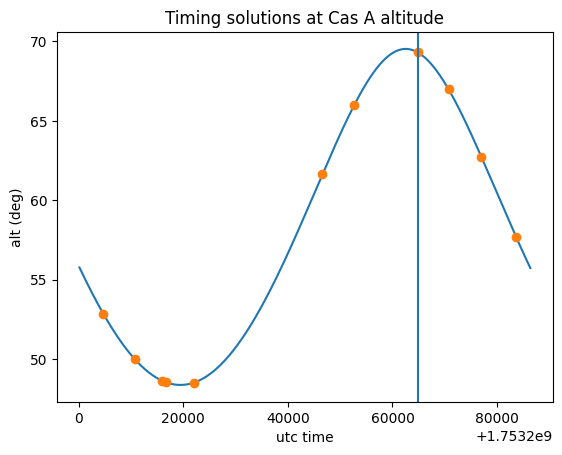

In [39]:
interp_alt = np.interp(satpulse_ctime_utc, coarse_tarr, altaz1.alt.value)
plt.plot(coarse_tarr, altaz1.alt.value )
plt.plot(satpulse_ctime_utc, interp_alt,ls='',marker='o')
plt.title("Timing solutions at Cas A altitude")
plt.xlabel("utc time")
plt.ylabel("alt (deg)")
plt.axvline(satpulse_ctime_utc[7])

In [40]:
deltat=2 #s
deltaf=20e3 #Hz
block_time = int(deltat/dt)
block_freq = int(deltaf/df)
# block_time = 1
# block_freq = 1
out_time = (arr.shape[0] + block_time - 1) // block_time
out_freq = (arr.shape[1] + block_freq - 1) // block_freq
rfi_filt_vis_avg = np.zeros((out_time,out_freq,nbl),dtype='complex64', order='F') #excl mars2
rfi_filt_vis_cnt = np.zeros((out_time,out_freq,nbl),dtype='int64', order='F') #excl mars2

In [41]:
rfi_filt_vis_avg.shape

(53534, 103, 21)

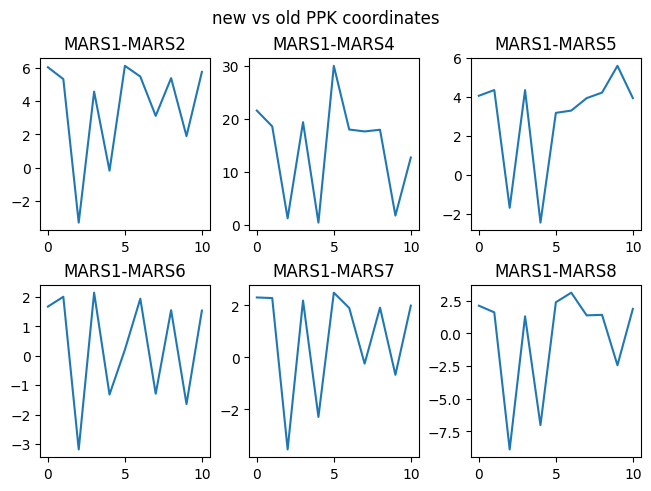

In [42]:
fig,ax=plt.subplots(2,3,constrained_layout=True)
ax=np.ravel(ax)
fig.suptitle("new vs old PPK coordinates")
for i in range(1,nant):
    ax[i-1].set_title(f"{antmap[0]}-{antmap[i]}")
    ax[i-1].plot(np.asarray(satpulse_clock_offsets[i])-np.asarray(satpulse_clock_offsets_old[i]))

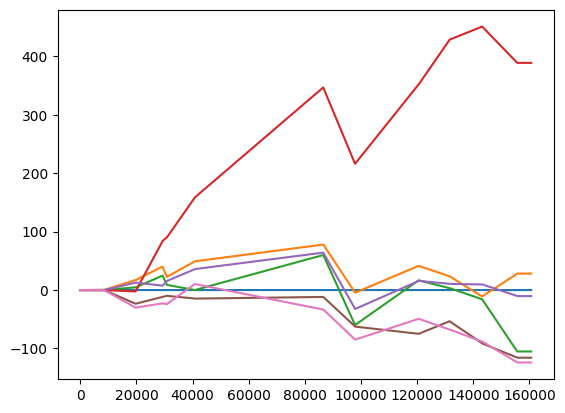

In [43]:
plt.plot((clock_delays-clock_delays[:,0][:,None]).T)

In [44]:
# imgdir = f"test_img/{datetime.now().strftime('%Y%m%d_%H%M%S')}"
# os.makedirs(imgdir,exist_ok=True)
idx=0
for i in range(nbl):
    ai = triu_idx[0][i]
    aj = triu_idx[1][i]
    # if ai==aj or ai==1 or aj==1: 
    #     continue #skip autos and MARS2
    print(antmap[ai], antmap[aj])
    vis = arr[:,:,i + 1 + ai]
    # print("vis", i, "has", temp_triu_idx[0][i], temp_triu_idx[1][i], "vs actual", ai, aj)
    sign_geo = 0
    sign_clock = 1
    offset =  (clock_delays[ai]-clock_delays[aj])/4 #units of ADC samples
    # delay =  (clock_delays[ai]-clock_delays[aj])/4 #units of ADC samples
    delay = sign_geo * geo_delays_bl[i,:]/4e-9 + sign_clock * offset 
    vis_avg, vis_cnt = rfitools.block_average_masked_delay(vis,masks[idx],freqs,delay,block_time,block_freq)
    print(f"{antmap[ai]}-{antmap[aj]} {bl_enus[i,0]:.2f}, {bl_enus[i,1]:.2f}, {bl_enus[i,2]:.2f}, geo delay[0] {geo_delays_bl[i,0]*1e6:.2} us")
    rfi_filt_vis_avg[:,:,idx]=vis_avg
    rfi_filt_vis_cnt[:,:,idx]=vis_cnt
    idx+=1

MARS1 MARS2
MARS1-MARS2 174.34, 4.10, -4.89, geo delay[0] -0.22 us
MARS1 MARS4
MARS1-MARS4 -5181.91, -3193.90, -165.66, geo delay[0] -2.0 us
MARS1 MARS5
MARS1-MARS5 2047.69, 129.17, -128.66, geo delay[0] -2.4 us
MARS1 MARS6
MARS1-MARS6 -669.94, -2141.08, -146.65, geo delay[0] -4.9 us
MARS1 MARS7
MARS1-MARS7 1477.02, -634.12, -156.53, geo delay[0] -3.7 us
MARS1 MARS8
MARS1-MARS8 1003.35, 2970.24, 226.19, geo delay[0] 6.7 us
MARS2 MARS4
MARS2-MARS4 -5356.25, -3198.00, -160.77, geo delay[0] -1.8 us
MARS2 MARS5
MARS2-MARS5 1873.35, 125.07, -123.77, geo delay[0] -2.2 us
MARS2 MARS6
MARS2-MARS6 -844.28, -2145.17, -141.76, geo delay[0] -4.7 us
MARS2 MARS7
MARS2-MARS7 1302.69, -638.21, -151.64, geo delay[0] -3.5 us
MARS2 MARS8
MARS2-MARS8 829.01, 2966.15, 231.08, geo delay[0] 7.0 us
MARS4 MARS5
MARS4-MARS5 7229.60, 3323.06, 37.00, geo delay[0] -0.44 us
MARS4 MARS6
MARS4-MARS6 4511.97, 1052.82, 19.01, geo delay[0] -2.9 us
MARS4 MARS7
MARS4-MARS7 6658.93, 2559.78, 9.13, geo delay[0] -1.7 us
MARS

dump some data near one of the pulse

In [45]:
good_freq_idx = np.bitwise_and.reduce(rfi_filt_vis_cnt[0,:,1:]>0, axis=1) #across all baselines, excluding MARS1-2 because we wont use it

In [46]:
fstart = 360 * 64 * df
fstart

21972656.25

In [47]:
block_freq*df * 60 + fstart, block_time*dt

(23117065.4296875, 1.6106127360000002)

In [48]:
tstart + block_time*dt/2

1753200150.0936987

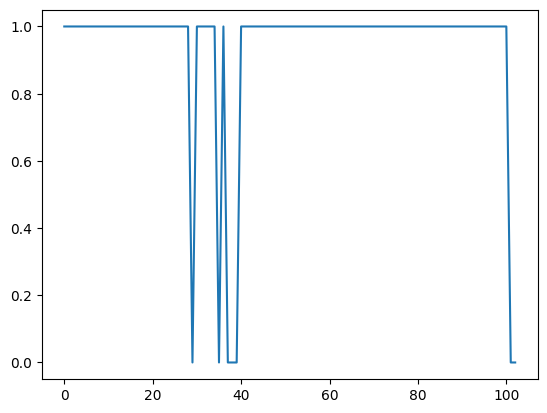

In [49]:
plt.plot(good_freq_idx)

In [50]:
rfi_filt_vis_avg.shape

(53534, 103, 21)

In [51]:
np.save("/scratch/thomasb/vis_full_day_23MHz_1.6sec_1753200150.full.npy", rfi_filt_vis_avg)

In [52]:
np.save("/scratch/thomasb/vis_full_day_23MHz_1.6sec_1753200150.cnt.npy", rfi_filt_vis_cnt)

In [53]:
raw_st, raw_en = 3000*block_time, 4000*block_time

In [54]:
raw_nfreq = 2000

In [55]:
masks[0]

array([[False, False, False, ...,  True,  True,  True],
       [False, False, False, ...,  True,  True,  True],
       [False, False, False, ...,  True,  True,  True],
       ...,
       [False, False, False, ...,  True,  True,  True],
       [False, False, False, ...,  True,  True,  True],
       [False, False, False, ...,  True,  True,  True]],
      shape=(160600, 2048))

In [56]:
npmasks[0]

NameError: name 'npmasks' is not defined

In [195]:
np.sum(masks[0] ^ npmasks[0])

np.int64(0)

In [57]:
arr[3000 * block_time:  4000*block_time,:2000,:].nbytes/1e9

1.344

In [59]:
pulse_time = satpulse_ctime_utc[7]
avg_idx_st = np.round(np.argmin(np.abs(fine_tarr - pulse_time))/block_time).astype(int)
avg_idx_en = np.round((np.argmin(np.abs(fine_tarr - pulse_time)) + 10/dt)/block_time).astype(int) # 10sec after pulse start
print(avg_idx_st, avg_idx_en)

40162 40168


In [60]:
tstart + avg_idx_st * block_time * dt, pulse_time

(np.float64(1753264834.7170956), 1753264834)

In [61]:
freqs[0]

np.float64(360.0)

In [62]:
#dump data
np.savez("/scratch/thomasb/vis_dump2.npz", vis=rfi_filt_vis_avg[avg_idx_st:avg_idx_en], cnt=rfi_filt_vis_cnt[avg_idx_st:avg_idx_en], deltat = dt *block_time, deltaf = df*block_freq, tstart=tstart + avg_idx_st * block_time * dt)

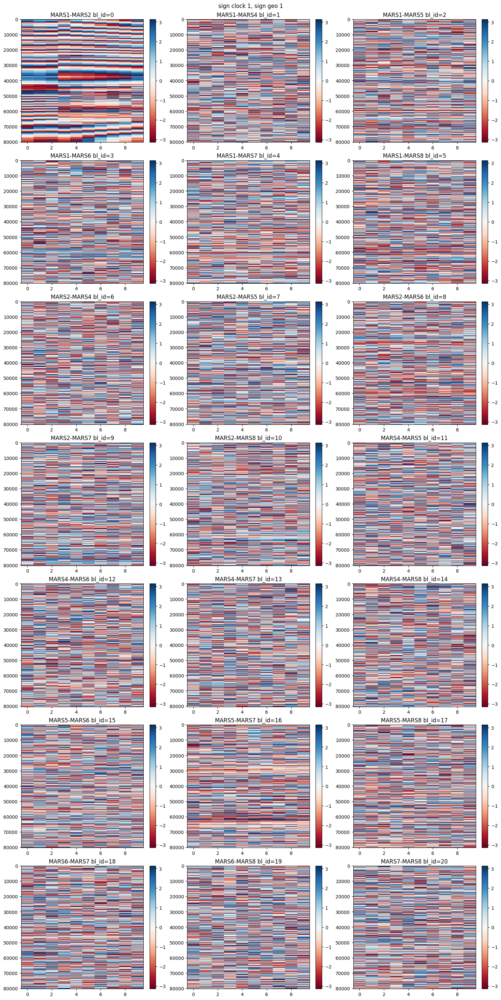

In [34]:
fig,ax = plt.subplots(7,3, layout='constrained')
fig.set_size_inches(15,30)
ax=np.ravel(ax)
pnum=0
fig.suptitle(f"sign clock {sign_clock}, sign geo {sign_geo}")
for i in range(nbl):
    ai = triu_idx[0][i]
    aj = triu_idx[1][i]
    # if aj!=6: 
    #     continue #skip autos and MARS2
    ax[pnum].set_title(f"{antmap[ai]}-{antmap[aj]} bl_id={(i)}")
    ax[pnum].set_title(f"{antmap[ai]}-{antmap[aj]} bl_id={(i)}")
    img=ax[pnum].imshow(np.angle(rfi_filt_vis_avg[:,:,i]),aspect='auto',cmap='RdBu',interpolation='none')
    cbar=plt.colorbar(img,ax=ax[pnum])
    # ax[pnum].set_ylim(600,800)
    # ax[pnum].set_ylim(3000,4000)
    pnum+=1

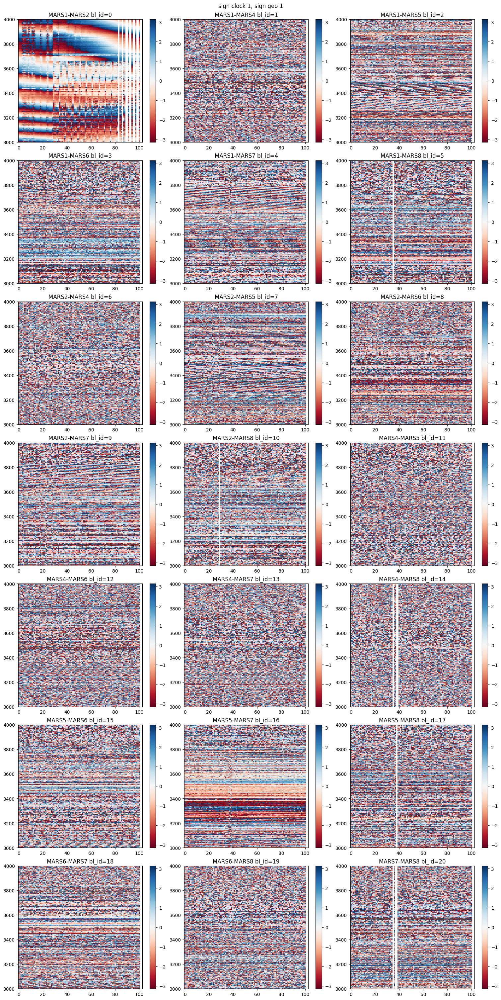

In [122]:
fig,ax = plt.subplots(7,3, layout='constrained')
fig.set_size_inches(15,30)
ax=np.ravel(ax)
pnum=0
fig.suptitle(f"sign clock {sign_clock}, sign geo {sign_geo}")
for i in range(nbl):
    ai = triu_idx[0][i]
    aj = triu_idx[1][i]
    # if aj!=6: 
    #     continue #skip autos and MARS2
    ax[pnum].set_title(f"{antmap[ai]}-{antmap[aj]} bl_id={(i)}")
    ax[pnum].set_title(f"{antmap[ai]}-{antmap[aj]} bl_id={(i)}")
    img=ax[pnum].imshow(np.angle(rfi_filt_vis_avg[:,:,i]),aspect='auto',cmap='RdBu',interpolation='none')
    cbar=plt.colorbar(img,ax=ax[pnum])
    # ax[pnum].set_ylim(600,800)
    ax[pnum].set_ylim(3000,4000)
    pnum+=1

In [115]:
rfi_filt_vis_avg.shape

(4341, 103, 21)

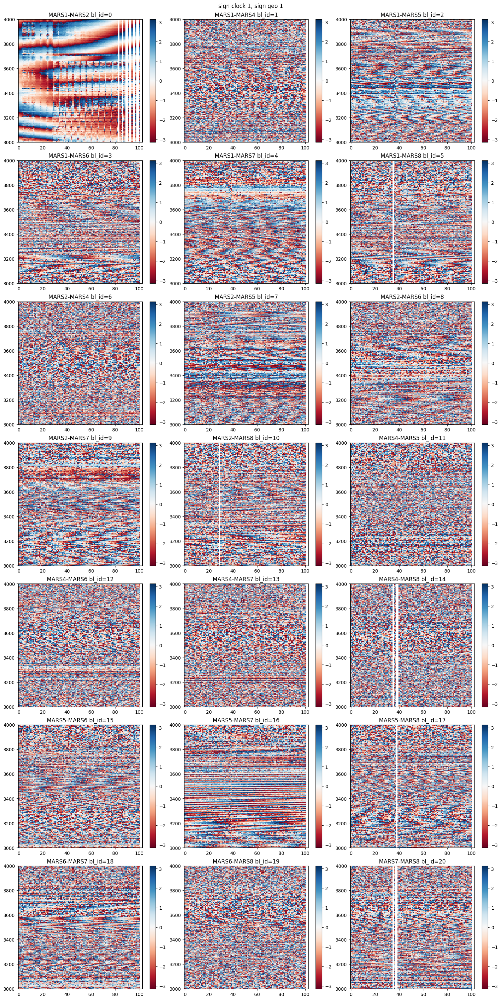

In [127]:
fig,ax = plt.subplots(7,3, layout='constrained')
fig.set_size_inches(15,30)
ax=np.ravel(ax)
pnum=0
fig.suptitle(f"sign clock {sign_clock}, sign geo {sign_geo}")
for i in range(nbl):
    ai = triu_idx[0][i]
    aj = triu_idx[1][i]
    # if aj!=6: 
    #     continue #skip autos and MARS2
    ax[pnum].set_title(f"{antmap[ai]}-{antmap[aj]} bl_id={(i)}")
    ax[pnum].set_title(f"{antmap[ai]}-{antmap[aj]} bl_id={(i)}")
    img=ax[pnum].imshow(np.angle(rfi_filt_vis_avg[:,:,i]),aspect='auto',cmap='RdBu',interpolation='none')
    cbar=plt.colorbar(img,ax=ax[pnum])
    # ax[pnum].set_ylim(600,800)
    ax[pnum].set_ylim(3000,4000)
    pnum+=1

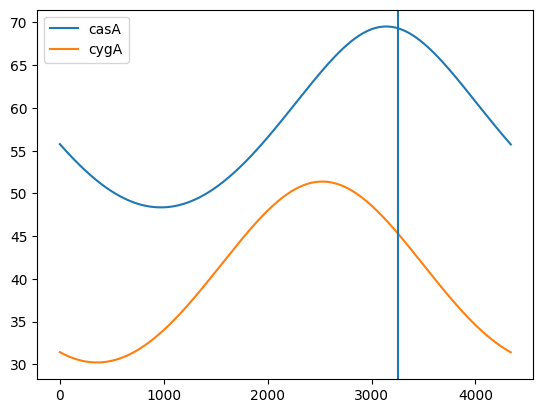

In [117]:
tblock = np.arange(out_time) * dt * block_time
plt.plot(np.arange(out_time), np.interp(tblock, coarse_tarr-coarse_tarr[0], altaz1.alt.value),label='casA')
plt.plot(np.arange(out_time), np.interp(tblock, coarse_tarr-coarse_tarr[0], altaz2.alt.value),label='cygA')
plt.axvline(3256)
plt.legend()

In [82]:
bl_enus.T@bl_enus

array([[2.41857952e+08, 1.38851052e+08, 4.59581237e+06],
       [1.38851052e+08, 1.60029545e+08, 1.02426898e+07],
       [4.59581237e+06, 1.02426898e+07, 8.60671897e+05]])

In [90]:
bl_lengths = np.sqrt(np.sum(bl_enus*bl_enus,axis=1))
lamda = 3e8/21e6
for i in range(nbl):
    ai = triu_idx[0][i]
    aj = triu_idx[1][i]
    print(antmap[ai], antmap[aj], bl_lengths[i], f"{np.rad2deg(lamda/bl_lengths[i])*60:.2f}")

MARS1 MARS2 173.49336962009997 283.07
MARS1 MARS4 6093.595780043635 8.06
MARS1 MARS5 2054.7556646098997 23.90
MARS1 MARS6 2249.148225085432 21.84
MARS1 MARS7 1614.4625077681817 30.42
MARS1 MARS8 3142.6348622598553 15.63
MARS2 MARS4 6242.974436012864 7.87
MARS2 MARS5 1881.5869216765964 26.10
MARS2 MARS6 2308.8393874548938 21.27
MARS2 MARS7 1458.165560670017 33.68
MARS2 MARS8 3089.6736343894113 15.90
MARS4 MARS5 7959.788102858228 6.17
MARS4 MARS6 4636.144379511189 10.59
MARS4 MARS7 7137.055283864947 6.88
MARS4 MARS8 8744.158203527755 5.62
MARS5 MARS6 3541.22362824268 13.87
MARS5 MARS7 953.4454559154785 51.51
MARS5 MARS8 3048.113536905122 16.11
MARS6 MARS7 2623.166968423409 18.72
MARS6 MARS8 5391.431699213597 9.11
MARS7 MARS8 3655.9372676105845 13.43
